# Project 5: Vehicle Detection and Tracking
##### A Udacity Self-Driving Car Nanodegree Project

#### Matthew Zimmer's Classroom Notes

[GitHub](https://github.com/matthewzimmer) | [LinkedIn](https://www.linkedin.com/in/matthewazimmer)

In [2]:
import numpy as np
import cv2
import glob
import os
import pickle

import matplotlib
matplotlib.use('qt5agg')
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

from IPython.display import YouTubeVideo
def youtube(video_id, width=880, height=495):
    return YouTubeVideo(video_id, width=width, height=height)

def plot_img(img, cmap=None, interpolation='none', aspect='auto'):
    shape = img.shape[0:2][::-1]
    ar = shape[1]/shape[0]
    fig1 = plt.figure(figsize=(10,10*ar))
    ax = fig1.add_subplot(111)
    ax.imshow(img, cmap=cmap, interpolation=interpolation, aspect=aspect)
    plt.tight_layout()
    plt.show()

#### Vehicle Detection Pipeline Ops

In [2]:
from pipeline_ops import PipelineOp

class DrawBoxesOp(PipelineOp):
    def __init__(self, img, bboxes, color=(0, 140, 255), thickness=5):
        PipelineOp.__init__(self)
        self.__img = img
        self.__bboxes = bboxes
        self.__color = color
        self.__thickness = thickness

    def perform(self):
        # Make a copy of the image
        output = np.copy(self.__img)
        # Iterate through the bounding boxes
        for pt1, pt2 in self.__bboxes:
            # Draw a rectangle given bbox coordinates
            cv2.rectangle(output, pt1, pt2, self.__color, thickness=self.__thickness)
        return self._apply_output(output)


class ReshapeAndCvtColorOp(PipelineOp):
    def __init__(self, img, color_space=None, size=(32, 32)):
        PipelineOp.__init__(self)
        self.__img = np.copy(img)
        self.__color_space = color_space
        self.__size = size
    
    def perform(self):
        output = self.__img
        
        # Convert image to new color space (if specified)
        if self.__color_space != None and self.__color_space != 'RGB':
            output = cv2.cvtColor(output, eval('cv2.COLOR_BGR2'+self.__color_space))
        
        # Use cv2.resize().ravel() to convert the image matrix to a vector
        if self.__size is not None:
            output = cv2.resize(output, self.__size).ravel()
        
        # Return the feature vector
        return self._apply_output(output)


# Define a function to compute color histogram features  
class ColorHistOp(PipelineOp):
    def __init__(self, img, nbins=32, bins_range=(0, 256)):
        PipelineOp.__init__(self)
        self.__img = np.copy(img)
        self.__nbins = nbins
        self.__bins_range = bins_range
        
    def perform(self):
        img = self.__img
        # Compute the histogram of the RGB channels separately
        rhist = np.histogram(img[:,:,0], bins=self.__nbins, range=self.__bins_range)
        ghist = np.histogram(img[:,:,1], bins=self.__nbins, range=self.__bins_range)
        bhist = np.histogram(img[:,:,2], bins=self.__nbins, range=self.__bins_range)
        # Generating bin centers
        bin_edges = rhist[1]
        bin_centers = (bin_edges[1:]  + bin_edges[0:len(bin_edges)-1])/2
        # Concatenate the histograms into a single feature vector
        # These, collectively, are now our feature vector for this particular image.
        hist_features = np.concatenate((rhist[0], ghist[0], bhist[0]))
        # Return the individual histograms, bin_centers and feature vector
        return self._apply_output((rhist, ghist, bhist, bin_centers, hist_features))


from mpl_toolkits.mplot3d import Axes3D
class Plot3dOp(PipelineOp):
    def __init__(self, pixels, colors_rgb, axis_labels=list("RGB"), axis_limits=[(0, 255), (0, 255), (0, 255)]):
        PipelineOp.__init__(self)
        self.__pixels = pixels
        self.__colors_rgb = colors_rgb
        self.__axis_labels = axis_labels
        self.__axis_limits = axis_limits
    
    def perform(self):
        """Plot pixels in 3D."""

        # Create figure and 3D axes
        fig = plt.figure(figsize=(8, 8))
        ax = Axes3D(fig)

        # Set axis limits
        ax.set_xlim(*self.__axis_limits[0])
        ax.set_ylim(*self.__axis_limits[1])
        ax.set_zlim(*self.__axis_limits[2])

        # Set axis labels and sizes
        ax.tick_params(axis='both', which='major', labelsize=14, pad=8)
        ax.set_xlabel(self.__axis_labels[0], fontsize=16, labelpad=16)
        ax.set_ylabel(self.__axis_labels[1], fontsize=16, labelpad=16)
        ax.set_zlabel(self.__axis_labels[2], fontsize=16, labelpad=16)

        # Plot pixel values with colors given in colors_rgb
        ax.scatter(
            self.__pixels[:, :, 0].ravel(),
            self.__pixels[:, :, 1].ravel(),
            self.__pixels[:, :, 2].ravel(),
            c=self.__colors_rgb.reshape((-1, 3)), edgecolors='none')

        # return Axes3D object for further manipulation
        return self._apply_output(ax)
    
from skimage.feature import hog
class HOGExtractorOp(PipelineOp):
    def __init__(self, img, orient, pix_per_cell, cell_per_block, visualize=False, feature_vec=True, normalize=True):
        PipelineOp.__init__(self)
        self.__img = np.copy(img)
        self.__orient = orient
        self.__pix_per_cell = pix_per_cell
        self.__cell_per_block = cell_per_block
        self.__visualize = visualize
        self.__feature_vec = feature_vec
        self.__transform_sqrt = normalize
    
    def perform(self):
        features = None
        hog_image = None
        if self.__visualize == True:
            # Use skimage.hog() to get both features and a visualization
            features, hog_image = hog(self.__img, orientations=self.__orient, 
                                      pixels_per_cell=(self.__pix_per_cell, self.__pix_per_cell), 
                                      cells_per_block=(self.__cell_per_block, self.__cell_per_block), 
                                      visualise=self.__visualize, 
                                      feature_vector=self.__feature_vec, 
                                      transform_sqrt=self.__transform_sqrt)
        else:
            # Use skimage.hog() to get features only
            features = hog(self.__img, orientations=self.__orient, 
                           pixels_per_cell=(self.__pix_per_cell, self.__pix_per_cell), 
                           cells_per_block=(self.__cell_per_block, self.__cell_per_block), 
                           visualise=self.__visualize, 
                           feature_vector=self.__feature_vec, 
                           transform_sqrt=self.__transform_sqrt)
        return self._apply_output((features, hog_image))

### 1. Intro To Vehicle Tracking

[classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/2b62a1c3-e151-4a0e-b6b6-e424fa46ceab/lessons/fd66c083-4ccb-4fe3-bda1-c29db76f50a0/concepts/b761da7f-bea8-4458-9eae-4a7d494cf7e6)

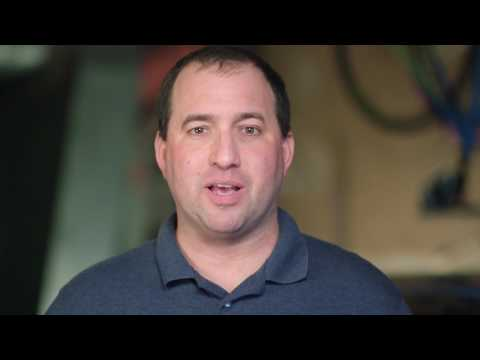

In [3]:
youtube('BAe-zslg088')

### 2. Intro to Arpan and Drew

[classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/2b62a1c3-e151-4a0e-b6b6-e424fa46ceab/lessons/fd66c083-4ccb-4fe3-bda1-c29db76f50a0/concepts/a5f759ff-0dc9-429a-afe7-67d93038d91c)

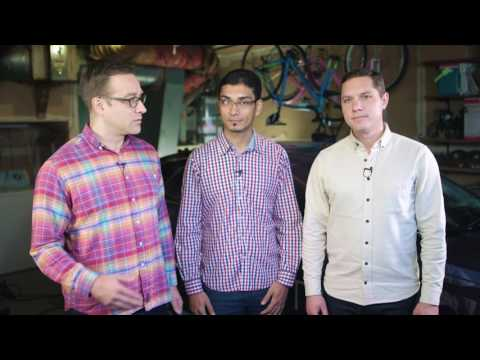

In [4]:
youtube('zfWvntpxbK0')

### 3. Finding Cars

[classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/2b62a1c3-e151-4a0e-b6b6-e424fa46ceab/lessons/fd66c083-4ccb-4fe3-bda1-c29db76f50a0/concepts/668a9625-e1ee-494d-a56d-a1107ac47629)

![](notes/3_finding_cars_quiz.png)

### 4. Object Detection Overview

[classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/2b62a1c3-e151-4a0e-b6b6-e424fa46ceab/lessons/fd66c083-4ccb-4fe3-bda1-c29db76f50a0/concepts/5566c4ff-caaf-41b4-b02a-551c2f6924ad)

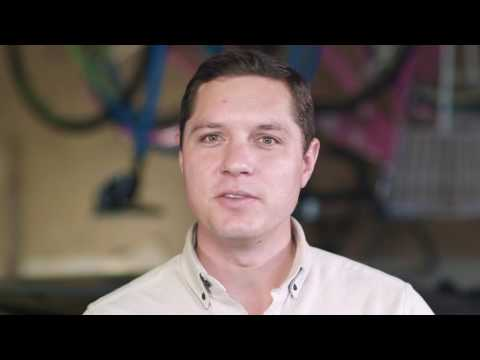

In [5]:
youtube('zNBWOHycI0I')

### 5. Manual Vehicle Detection

[classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/2b62a1c3-e151-4a0e-b6b6-e424fa46ceab/lessons/fd66c083-4ccb-4fe3-bda1-c29db76f50a0/concepts/b725c710-83fb-49a6-a6dd-e48c4b14a1ba)

![](https://d17h27t6h515a5.cloudfront.net/topher/2016/December/5859ace3_bbox-example-image/bbox-example-image.jpg)

Here's your chance to be a human vehicle detector! In this lesson, you will be drawing a lot of bounding boxes on vehicle positions in images. Eventually, you'll have an algorithm that's spewing out bounding box positions and you'll want an easy way to plot them up over your images. So, now is a good time to get familiar with the `cv2.rectangle()` function ([documentation](http://docs.opencv.org/2.4/modules/core/doc/drawing_functions.html)) that makes it easy to draw boxes of different size, shape and color.

In this exercise, your goal is to write a function that takes as its arguments, an image, and a list of bounding box coordinates for each car. Your function should then draw bounding boxes on a copy of the image and return that as its output.

#### Your output should look something like this:

![](https://d17h27t6h515a5.cloudfront.net/topher/2016/December/5859af73_manual-bbox-quiz-output/manual-bbox-quiz-output.jpg)

Here, I don't actually care whether you identify the same cars as I do, or that you draw the same boxes, only that your function takes the appropriate inputs and yields the appropriate output. So here's what it should look like:

```python
# Define a function that takes an image, a list of bounding boxes, 
# and optional color tuple and line thickness as inputs
# then draws boxes in that color on the output

def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # make a copy of the image
    img = np.copy(img)
    
    # draw each bounding box on your image copy using cv2.rectangle()
    for pt1, pt2 in bboxes:
        cv2.rectangle(img, pt1, pt2, color, thickness=thick)
    
    # return the image copy with boxes drawn
    return img
```

You'll draw bounding boxes with `cv2.rectangle()` like this:

```python
cv2.rectangle(image_to_draw_on, (x1, y1), (x2, y2), color, thick)
```

In this call to **cv2.rectangle()** your **image_to_draw_on** should be the copy of your image, then **(x1, y1)** and **(x2, y2)** are the x and y coordinates of any two opposing corners of the bounding box you want to draw. color is a 3-tuple, for example, (0, 0, 255) for blue, and thick is an optional integer parameter to define the box thickness.

Have a look at the image above with labeled axes, where I've drawn some bounding boxes and "guesstimate" where some of the box corners are. You should pass your bounding box positions to your draw_boxes() function as a list of tuple pairs, like this:

```python
bboxes = [((x1, y1), (x2, y2)), ((,),(,)), ...]
```

If you want to investigate the above image more closely, you can download it [here](https://s3.amazonaws.com/udacity-sdc/Vehicle_Tracking/bbox-example-image.jpg)

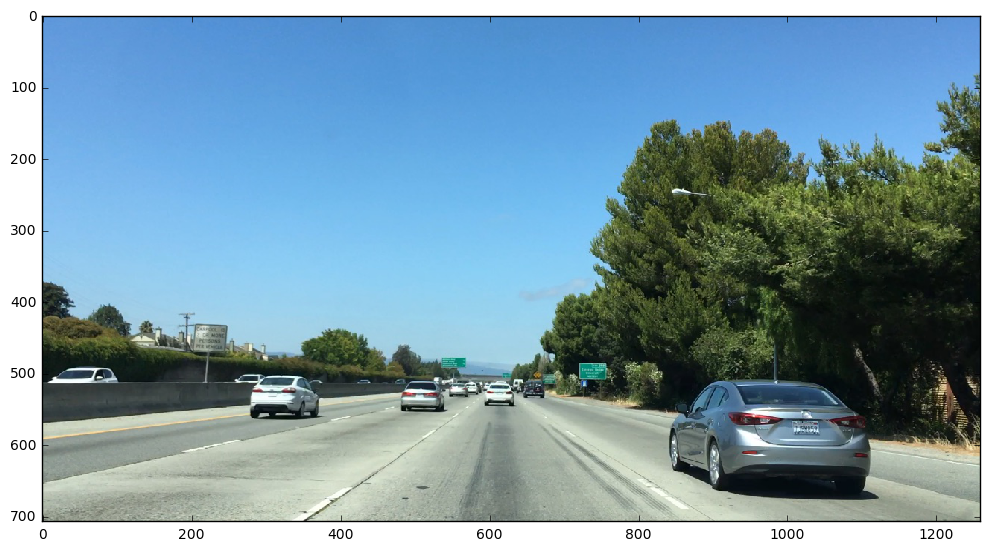

In [6]:
img = mpimg.imread('notes/bbox-example-image.jpg')
plot_img(img)

#### draw_bboxes.py

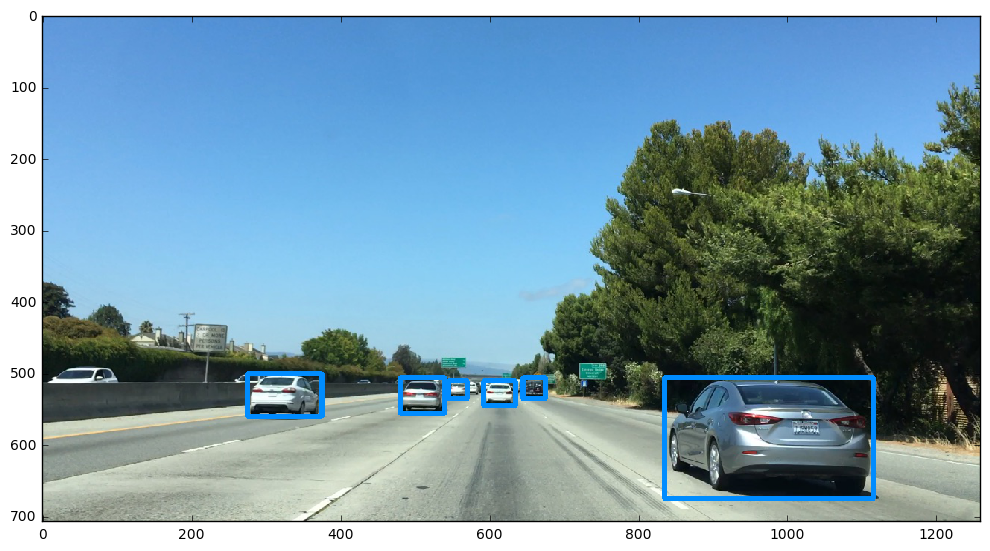

In [7]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

image = mpimg.imread('notes/bbox-example-image.jpg')

# Define a function that takes an image, a list of bounding boxes, 
# and optional color tuple and line thickness as inputs
# then draws boxes in that color on the output

def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # make a copy of the image
    draw_img = np.copy(img)
    # draw each bounding box on your image copy using cv2.rectangle()
    for pt1, pt2 in bboxes:
        cv2.rectangle(draw_img, pt1, pt2, color, thickness=thick)
    
    # return the image copy with boxes drawn
    return draw_img # Change this line to return image copy with boxes

# Add bounding boxes in this format, these are just example coordinates.
bboxes = [
    ((275, 500), (375, 560)),
    ((480, 505), (540, 555)),
    ((545, 510), (570, 535)),
    ((592, 510), (635, 545)),
    ((645, 505), (675, 535)),
    ((835, 505), (1115, 675))
]

# result = draw_boxes(image, bboxes)
result = DrawBoxesOp(image, bboxes).perform().output()

plot_img(result)

#### solution.py

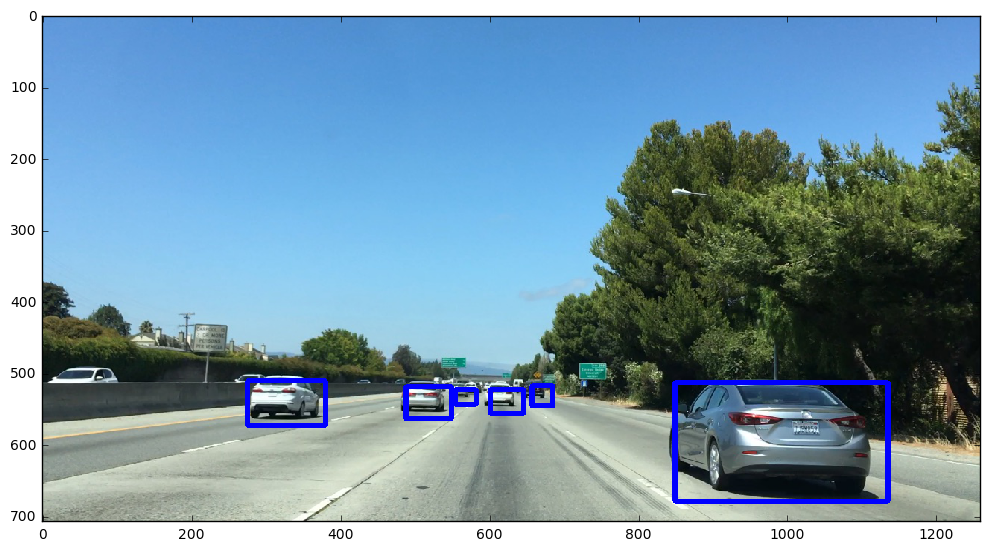

In [8]:
# Define a function that takes an image, a list of bounding boxes, 
# and optional color tuple and line thickness as inputs
# then draws boxes in that color on the output

def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # Make a copy of the image
    draw_img = np.copy(img)
    # Iterate through the bounding boxes
    for bbox in bboxes:
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(draw_img, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return draw_img

# Here are the bounding boxes I used
bboxes = [((275, 572), (380, 510)), ((488, 563), (549, 518)), ((554, 543), (582, 522)), 
          ((601, 555), (646, 522)), ((657, 545), (685, 517)), ((849, 678), (1135, 512))]


result = draw_boxes(image, bboxes)

plot_img(result)

### 6. Features

[classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/2b62a1c3-e151-4a0e-b6b6-e424fa46ceab/lessons/fd66c083-4ccb-4fe3-bda1-c29db76f50a0/concepts/814c79a8-24cd-4ee6-acbc-6afe9bb5cae0)

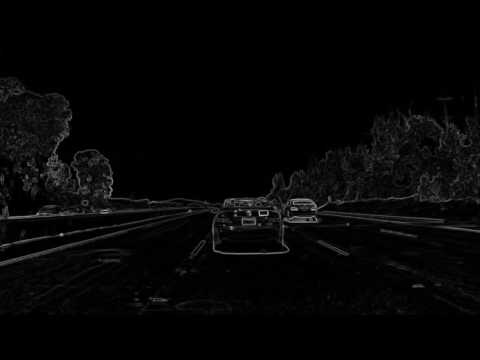

In [9]:
youtube('u3NOabeuMjA')

### 7. Feature Intuition

[classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/2b62a1c3-e151-4a0e-b6b6-e424fa46ceab/lessons/fd66c083-4ccb-4fe3-bda1-c29db76f50a0/concepts/5a2684ff-b15f-46b0-b789-dffaa851a726)

![](notes/7_feature_intuition_quiz.png)

### 8. Color Features

[classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/2b62a1c3-e151-4a0e-b6b6-e424fa46ceab/lessons/fd66c083-4ccb-4fe3-bda1-c29db76f50a0/concepts/65d4242e-7d44-4531-9327-3d829e0e72b1)

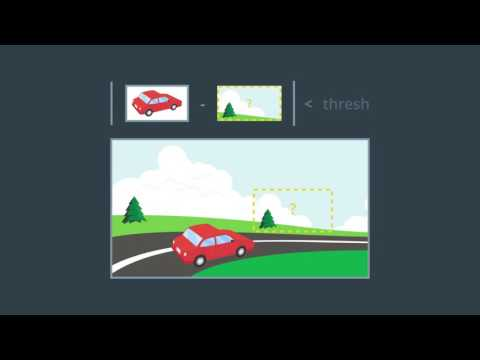

In [10]:
youtube('JT4fDW7lsG8')

### 9. Template Matching

[classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/2b62a1c3-e151-4a0e-b6b6-e424fa46ceab/lessons/fd66c083-4ccb-4fe3-bda1-c29db76f50a0/concepts/9acf11c2-a5a9-4e5a-ba86-1e92246fff99)

![](https://d17h27t6h515a5.cloudfront.net/topher/2016/December/58575221_bbox-example-image/bbox-example-image.jpg)

To figure out when template matching works and when it doesn't, let's play around with the OpenCV **cv2.matchTemplate()** function ([documentation](http://docs.opencv.org/2.4/doc/tutorials/imgproc/histograms/template_matching/template_matching.html))! In the bounding boxes exercise, I found six cars in the image above. This time, we're going to play the opposite game. Assuming we know these six cars are what we're looking for, we can use them as templates and search the image for matches.

**Let's suppose you want to find the templates shown below in the image shown above (you can download these images [here](https://s3.amazonaws.com/udacity-sdc/Vehicle_Tracking/cutouts.zip) if you like):**

![](https://d17h27t6h515a5.cloudfront.net/topher/2016/December/5859ae23_cutouts/cutouts.jpg)

Your goal in this exercise is to write a function that takes in an image and a list of templates, and returns a list of the best fit location (bounding box) for each of the templates within the image. OpenCV provides you with the handy function **cv2.matchTemplate()** ([documentation](http://docs.opencv.org/2.4/modules/imgproc/doc/object_detection.html)) to search the image, and **cv2.minMaxLoc()** ([documentation](http://docs.opencv.org/2.4/modules/core/doc/operations_on_arrays.html?highlight=minmaxloc#cv2.minMaxLoc)) to extract the location of the best match.

You can choose between "squared difference" or "correlation" methods in using **cv2.matchTemplate()**, but keep in mind with squared differences you need to locate the global minimum difference to find a match, while for correlation, you're looking for a global maximum.

Follow along with [this tutorial](http://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_imgproc/py_template_matching/py_template_matching.html) provided by OpenCV to try some different template matching techniques. The function you write should work like this:

```python
def find_matches(img, template_list):
    # Iterate over the list of templates
    # Use cv2.matchTemplate() to search the image for each template
    # NOTE: You can use any of the cv2.matchTemplate() search methods
    # Use cv2.minMaxLoc() to extract the location of the best match in each case
    # Compile a list of bounding box corners as output
    # Return the list of bounding boxes
```

**However**, the point of this exercise is not to discover why template matching works for vehicle detection, but rather, why it doesn't! So, after you have a working implementation of the **find_matches()** function, try it on the second image, temp-matching-example-2.jpg, which is currently commented out.

In the second image, all of the same six cars are visible (just a few seconds later in the video), but you'll find that none of the templates find the correct match! This is because with template matching we can only find very close matches, and changes in size or orientation of a car make it impossible to match with a template.

So, just to be clear, you goal here is to:

1. Write a function that takes in an image and list of templates and returns a list of bounding boxes.

2. Find that your function works well to locate the six example templates taken from the first image.

3. Try your code on the second image, and find that template matching breaks easily.

#### template_match.py

**TODO!!** **TODO!!** **TODO!!** **TODO!!** **TODO!!** **TODO!!**

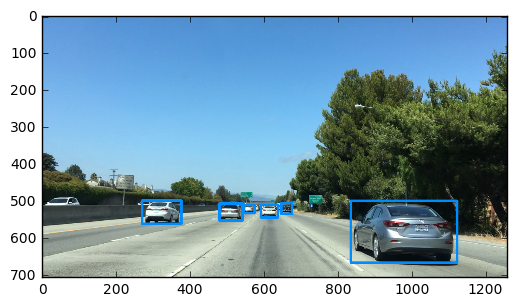

In [11]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

image = mpimg.imread('notes/bbox-example-image.jpg')
#image = mpimg.imread('temp-matching-example-2.jpg')
templist = ['notes/cutouts/cutout1.jpg', 'notes/cutouts/cutout2.jpg', 'notes/cutouts/cutout3.jpg',
            'notes/cutouts/cutout4.jpg', 'notes/cutouts/cutout5.jpg', 'notes/cutouts/cutout6.jpg']

# Here is your draw_boxes function from the previous exercise
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # Make a copy of the image
    imcopy = np.copy(img)
    # Iterate through the bounding boxes
    for bbox in bboxes:
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return imcopy
    
    
# Define a function that takes an image and a list of templates as inputs
# then searches the image and returns the a list of bounding boxes 
# for matched templates
def find_matches(img, template_list):
    method = cv2.TM_SQDIFF
    
    # Make a copy of the image to draw on
    img = img.copy()
    # Define an empty list to take bbox coords
    bbox_list = []
    # Iterate through template list
    for template in template_list:
        template = mpimg.imread(template)
        w, h = template.shape[0:2][::-1]
        
        # Read in templates one by one
        # Use cv2.matchTemplate() to search the image
        #     using whichever of the OpenCV search methods you prefer
        res = cv2.matchTemplate(img,template,method)
        # Use cv2.minMaxLoc() to extract the location of the best match
        min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
        # Determine bounding box corners for the match
        # If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
        if method in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
            top_left = min_loc
        else:
            top_left = max_loc
        bottom_right = (top_left[0] + w, top_left[1] + h)
        bbox_list.append((top_left, bottom_right))
        
    # Return the list of bounding boxes
    return bbox_list

bboxes = find_matches(image, templist)
result = DrawBoxesOp(image, bboxes).perform().output()# draw_boxes(image, bboxes)
plt.imshow(result)

#### solution.py

In [12]:
# Define a function to search for template matches
# and return a list of bounding boxes
def find_matches(img, template_list):
    # Define an empty list to take bbox coords
    bbox_list = []
    # Define matching method
    # Other options include: cv2.TM_CCORR_NORMED', 'cv2.TM_CCOEFF', 'cv2.TM_CCORR',
    #         'cv2.TM_SQDIFF', 'cv2.TM_SQDIFF_NORMED'
    method = cv2.TM_CCOEFF_NORMED
    # Iterate through template list
    for temp in template_list:
        # Read in templates one by one
        tmp = mpimg.imread(temp)
        # Use cv2.matchTemplate() to search the image
        result = cv2.matchTemplate(img, tmp, method)
        # Use cv2.minMaxLoc() to extract the location of the best match
        min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)
        # Determine a bounding box for the match
        w, h = (tmp.shape[1], tmp.shape[0])
        if method in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
            top_left = min_loc
        else:
            top_left = max_loc
        bottom_right = (top_left[0] + w, top_left[1] + h)
        # Append bbox position to list
        bbox_list.append((top_left, bottom_right))
        # Return the list of bounding boxes
        
    return bbox_list



### 10. Template Matching Quiz

[classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/2b62a1c3-e151-4a0e-b6b6-e424fa46ceab/lessons/fd66c083-4ccb-4fe3-bda1-c29db76f50a0/concepts/e9c246ed-fc99-454b-b21a-34c81b2fa62c#)

Alright, so the exercise in finding cars has so far been mostly for the purpose of getting you familiarized with searching for objects in an image and drawing bounding boxes where you find them. But before we move on, one more quiz for intuition on the method of template matching!

![](notes/10_template_matching_quiz.png)

#### Answer

![](notes/10_template_matching_quiz_answer.png)

### 11. Color Histogram Features

[classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/2b62a1c3-e151-4a0e-b6b6-e424fa46ceab/lessons/fd66c083-4ccb-4fe3-bda1-c29db76f50a0/concepts/17ef141c-8e03-4fdf-87a2-6a7b6d6dbbe6#)

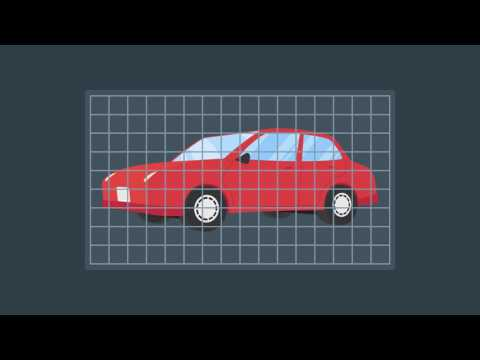

In [13]:
youtube('8ZvNANafMU8')

### 12. Histograms of Color

[classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/2b62a1c3-e151-4a0e-b6b6-e424fa46ceab/lessons/fd66c083-4ccb-4fe3-bda1-c29db76f50a0/concepts/4f0692c6-e22d-4f28-b5d0-7990a4d8de86)

You've looked at using raw pixel intensities as features and now we'll look at histograms of pixel intensity (color histograms) as features.

I'll use the template shown below from the last exercise as an example. This is a blown up version of the image, but If you want to try this yourself with the actual cutout image it's [here](https://s3.amazonaws.com/udacity-sdc/Vehicle_Tracking/cutout1.jpg):

![](https://s3.amazonaws.com/udacity-sdc/Vehicle_Tracking/cutout1.jpg)

You can construct histograms of the R, G, and B channels like this:

```python
import matplotlib.image as mpimg
import numpy as np

# Read in the image
image = mpimg.imread('cutout1.jpg')

# Take histograms in R, G, and B
rhist = np.histogram(image[:,:,0], bins=32, range=(0, 256))
ghist = np.histogram(image[:,:,1], bins=32, range=(0, 256))
bhist = np.histogram(image[:,:,2], bins=32, range=(0, 256))
```

With **np.histogram()**, you don't actually have to specify the number of bins or the range, but here I've arbitrarily chosen 32 bins and specified **range=(0, 256)** in order to get orderly bin sizes. **np.histogram()** returns a tuple of two arrays. In this case, for example, **rhist[0]** contains the counts in each of the bins and **rhist[1]** contains the bin edges (so it is one element longer than **rhist[0]**).

To look at a plot of these results, we can compute the bin centers from the bin edges. Each of the histograms in this case have the same bins, so I'll just use the rhist bin edges:

```python
# Generating bin centers
bin_edges = rhist[1]
bin_centers = (bin_edges[1:]  + bin_edges[0:len(bin_edges)-1])/2
```

And then plotting up the results in a bar chart:

```python
# Plot a figure with all three bar charts
fig = plt.figure(figsize=(12,3))
plt.subplot(131)
plt.bar(bin_centers, rhist[0])
plt.xlim(0, 256)
plt.title('R Histogram')
plt.subplot(132)
plt.bar(bin_centers, ghist[0])
plt.xlim(0, 256)
plt.title('G Histogram')
plt.subplot(133)
plt.bar(bin_centers, bhist[0])
plt.xlim(0, 256)
plt.title('B Histogram')
```

Which gives us this result:

![](https://d17h27t6h515a5.cloudfront.net/topher/2016/December/585b1c43_rgb-histogram-plot/rgb-histogram-plot.jpg)

These, collectively, are now our feature vector for this particular cutout image. We can concatenate them in the following way:

```python
hist_features = np.concatenate((rhist[0], ghist[0], bhist[0]))
```

Having a function that does all these steps might be useful for the project so for this next exercise, your goal is to write a function that takes an image and computes the RGB color histogram of features given a particular number of bins and pixels intensity range, and returns the concatenated RGB feature vector, like this:

```python
# Define a function to compute color histogram features  
def color_hist(img, nbins=32, bins_range=(0, 256)):
    # Compute the histogram of the RGB channels separately
    # Concatenate the histograms into a single feature vector
    # Return the feature vector
```

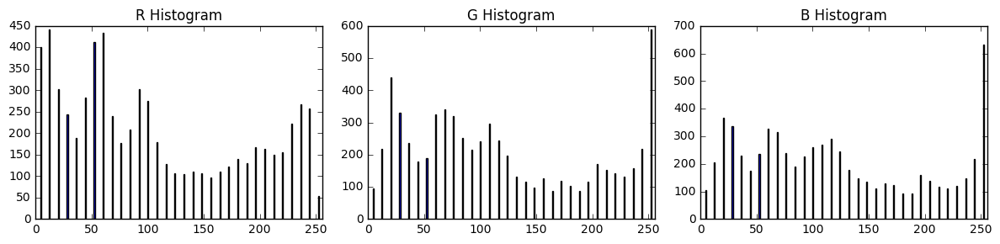

In [14]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

image = mpimg.imread('notes/cutouts/cutout1.jpg')
    
rh, gh, bh, bincen, feature_vec = ColorHistOp(image, nbins=32, bins_range=(0, 256)).perform().output()

# Plot a figure with all three bar charts
if rh is not None:
    fig = plt.figure(figsize=(12,3))
    plt.subplot(131)
    plt.bar(bincen, rh[0])
    plt.xlim(0, 256)
    plt.title('R Histogram')
    plt.subplot(132)
    plt.bar(bincen, gh[0])
    plt.xlim(0, 256)
    plt.title('G Histogram')
    plt.subplot(133)
    plt.bar(bincen, bh[0])
    plt.xlim(0, 256)
    plt.title('B Histogram')
    fig.tight_layout()
else:
    print('Your function is returning None for at least one variable...')

### 13. Color Spaces

[classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/2b62a1c3-e151-4a0e-b6b6-e424fa46ceab/lessons/fd66c083-4ccb-4fe3-bda1-c29db76f50a0/concepts/f0d97245-afa4-4bf9-a6b4-9f0fede4f0db)

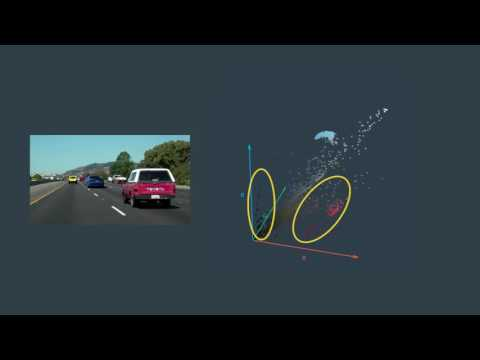

In [15]:
youtube('Adunl74VJIY')

### 14. Explore Colorspaces

[classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/2b62a1c3-e151-4a0e-b6b6-e424fa46ceab/lessons/fd66c083-4ccb-4fe3-bda1-c29db76f50a0/concepts/e8ac94ba-63a2-45c8-b4ff-b8cf88798e29)

You can study the distribution of color values in an image by plotting each pixel in some color space. Here's a code snippet that you can use to generate 3D plots:

```python
import cv2
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

def plot3d(pixels, colors_rgb,
        axis_labels=list("RGB"), axis_limits=[(0, 255), (0, 255), (0, 255)]):
    """Plot pixels in 3D."""

    # Create figure and 3D axes
    fig = plt.figure(figsize=(8, 8))
    ax = Axes3D(fig)

    # Set axis limits
    ax.set_xlim(*axis_limits[0])
    ax.set_ylim(*axis_limits[1])
    ax.set_zlim(*axis_limits[2])

    # Set axis labels and sizes
    ax.tick_params(axis='both', which='major', labelsize=14, pad=8)
    ax.set_xlabel(axis_labels[0], fontsize=16, labelpad=16)
    ax.set_ylabel(axis_labels[1], fontsize=16, labelpad=16)
    ax.set_zlabel(axis_labels[2], fontsize=16, labelpad=16)

    # Plot pixel values with colors given in colors_rgb
    ax.scatter(
        pixels[:, :, 0].ravel(),
        pixels[:, :, 1].ravel(),
        pixels[:, :, 2].ravel(),
        c=colors_rgb.reshape((-1, 3)), edgecolors='none')

    return ax  # return Axes3D object for further manipulation


# Read a color image
img = cv2.imread("000275.png")

# Select a small fraction of pixels to plot by subsampling it
scale = max(img.shape[0], img.shape[1], 64) / 64  # at most 64 rows and columns
img_small = cv2.resize(img, (np.int(img.shape[1] / scale), np.int(img.shape[0] / scale)), interpolation=cv2.INTER_NEAREST)

# Convert subsampled image to desired color space(s)
img_small_RGB = cv2.cvtColor(img_small, cv2.COLOR_BGR2RGB)  # OpenCV uses BGR, matplotlib likes RGB
img_small_HSV = cv2.cvtColor(img_small, cv2.COLOR_BGR2HSV)
img_small_rgb = img_small_RGB / 255.  # scaled to [0, 1], only for plotting

# Plot and show
plot3d(img_small_RGB, img_small_rgb)
plt.show()

plot3d(img_small_HSV, img_small_rgb, axis_labels=list("HSV"))
plt.show()
```

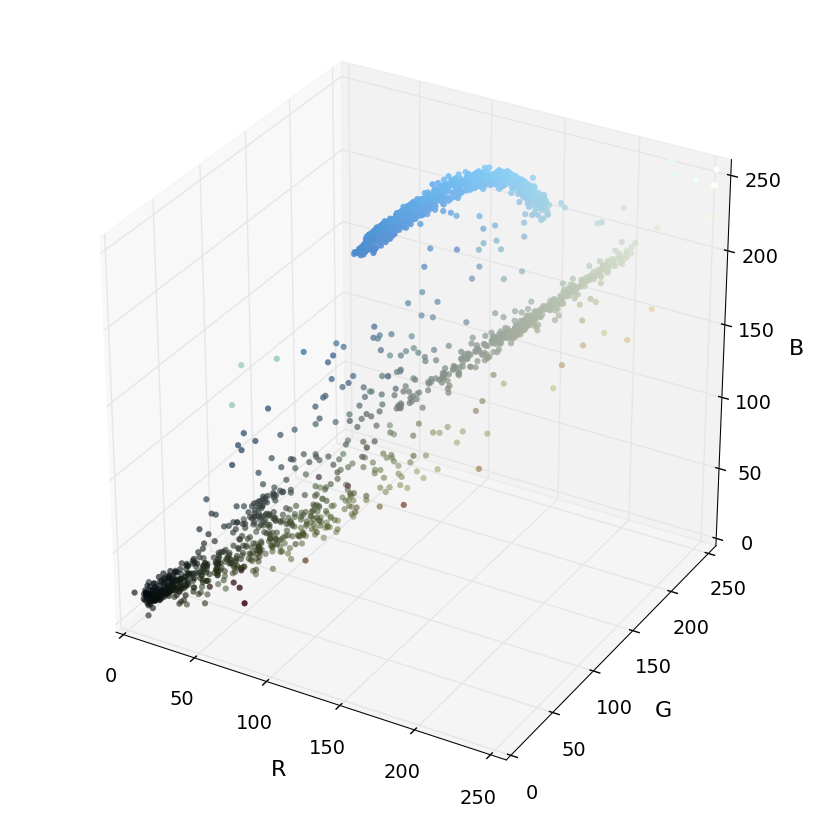

In [16]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


# Read a color image
img = cv2.imread("notes/bbox-example-image.jpg")

# Select a small fraction of pixels to plot by subsampling it
scale = max(img.shape[0], img.shape[1], 64) / 64  # at most 64 rows and columns
img_small = cv2.resize(img, (np.int(img.shape[1] / scale), np.int(img.shape[0] / scale)), interpolation=cv2.INTER_NEAREST)

# Convert subsampled image to desired color space(s)
img_small_RGB = cv2.cvtColor(img_small, cv2.COLOR_BGR2RGB)  # OpenCV uses BGR, matplotlib likes RGB
img_small_rgb = img_small_RGB / 255.  # scaled to [0, 1], only for plotting

# Plot and show
Plot3dOp(img_small_RGB, img_small_rgb).perform()
plt.show()

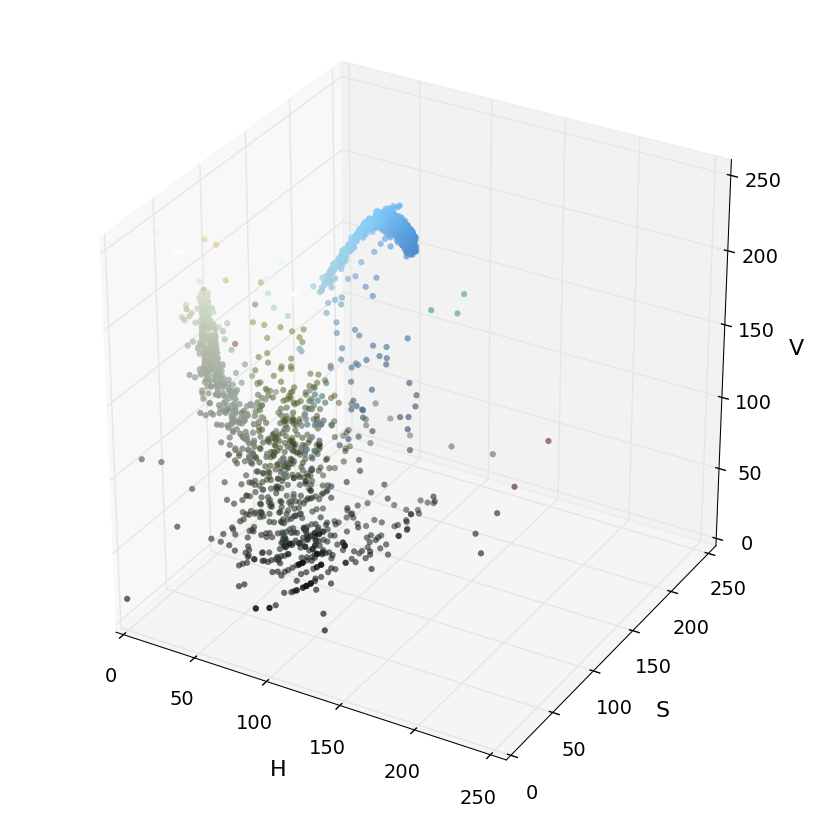

In [17]:
img_small_HSV = cv2.cvtColor(img_small, cv2.COLOR_BGR2HSV)
Plot3dOp(img_small_HSV, img_small_rgb, axis_labels=list("HSV")).perform()
plt.show()

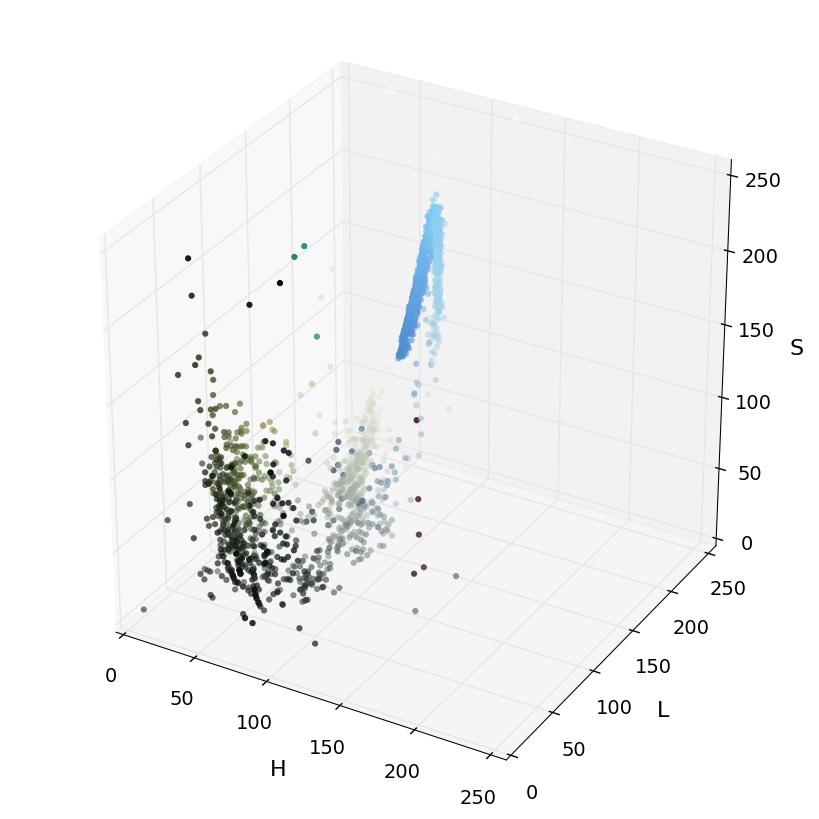

In [18]:
img_small_HLS = cv2.cvtColor(img_small, cv2.COLOR_BGR2HLS)
Plot3dOp(img_small_HLS, img_small_rgb, axis_labels=list("HLS")).perform()
plt.show()

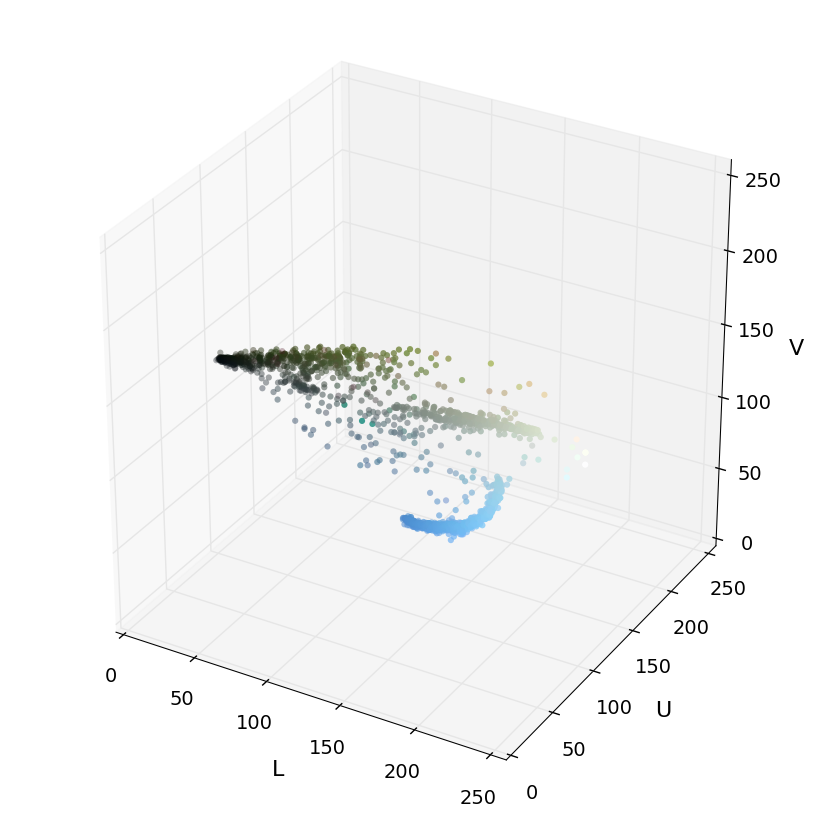

In [19]:
Plot3dOp(cv2.cvtColor(img_small, cv2.COLOR_BGR2LUV), img_small_rgb, axis_labels=list("LUV")).perform()
plt.show()

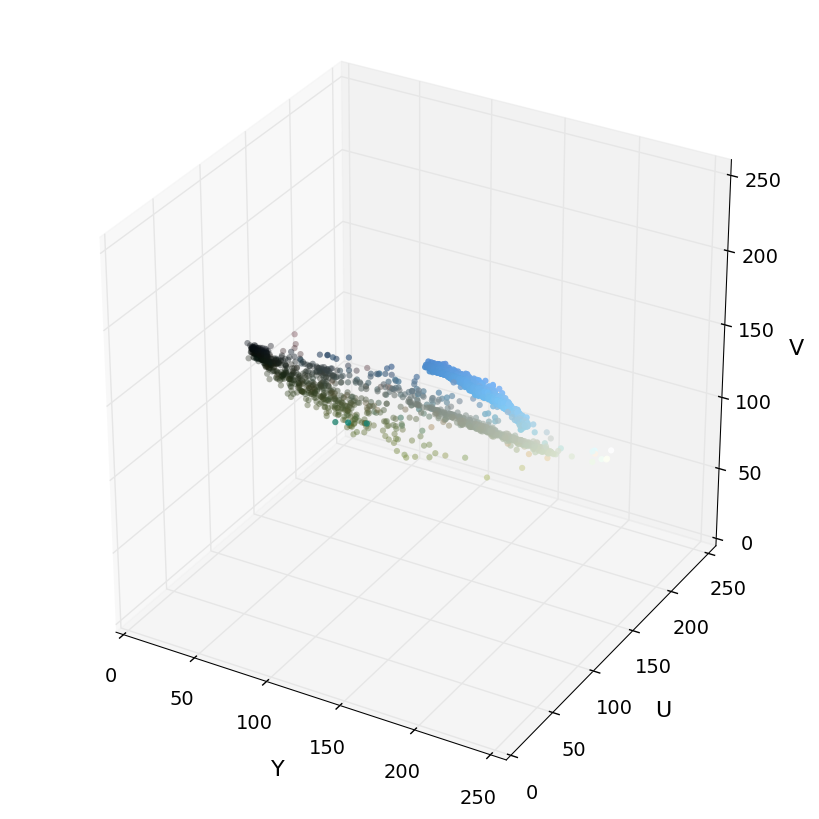

In [20]:
Plot3dOp(cv2.cvtColor(img_small, cv2.COLOR_BGR2YUV), img_small_rgb, axis_labels=list("YUV")).perform()
plt.show()

### Analyze video frames

Use this to first explore some video frames, and see if you can locate clusters of colors that correspond to the sky, trees, specific cars, etc. Here are some sample images for you to use (these are taken from the [KITTI Vision Benchmark Suite](http://www.cvlibs.net/datasets/kitti/)):

![](https://d17h27t6h515a5.cloudfront.net/topher/2016/December/585c7429_000275/000275.png)

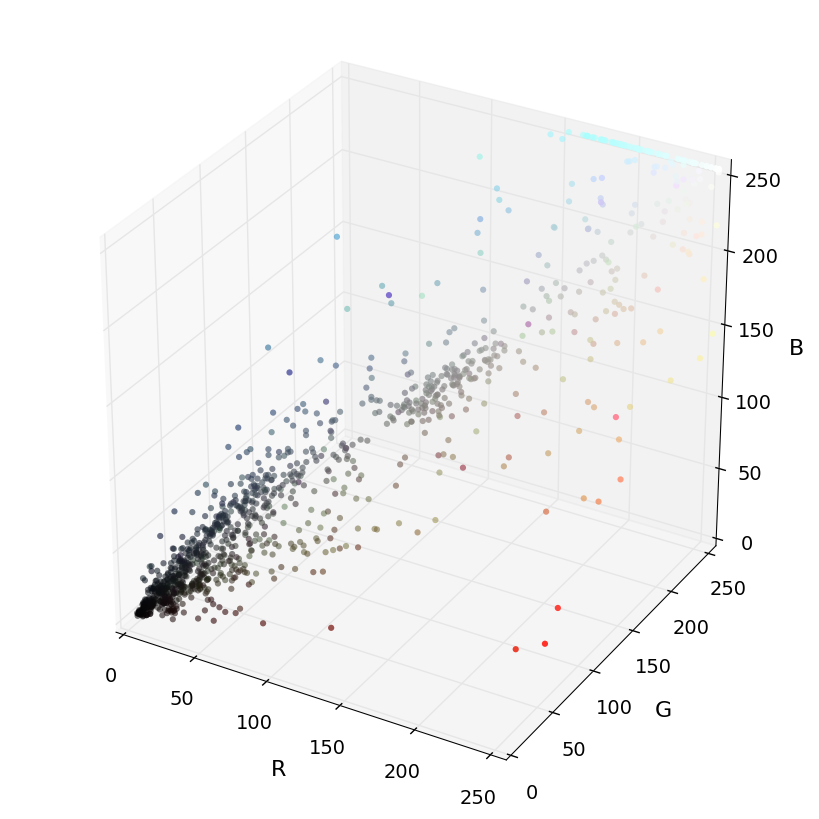

In [21]:
# Read a color image
img = cv2.imread("notes/000275.png")

# Select a small fraction of pixels to plot by subsampling it
scale = max(img.shape[0], img.shape[1], 64) / 64  # at most 64 rows and columns
img_small = cv2.resize(img, (np.int(img.shape[1] / scale), np.int(img.shape[0] / scale)), interpolation=cv2.INTER_NEAREST)

# Convert subsampled image to desired color space(s)
img_small_RGB = cv2.cvtColor(img_small, cv2.COLOR_BGR2RGB)  # OpenCV uses BGR, matplotlib likes RGB
img_small_rgb = img_small_RGB / 255.  # scaled to [0, 1], only for plotting

# Plot and show
Plot3dOp(img_small_RGB, img_small_rgb).perform()
plt.show()

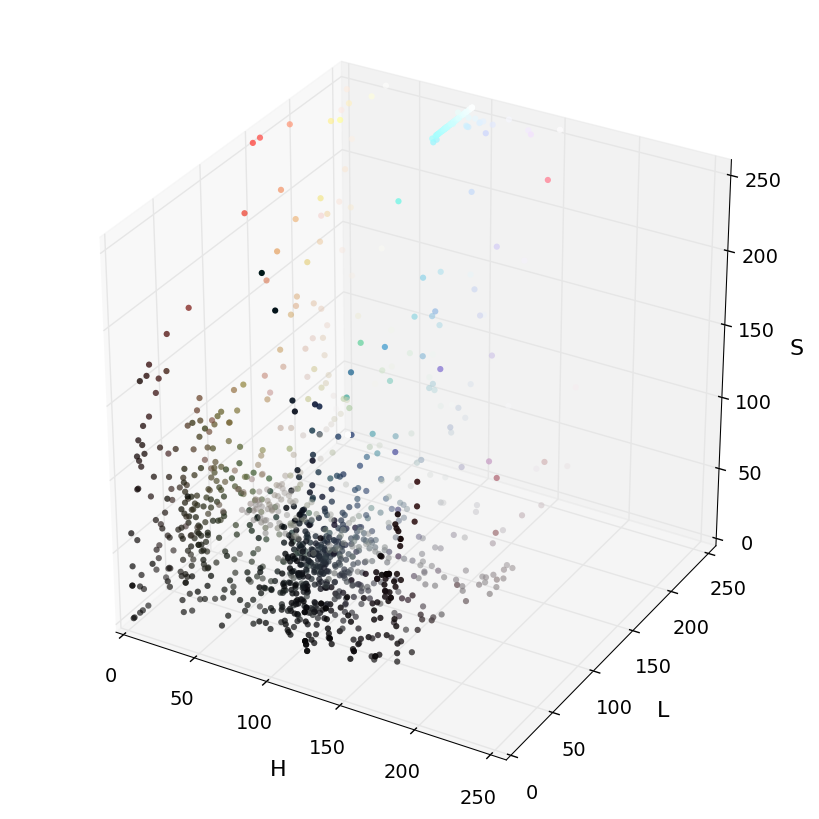

In [22]:
Plot3dOp(cv2.cvtColor(img_small, cv2.COLOR_BGR2HLS), img_small_rgb, axis_labels=list("HLS")).perform()
plt.show()

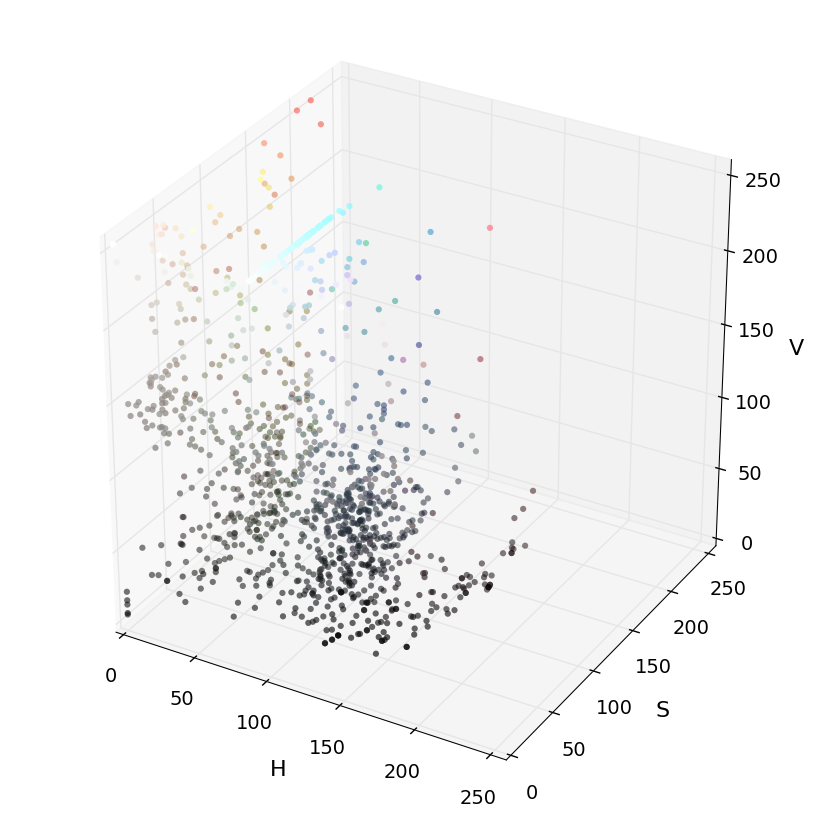

In [23]:
Plot3dOp(cv2.cvtColor(img_small, cv2.COLOR_BGR2HSV), img_small_rgb, axis_labels=list("HSV")).perform()
plt.show()

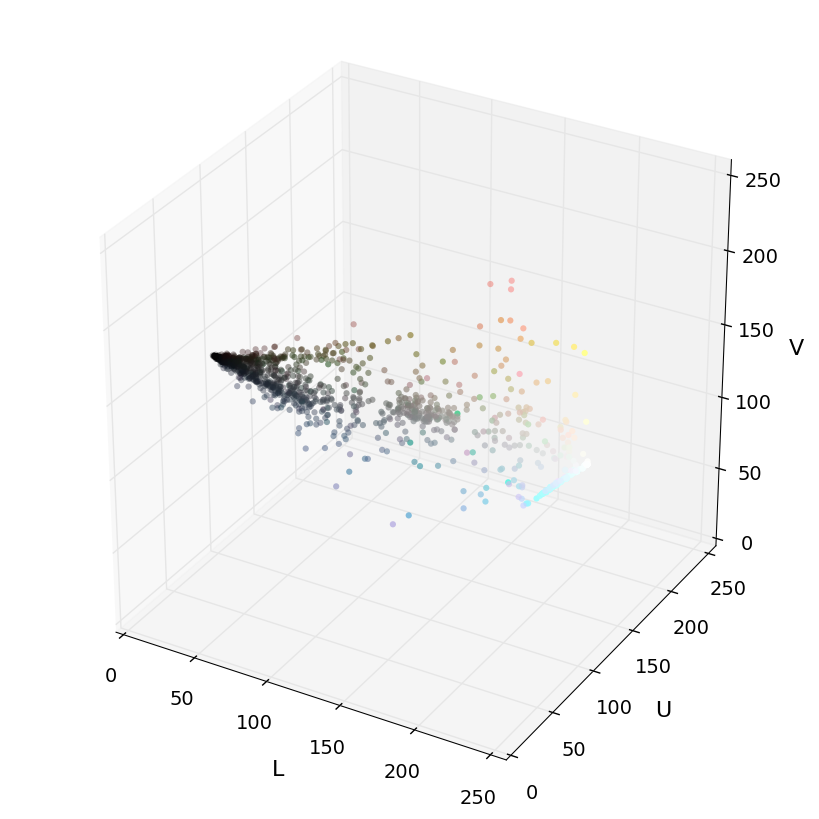

In [24]:
Plot3dOp(cv2.cvtColor(img_small, cv2.COLOR_BGR2LUV), img_small_rgb, axis_labels=list("LUV")).perform()
plt.show()

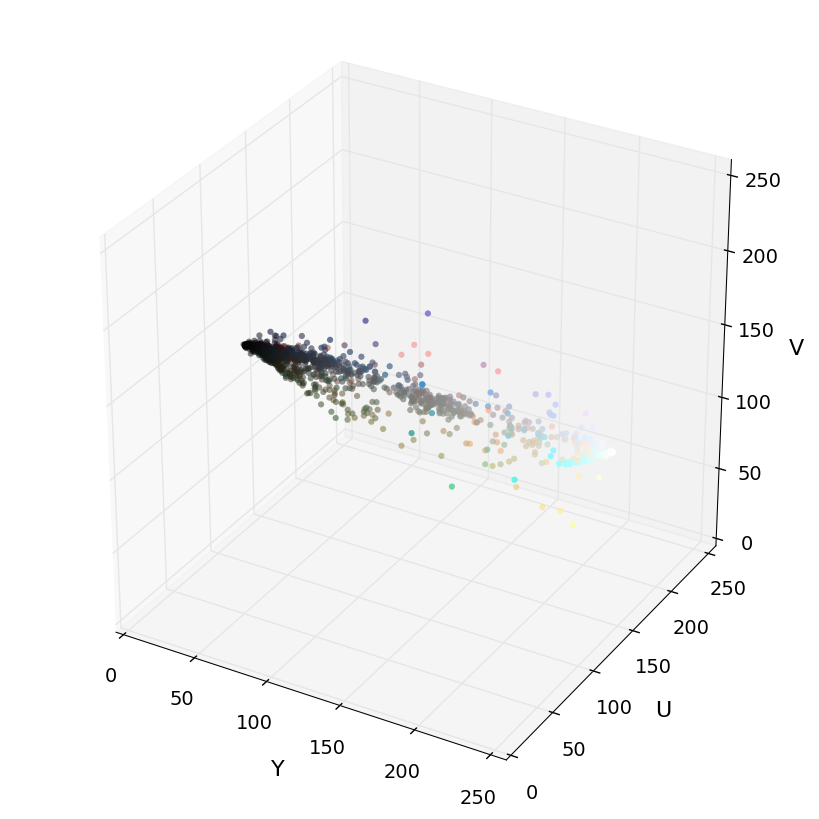

In [25]:
Plot3dOp(cv2.cvtColor(img_small, cv2.COLOR_BGR2YUV), img_small_rgb, axis_labels=list("YUV")).perform()
plt.show()

![](https://d17h27t6h515a5.cloudfront.net/topher/2016/December/585c7469_001240/001240.png)

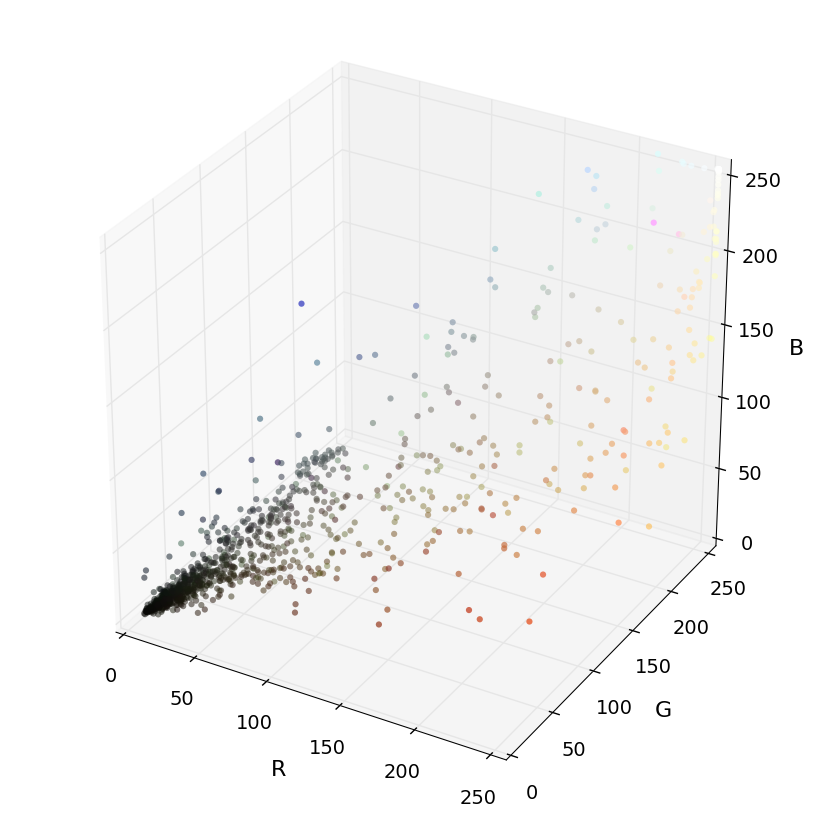

In [26]:
# Read a color image
img = cv2.imread("notes/001240.png")

# Select a small fraction of pixels to plot by subsampling it
scale = max(img.shape[0], img.shape[1], 64) / 64  # at most 64 rows and columns
img_small = cv2.resize(img, (np.int(img.shape[1] / scale), np.int(img.shape[0] / scale)), interpolation=cv2.INTER_NEAREST)

# Convert subsampled image to desired color space(s)
img_small_RGB = cv2.cvtColor(img_small, cv2.COLOR_BGR2RGB)  # OpenCV uses BGR, matplotlib likes RGB
img_small_rgb = img_small_RGB / 255.  # scaled to [0, 1], only for plotting

# Plot and show
Plot3dOp(img_small_RGB, img_small_rgb).perform()
plt.show()

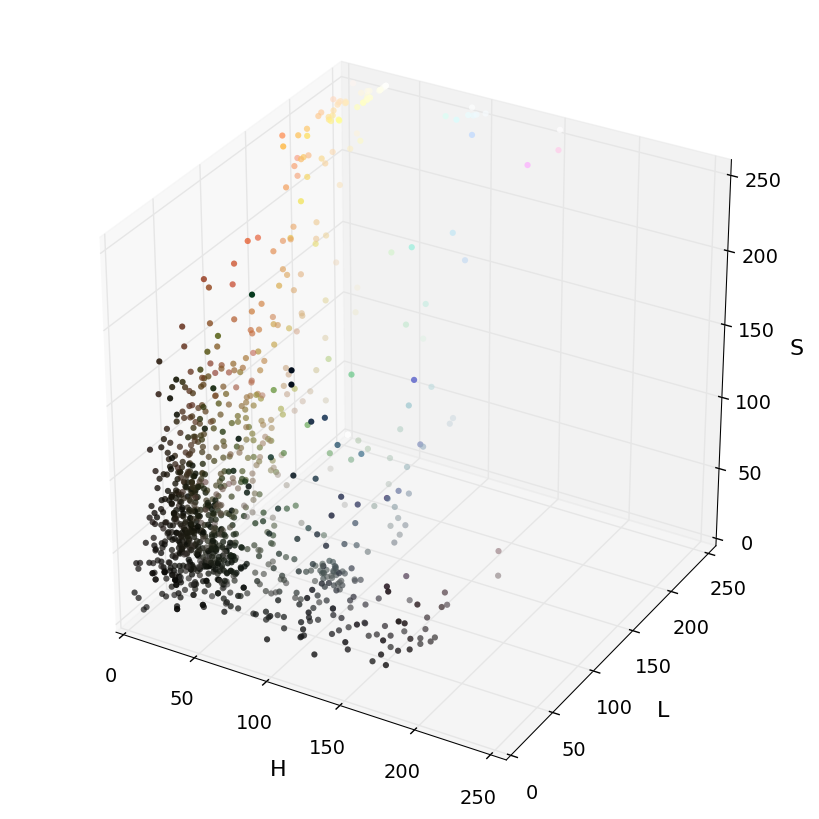

In [27]:
Plot3dOp(cv2.cvtColor(img_small, cv2.COLOR_BGR2HLS), img_small_rgb, axis_labels=list("HLS")).perform()
plt.show()

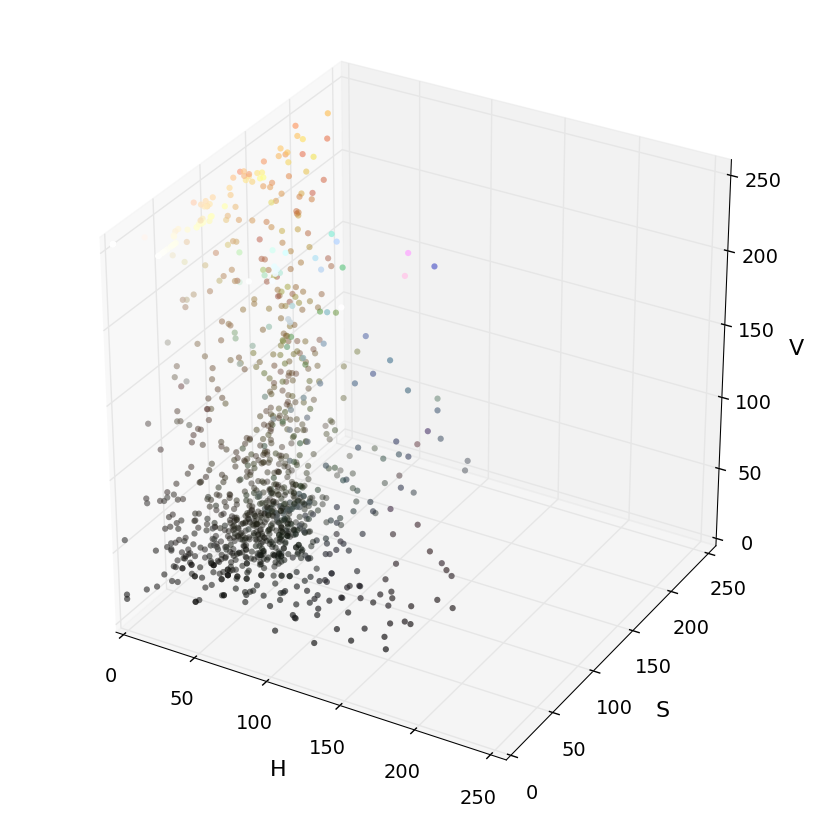

In [28]:
Plot3dOp(cv2.cvtColor(img_small, cv2.COLOR_BGR2HSV), img_small_rgb, axis_labels=list("HSV")).perform()
plt.show()

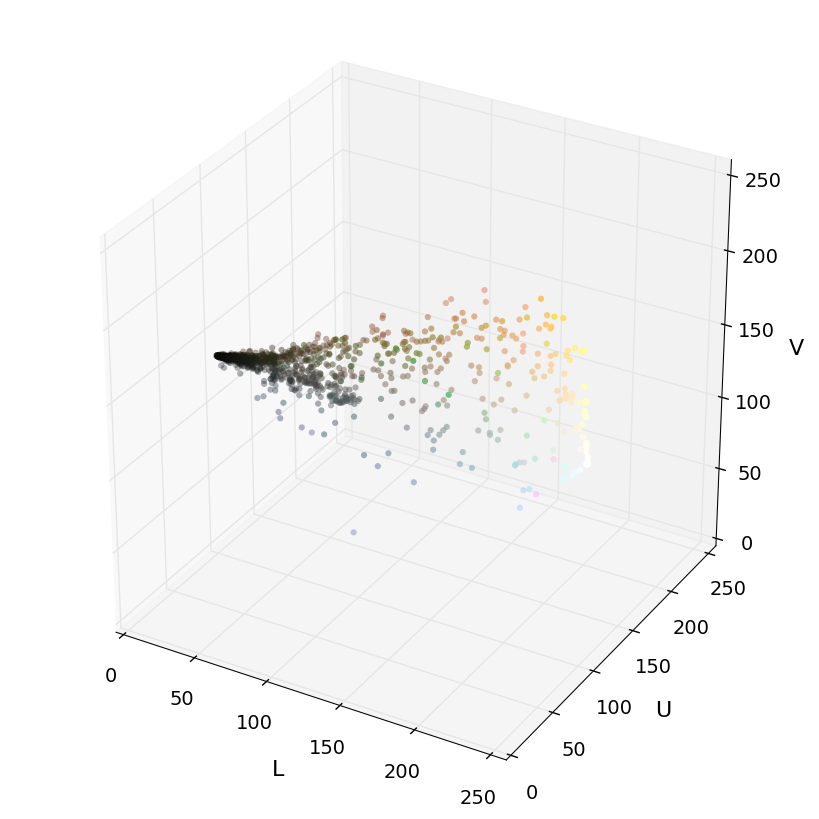

In [29]:
Plot3dOp(cv2.cvtColor(img_small, cv2.COLOR_BGR2LUV), img_small_rgb, axis_labels=list("LUV")).perform()
plt.show()

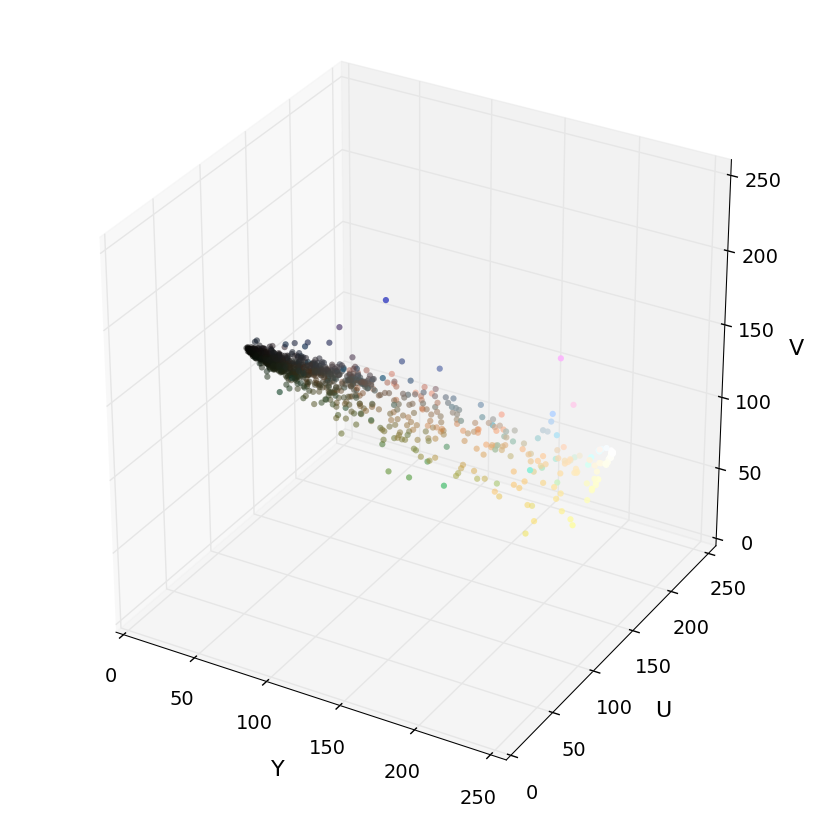

In [30]:
Plot3dOp(cv2.cvtColor(img_small, cv2.COLOR_BGR2YUV), img_small_rgb, axis_labels=list("YUV")).perform()
plt.show()

![](https://d17h27t6h515a5.cloudfront.net/topher/2016/December/585c7456_000528/000528.png)

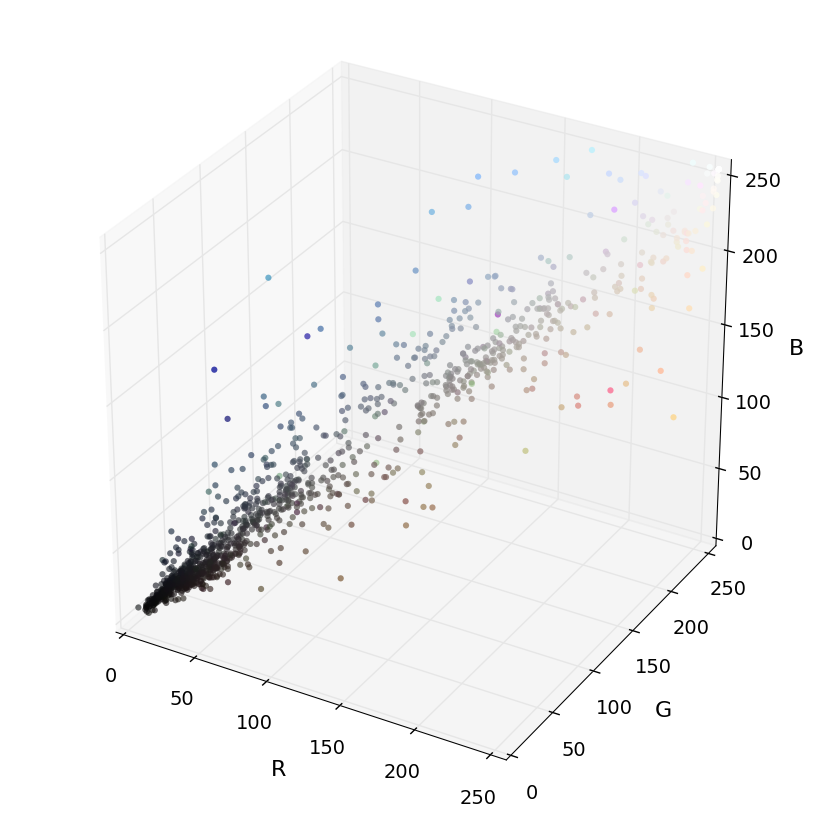

In [31]:
# Read a color image
img = cv2.imread("notes/000528.png")

# Select a small fraction of pixels to plot by subsampling it
scale = max(img.shape[0], img.shape[1], 64) / 64  # at most 64 rows and columns
img_small = cv2.resize(img, (np.int(img.shape[1] / scale), np.int(img.shape[0] / scale)), interpolation=cv2.INTER_NEAREST)

# Convert subsampled image to desired color space(s)
img_small_RGB = cv2.cvtColor(img_small, cv2.COLOR_BGR2RGB)  # OpenCV uses BGR, matplotlib likes RGB
img_small_rgb = img_small_RGB / 255.  # scaled to [0, 1], only for plotting

# Plot and show
Plot3dOp(img_small_RGB, img_small_rgb).perform()
plt.show()

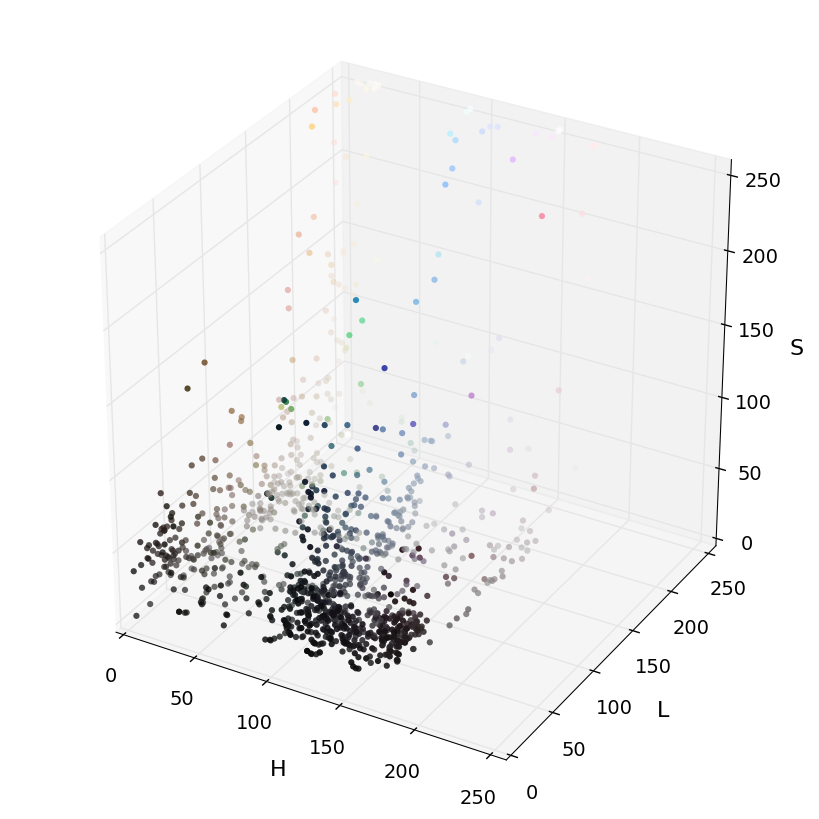

In [32]:
Plot3dOp(cv2.cvtColor(img_small, cv2.COLOR_BGR2HLS), img_small_rgb, axis_labels=list("HLS")).perform()
plt.show()

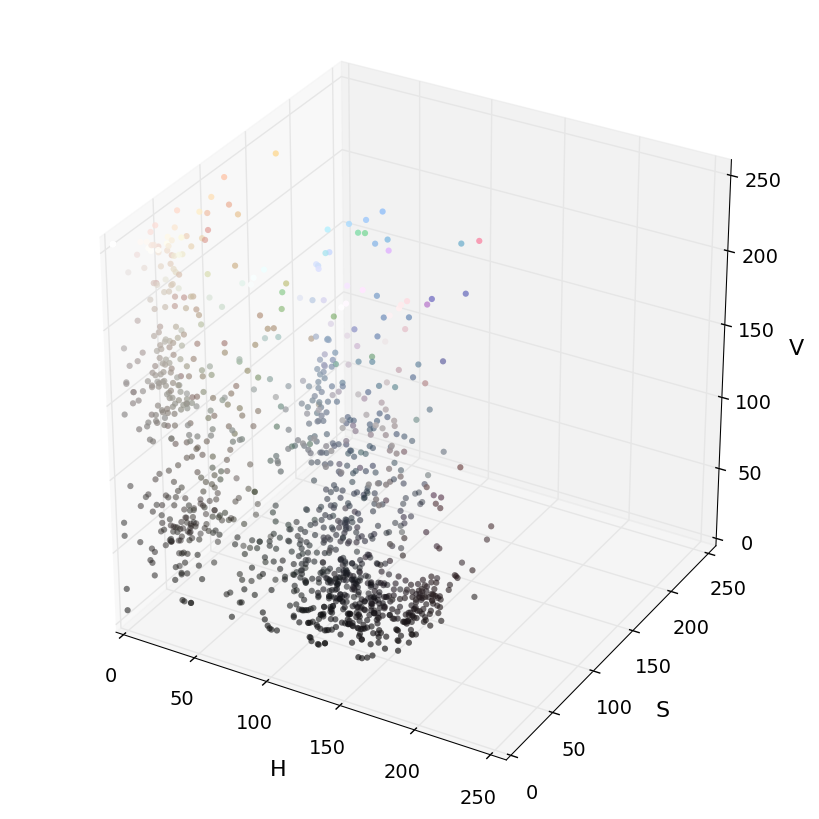

In [33]:
Plot3dOp(cv2.cvtColor(img_small, cv2.COLOR_BGR2HSV), img_small_rgb, axis_labels=list("HSV")).perform()
plt.show()

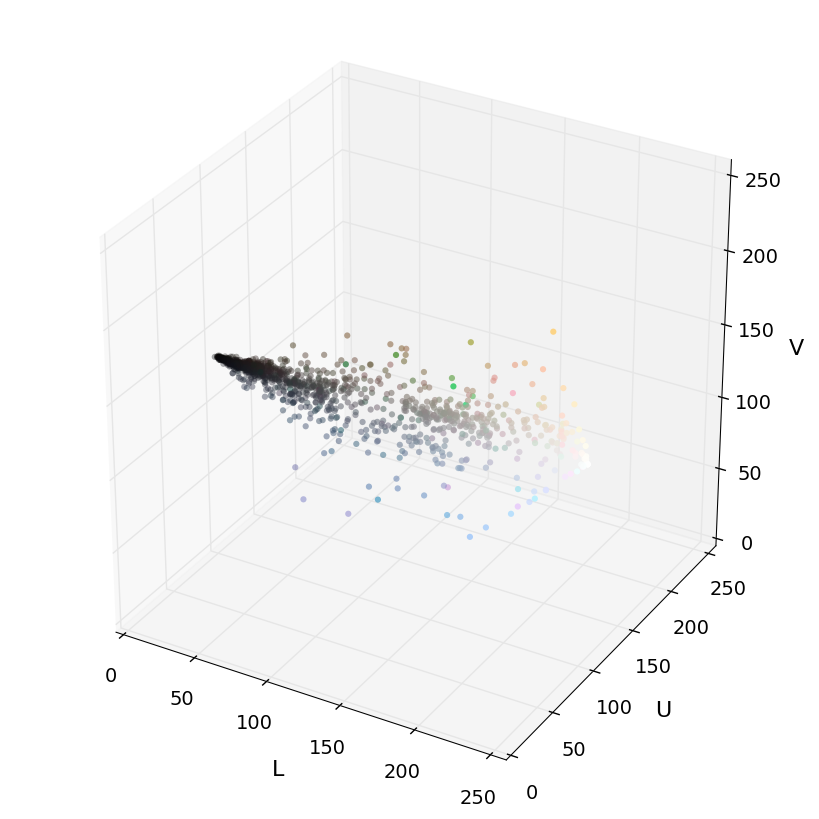

In [34]:
Plot3dOp(cv2.cvtColor(img_small, cv2.COLOR_BGR2LUV), img_small_rgb, axis_labels=list("LUV")).perform()
plt.show()

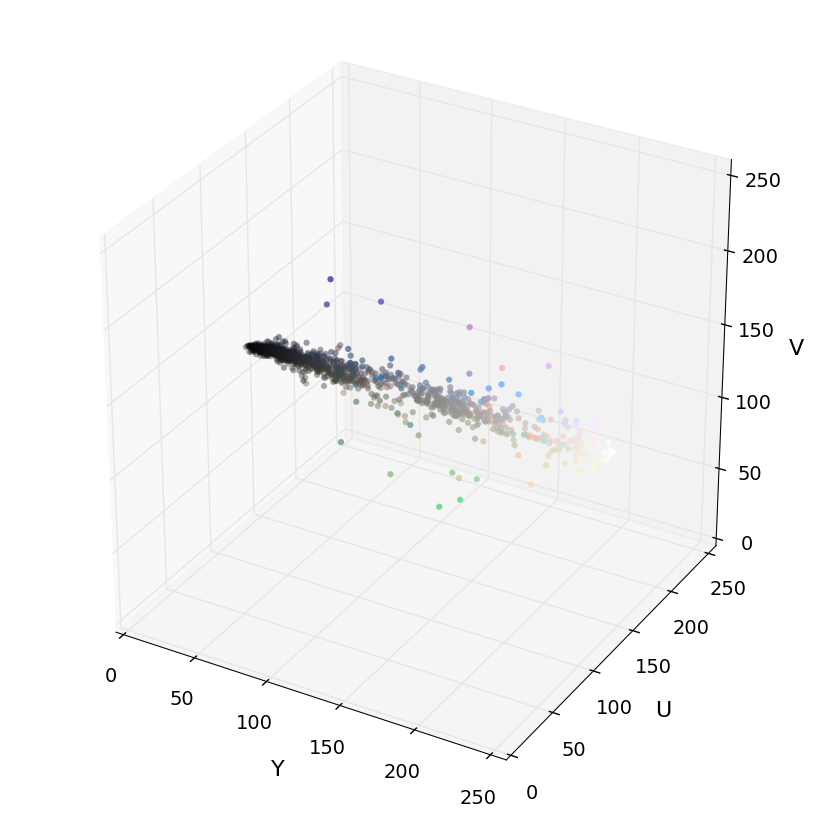

In [35]:
Plot3dOp(cv2.cvtColor(img_small, cv2.COLOR_BGR2YUV), img_small_rgb, axis_labels=list("YUV")).perform()
plt.show()

### Analyze vehicle and non-vehicle images

You might've noticed that it is hard to distinguish between the class of pixels you are interested in (vehicles, in this case) from the background. So it may be more beneficial to plot pixels from vehicle and non-vehicle images separately. See if you can identify any trends using these samples.

Try experimenting with different color spaces such as LUV or HLS to see if you can find a way to consistently separate vehicle images from non-vehicles. It doesn't have to be perfect, but it will help when combined with other kinds of features fed into a classifier.

![](https://d17h27t6h515a5.cloudfront.net/topher/2016/December/585c9929_25/25.png)

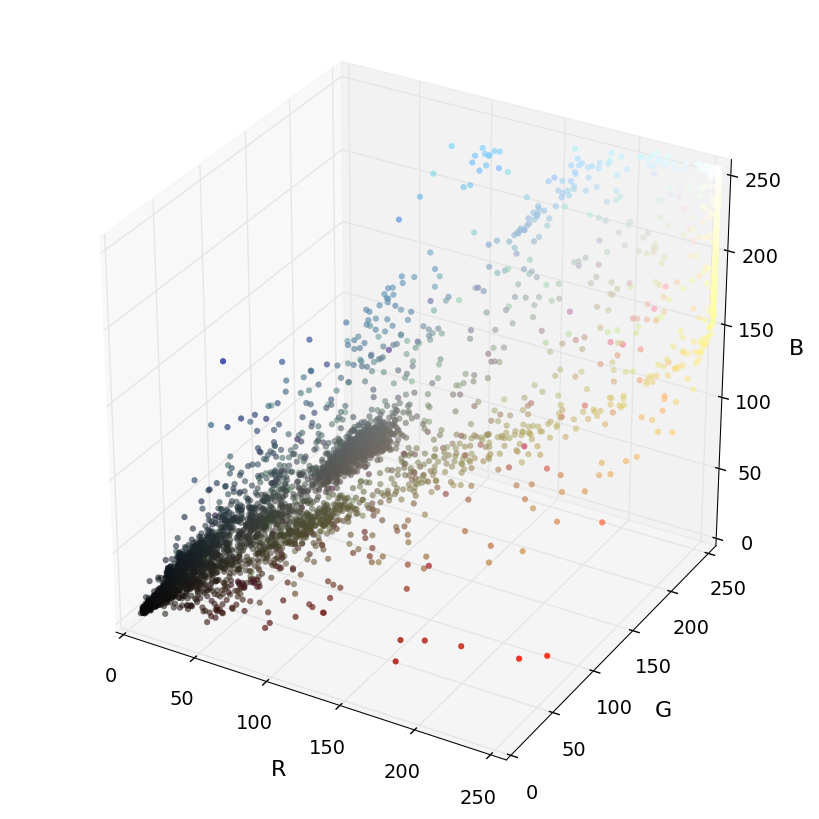

In [36]:
# Read a color image
img = cv2.imread("notes/25.png")

# Select a small fraction of pixels to plot by subsampling it
scale = max(img.shape[0], img.shape[1], 64) / 64  # at most 64 rows and columns
img_small = cv2.resize(img, (np.int(img.shape[1] / scale), np.int(img.shape[0] / scale)), interpolation=cv2.INTER_NEAREST)

# Convert subsampled image to desired color space(s)
img_small_RGB = cv2.cvtColor(img_small, cv2.COLOR_BGR2RGB)  # OpenCV uses BGR, matplotlib likes RGB
img_small_rgb = img_small_RGB / 255.  # scaled to [0, 1], only for plotting

# Plot and show
Plot3dOp(img_small_RGB, img_small_rgb).perform()
plt.show()

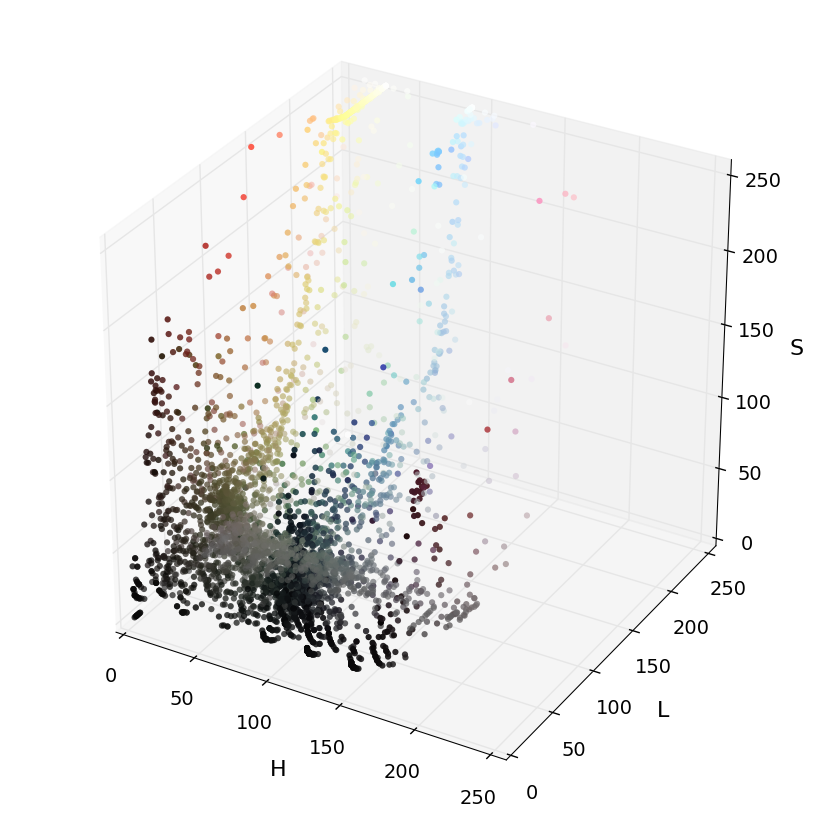

In [37]:
Plot3dOp(cv2.cvtColor(img_small, cv2.COLOR_BGR2HLS), img_small_rgb, axis_labels=list("HLS")).perform()
plt.show()

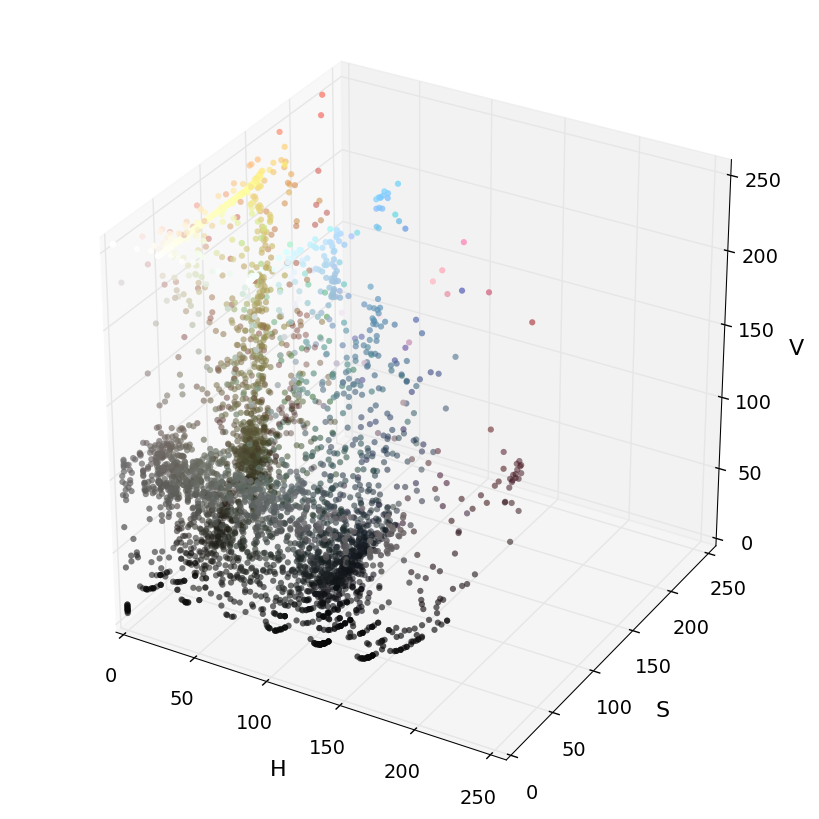

In [38]:
Plot3dOp(cv2.cvtColor(img_small, cv2.COLOR_BGR2HSV), img_small_rgb, axis_labels=list("HSV")).perform()
plt.show()

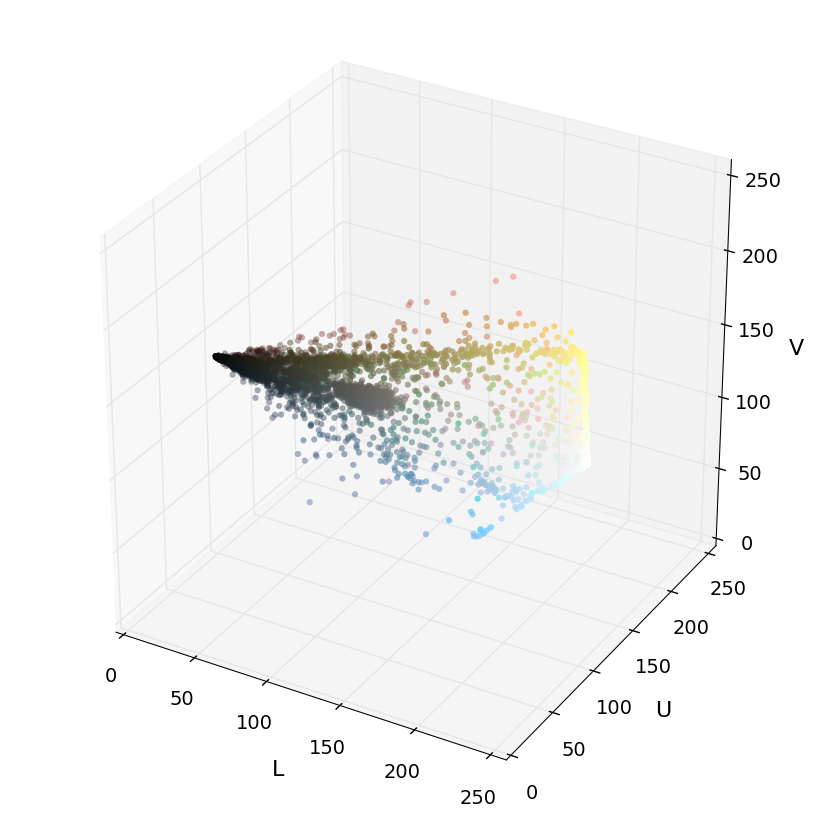

In [39]:
Plot3dOp(cv2.cvtColor(img_small, cv2.COLOR_BGR2LUV), img_small_rgb, axis_labels=list("LUV")).perform()
plt.show()

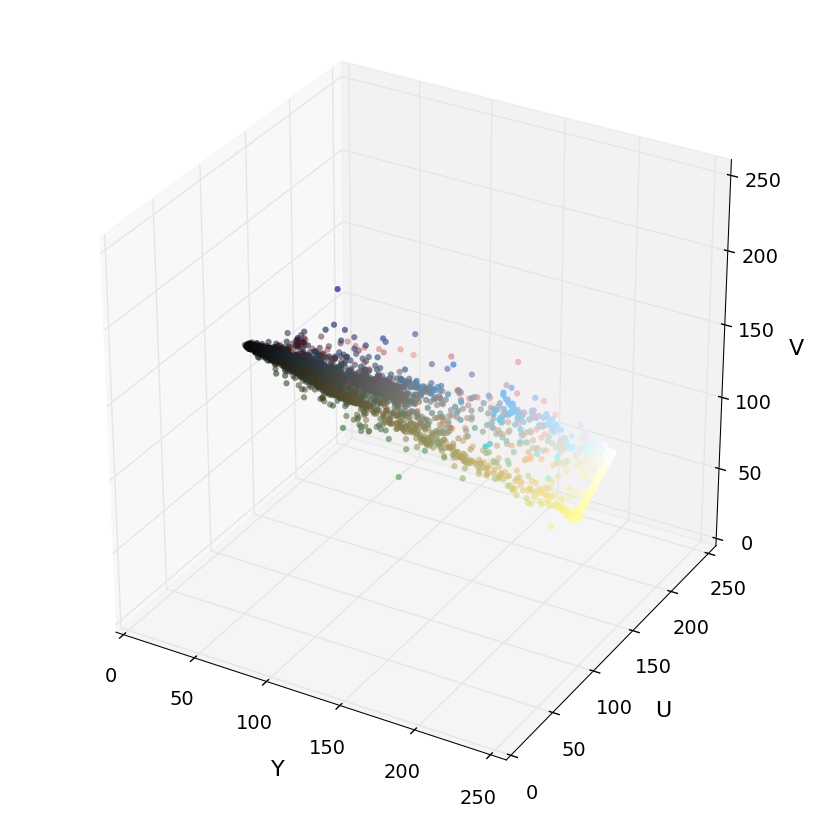

In [40]:
Plot3dOp(cv2.cvtColor(img_small, cv2.COLOR_BGR2YUV), img_small_rgb, axis_labels=list("YUV")).perform()
plt.show()

![](https://d17h27t6h515a5.cloudfront.net/topher/2016/December/585c992e_31/31.png)

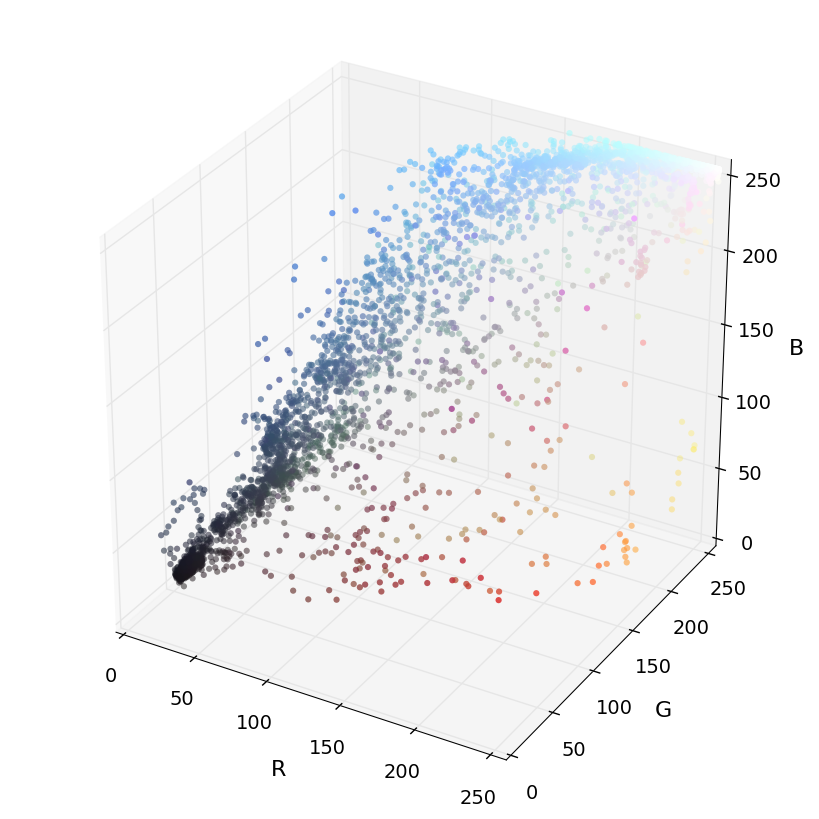

In [41]:
# Read a color image
img = cv2.imread("notes/31.png")

# Select a small fraction of pixels to plot by subsampling it
scale = max(img.shape[0], img.shape[1], 64) / 64  # at most 64 rows and columns
img_small = cv2.resize(img, (np.int(img.shape[1] / scale), np.int(img.shape[0] / scale)), interpolation=cv2.INTER_NEAREST)

# Convert subsampled image to desired color space(s)
img_small_RGB = cv2.cvtColor(img_small, cv2.COLOR_BGR2RGB)  # OpenCV uses BGR, matplotlib likes RGB
img_small_rgb = img_small_RGB / 255.  # scaled to [0, 1], only for plotting

# Plot and show
Plot3dOp(img_small_RGB, img_small_rgb).perform()
plt.show()

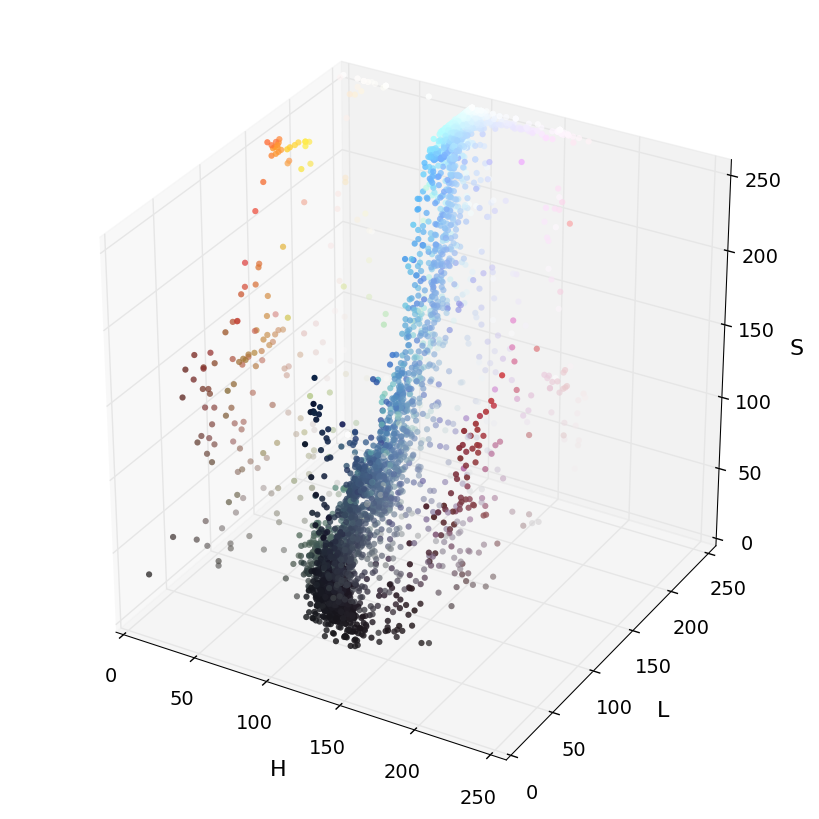

In [42]:
Plot3dOp(cv2.cvtColor(img_small, cv2.COLOR_BGR2HLS), img_small_rgb, axis_labels=list("HLS")).perform()
plt.show()

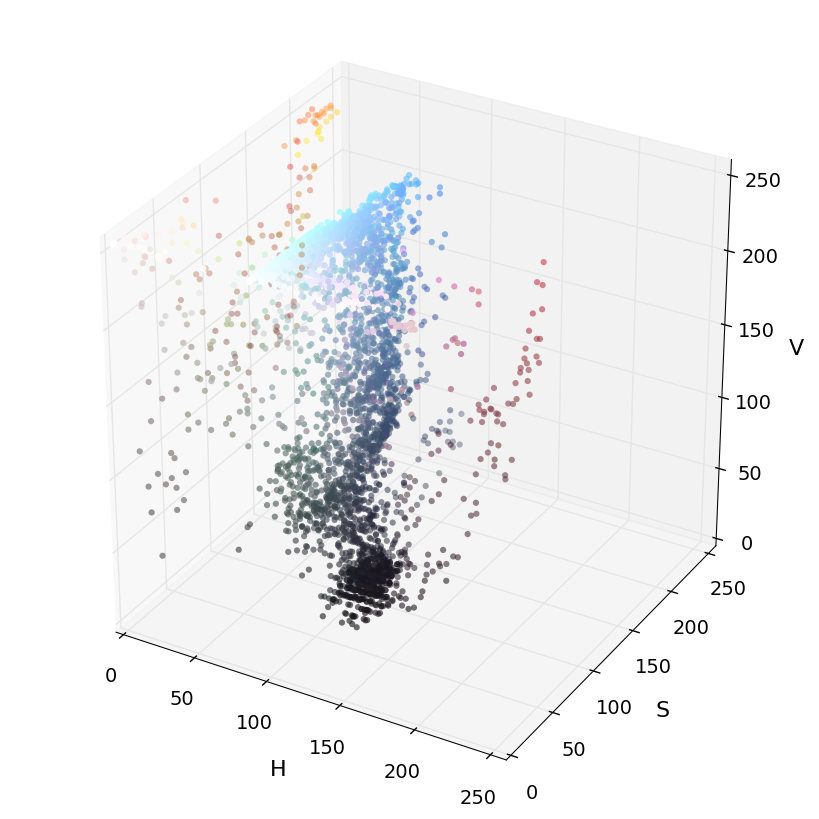

In [43]:
Plot3dOp(cv2.cvtColor(img_small, cv2.COLOR_BGR2HSV), img_small_rgb, axis_labels=list("HSV")).perform()
plt.show()

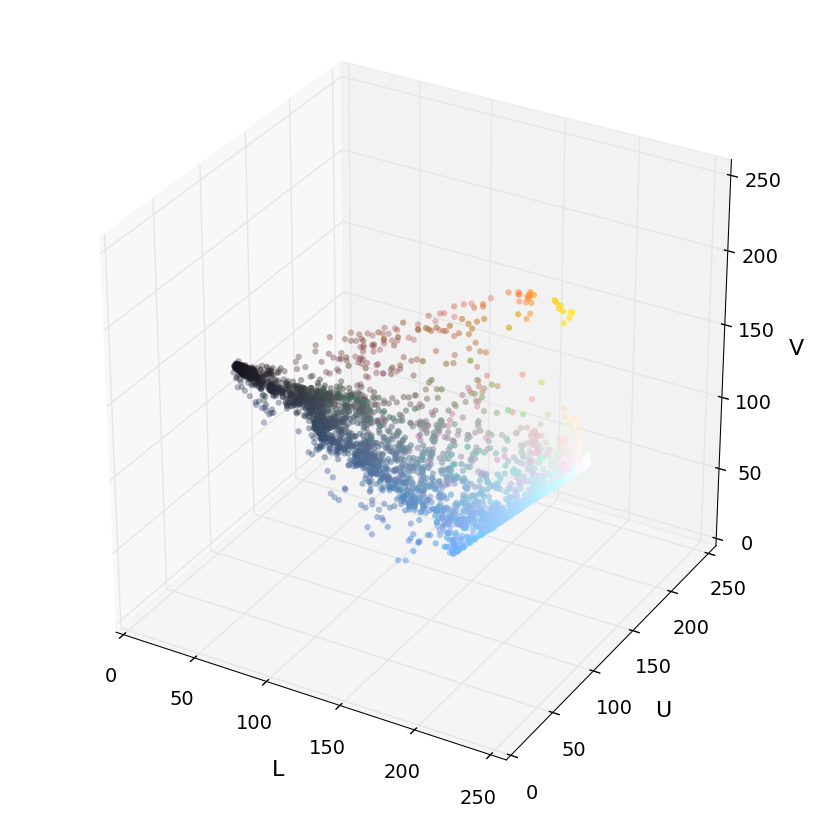

In [44]:
Plot3dOp(cv2.cvtColor(img_small, cv2.COLOR_BGR2LUV), img_small_rgb, axis_labels=list("LUV")).perform()
plt.show()

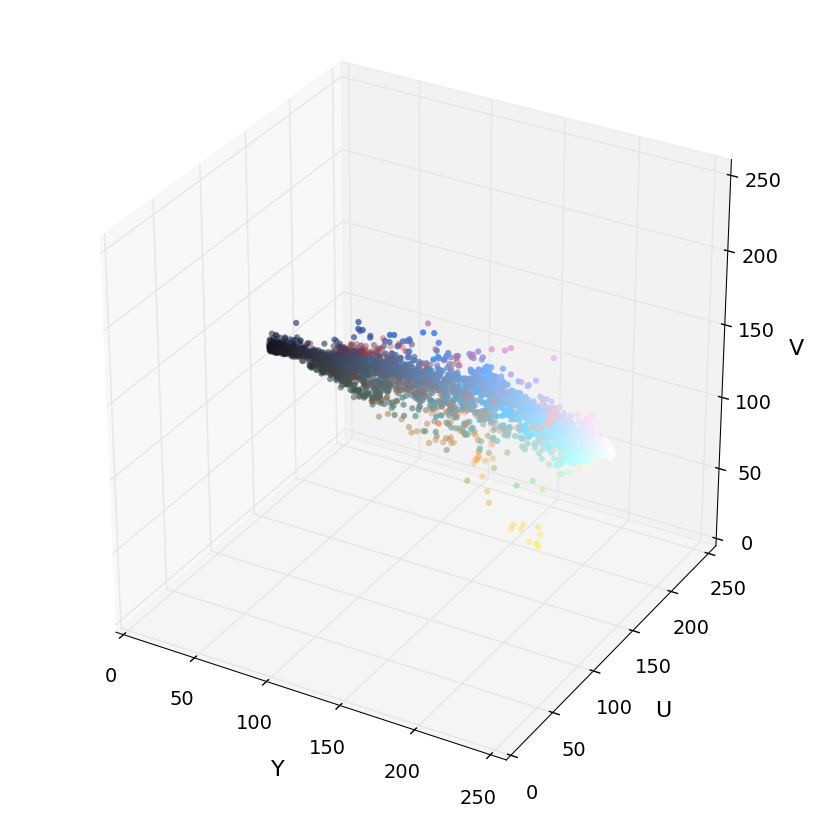

In [45]:
Plot3dOp(cv2.cvtColor(img_small, cv2.COLOR_BGR2YUV), img_small_rgb, axis_labels=list("YUV")).perform()
plt.show()

![](https://d17h27t6h515a5.cloudfront.net/topher/2016/December/585c992e_53/53.png)

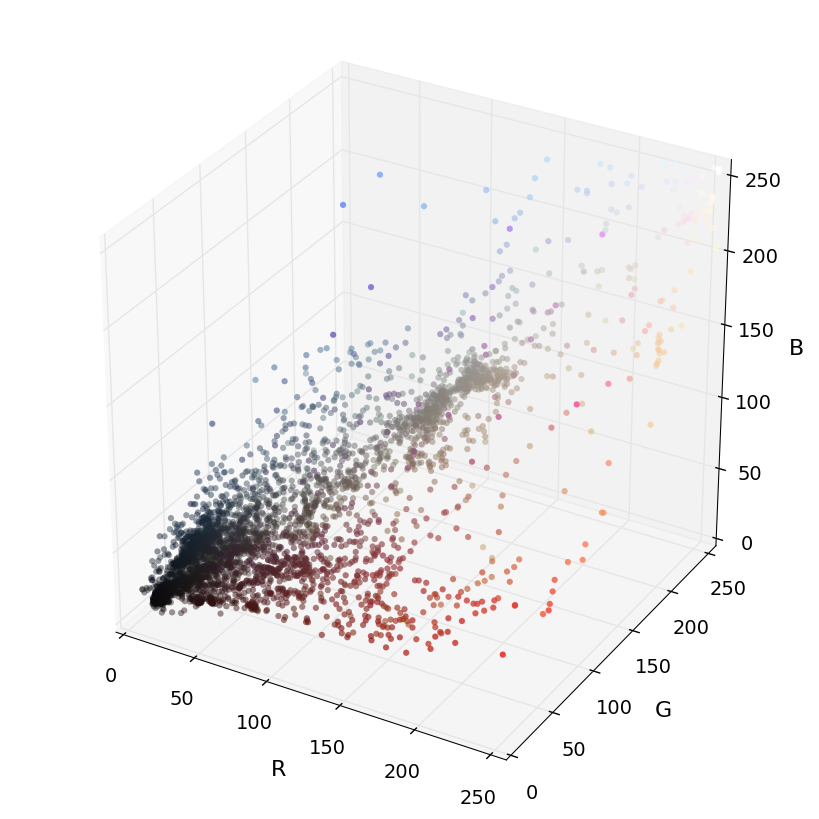

In [46]:
# Read a color image
img = cv2.imread("notes/53.png")

# Select a small fraction of pixels to plot by subsampling it
scale = max(img.shape[0], img.shape[1], 64) / 64  # at most 64 rows and columns
img_small = cv2.resize(img, (np.int(img.shape[1] / scale), np.int(img.shape[0] / scale)), interpolation=cv2.INTER_NEAREST)

# Convert subsampled image to desired color space(s)
img_small_RGB = cv2.cvtColor(img_small, cv2.COLOR_BGR2RGB)  # OpenCV uses BGR, matplotlib likes RGB
img_small_rgb = img_small_RGB / 255.  # scaled to [0, 1], only for plotting

# Plot and show
Plot3dOp(img_small_RGB, img_small_rgb).perform()
plt.show()

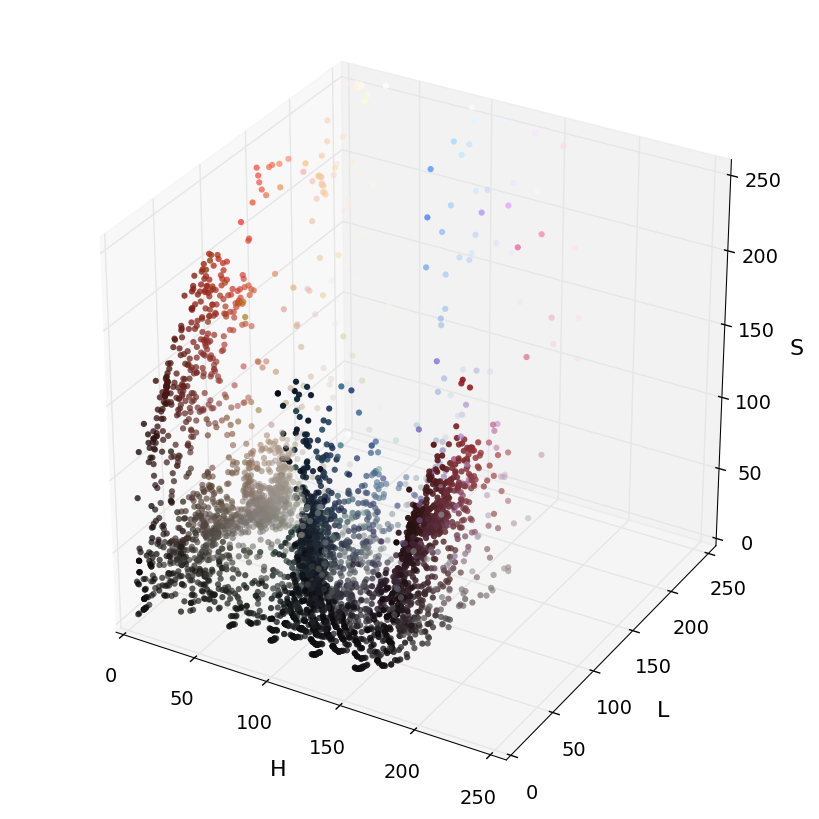

In [47]:
Plot3dOp(cv2.cvtColor(img_small, cv2.COLOR_BGR2HLS), img_small_rgb, axis_labels=list("HLS")).perform()
plt.show()

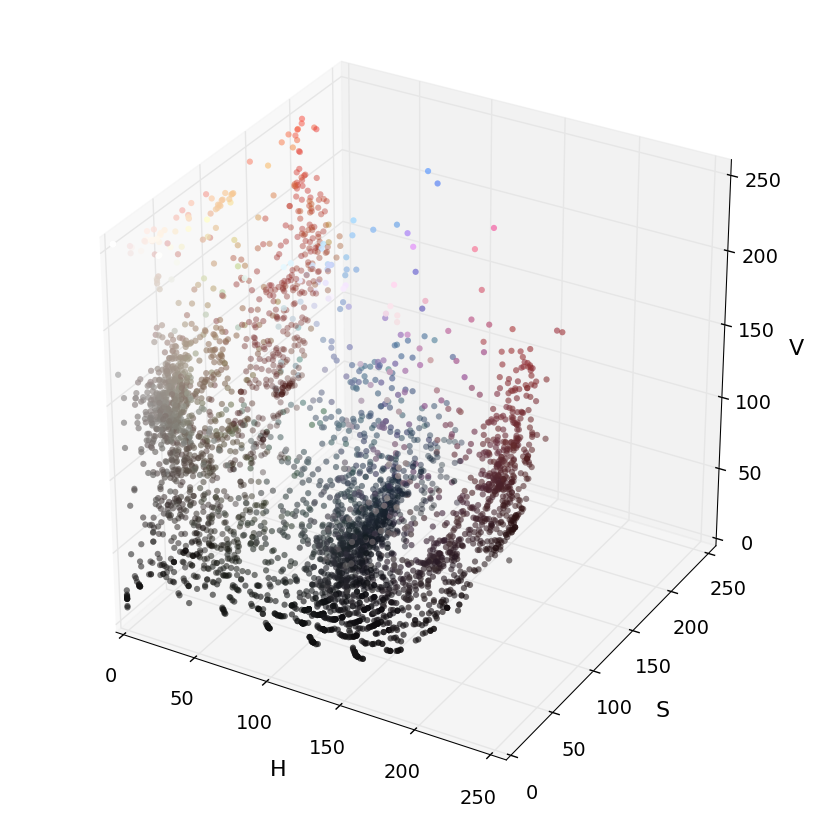

In [48]:
Plot3dOp(cv2.cvtColor(img_small, cv2.COLOR_BGR2HSV), img_small_rgb, axis_labels=list("HSV")).perform()
plt.show()

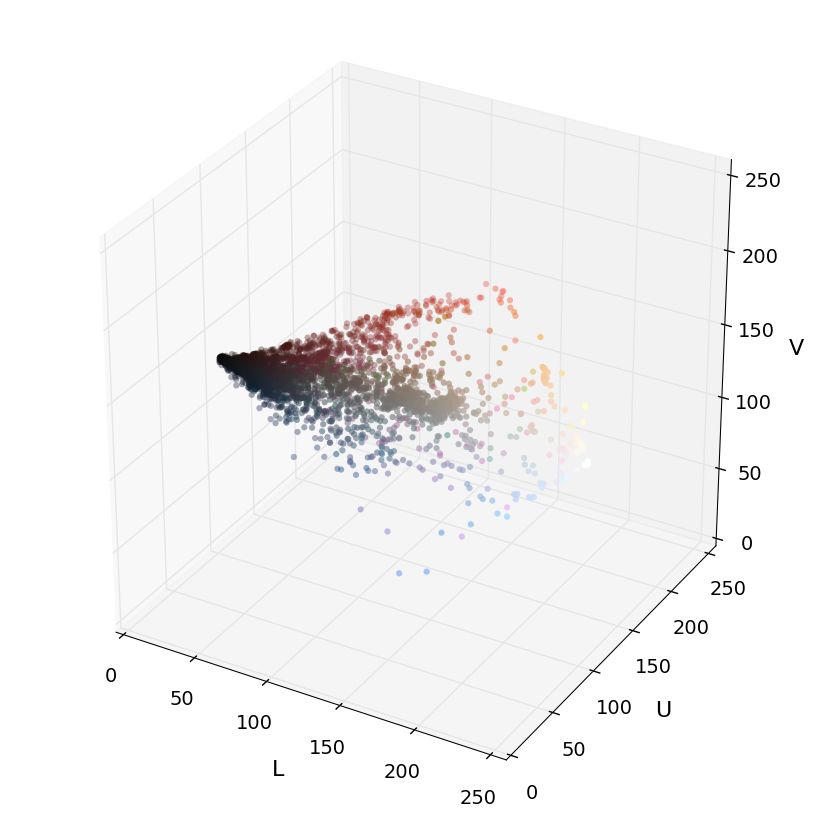

In [49]:
Plot3dOp(cv2.cvtColor(img_small, cv2.COLOR_BGR2LUV), img_small_rgb, axis_labels=list("LUV")).perform()
plt.show()

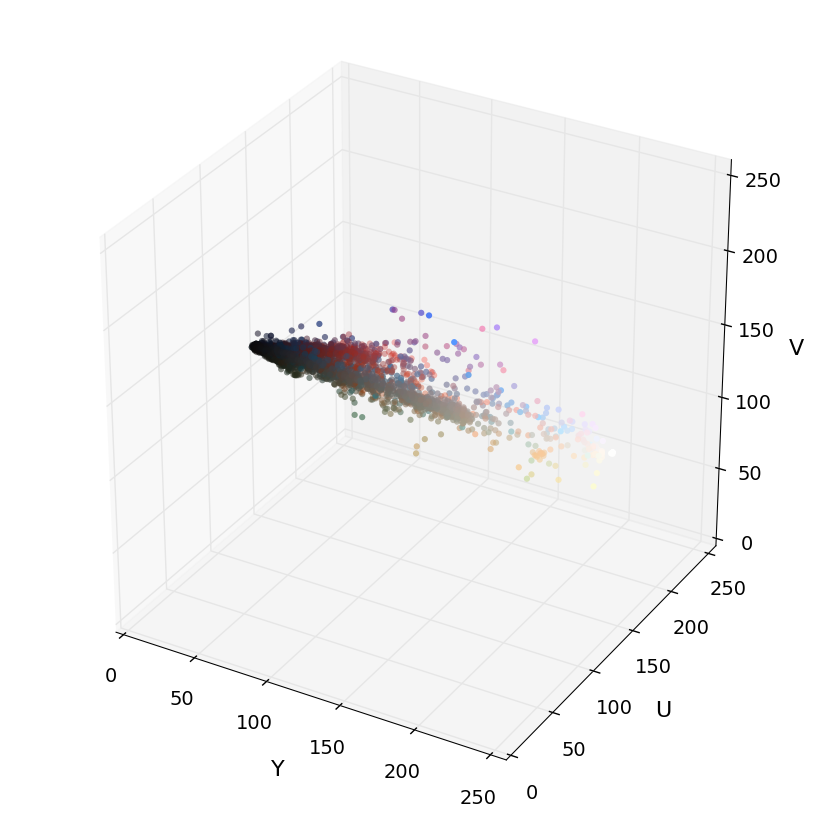

In [50]:
Plot3dOp(cv2.cvtColor(img_small, cv2.COLOR_BGR2YUV), img_small_rgb, axis_labels=list("YUV")).perform()
plt.show()

![](https://d17h27t6h515a5.cloudfront.net/topher/2016/December/585c99a5_8/8.png)

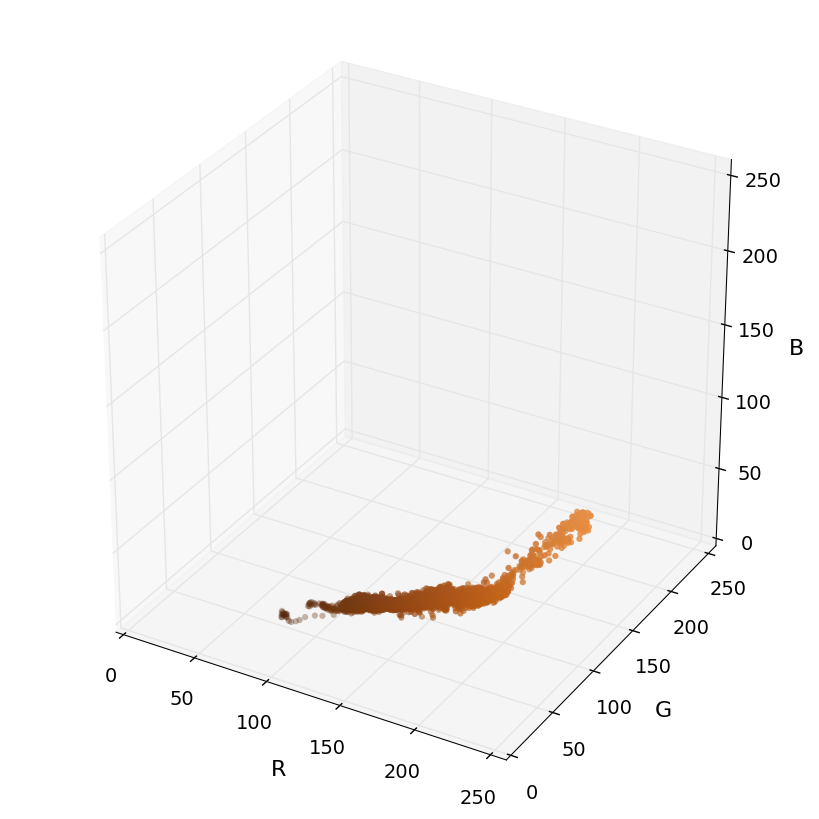

In [51]:
# Read a color image
img = cv2.imread("notes/8.png")

# Select a small fraction of pixels to plot by subsampling it
scale = max(img.shape[0], img.shape[1], 64) / 64  # at most 64 rows and columns
img_small = cv2.resize(img, (np.int(img.shape[1] / scale), np.int(img.shape[0] / scale)), interpolation=cv2.INTER_NEAREST)

# Convert subsampled image to desired color space(s)
img_small_RGB = cv2.cvtColor(img_small, cv2.COLOR_BGR2RGB)  # OpenCV uses BGR, matplotlib likes RGB
img_small_rgb = img_small_RGB / 255.  # scaled to [0, 1], only for plotting

# Plot and show
Plot3dOp(img_small_RGB, img_small_rgb).perform()
plt.show()

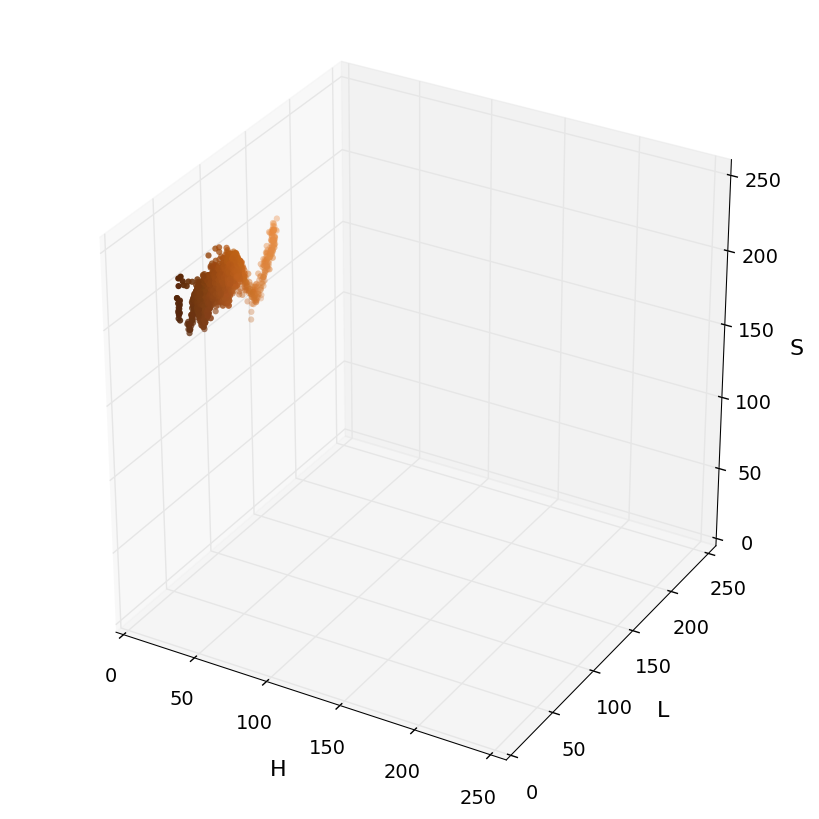

In [52]:
Plot3dOp(cv2.cvtColor(img_small, cv2.COLOR_BGR2HLS), img_small_rgb, axis_labels=list("HLS")).perform()
plt.show()

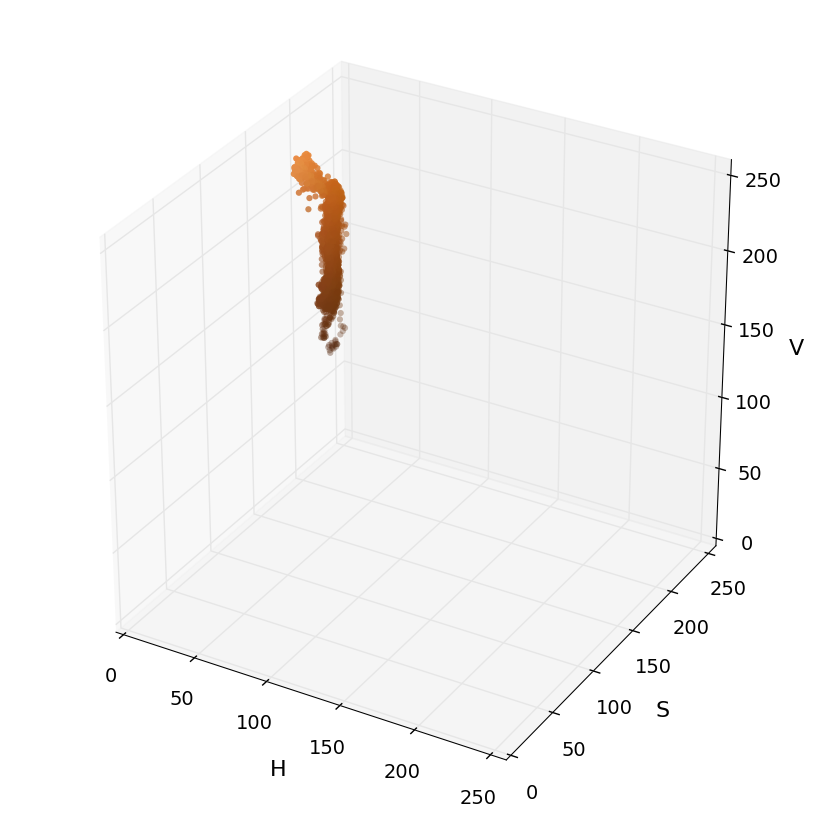

In [53]:
Plot3dOp(cv2.cvtColor(img_small, cv2.COLOR_BGR2HSV), img_small_rgb, axis_labels=list("HSV")).perform()
plt.show()

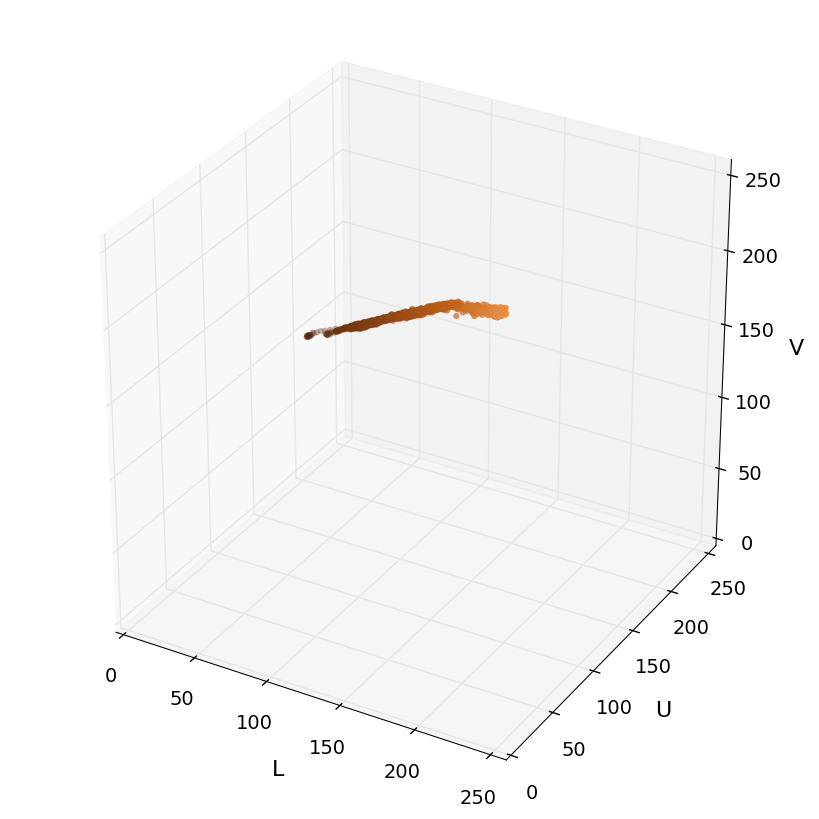

In [54]:
Plot3dOp(cv2.cvtColor(img_small, cv2.COLOR_BGR2LUV), img_small_rgb, axis_labels=list("LUV")).perform()
plt.show()

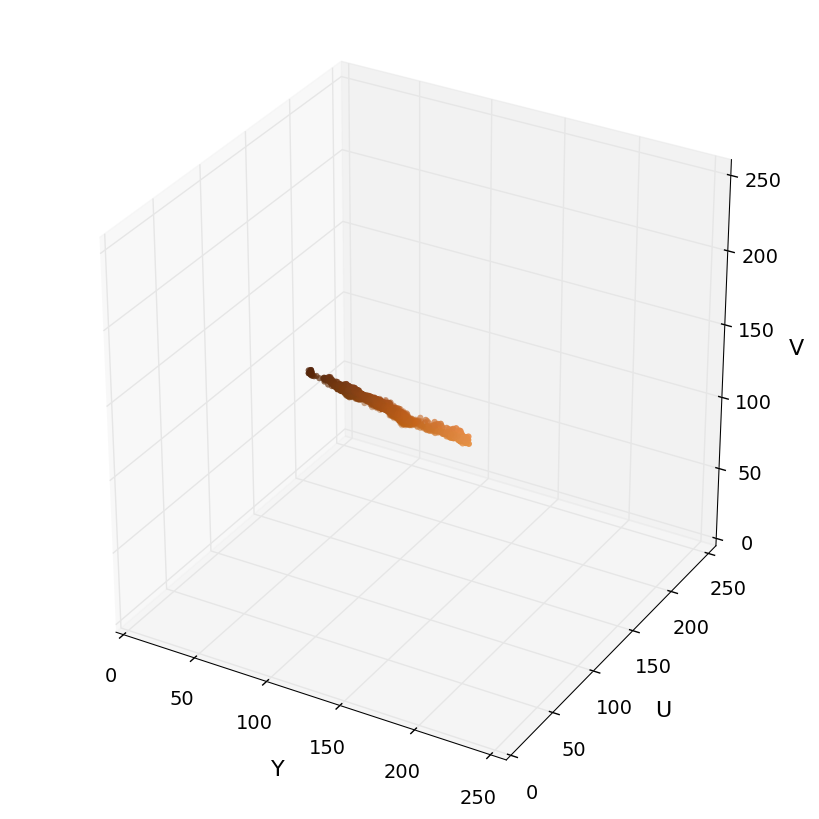

In [55]:
Plot3dOp(cv2.cvtColor(img_small, cv2.COLOR_BGR2YUV), img_small_rgb, axis_labels=list("YUV")).perform()
plt.show()

![](https://d17h27t6h515a5.cloudfront.net/topher/2016/December/585c9998_2/2.png)

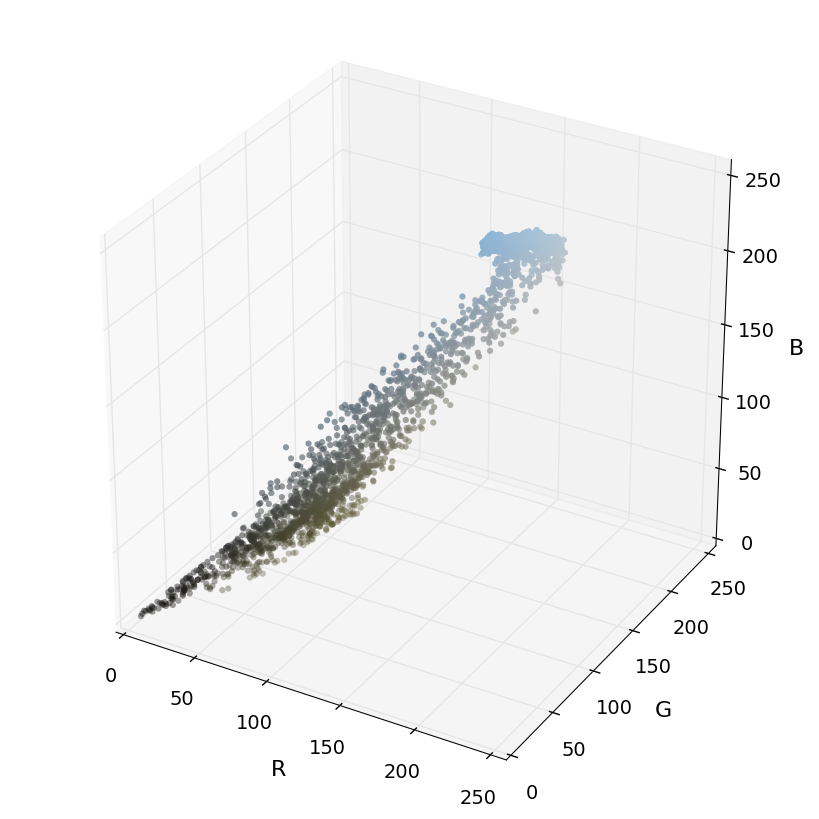

In [56]:
# Read a color image
img = cv2.imread("notes/2.png")

# Select a small fraction of pixels to plot by subsampling it
scale = max(img.shape[0], img.shape[1], 64) / 64  # at most 64 rows and columns
img_small = cv2.resize(img, (np.int(img.shape[1] / scale), np.int(img.shape[0] / scale)), interpolation=cv2.INTER_NEAREST)

# Convert subsampled image to desired color space(s)
img_small_RGB = cv2.cvtColor(img_small, cv2.COLOR_BGR2RGB)  # OpenCV uses BGR, matplotlib likes RGB
img_small_rgb = img_small_RGB / 255.  # scaled to [0, 1], only for plotting

# Plot and show
Plot3dOp(img_small_RGB, img_small_rgb).perform()
plt.show()

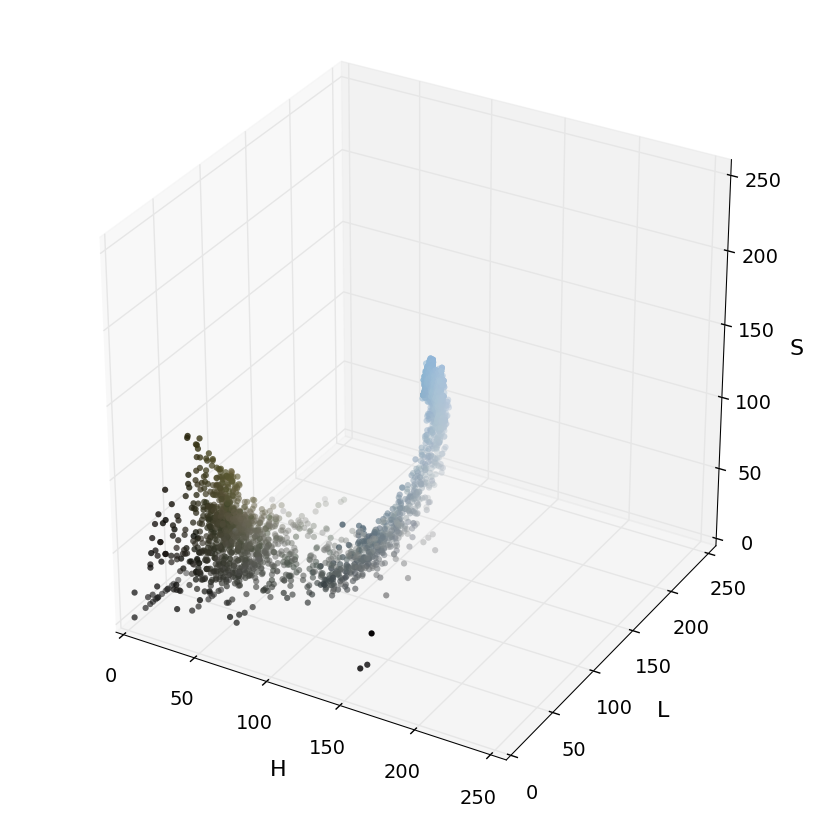

In [57]:
Plot3dOp(cv2.cvtColor(img_small, cv2.COLOR_BGR2HLS), img_small_rgb, axis_labels=list("HLS")).perform()
plt.show()

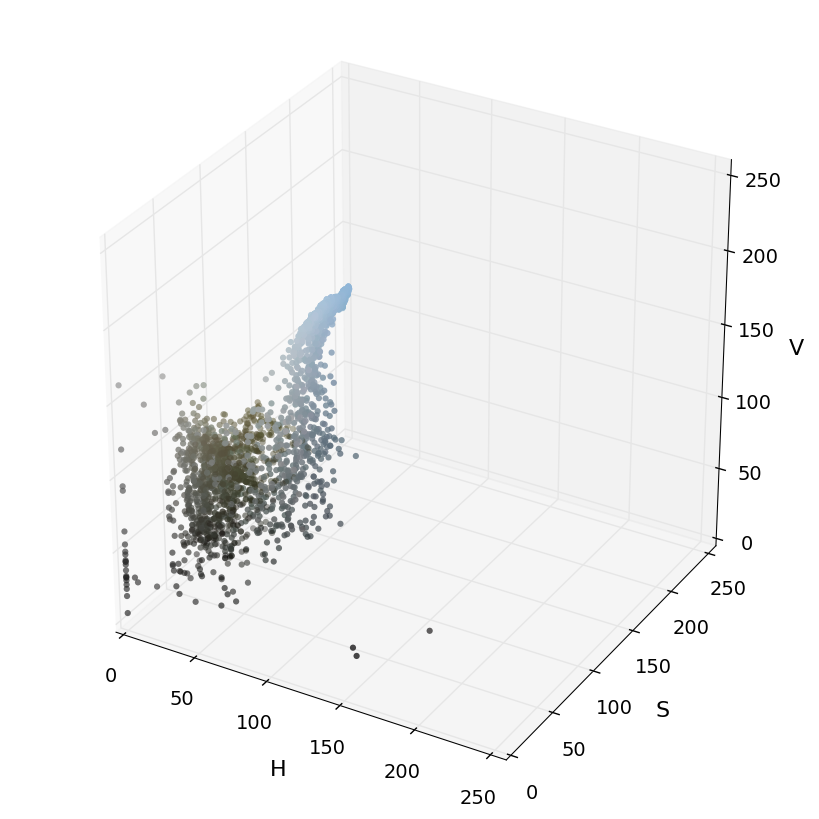

In [58]:
Plot3dOp(cv2.cvtColor(img_small, cv2.COLOR_BGR2HSV), img_small_rgb, axis_labels=list("HSV")).perform()
plt.show()

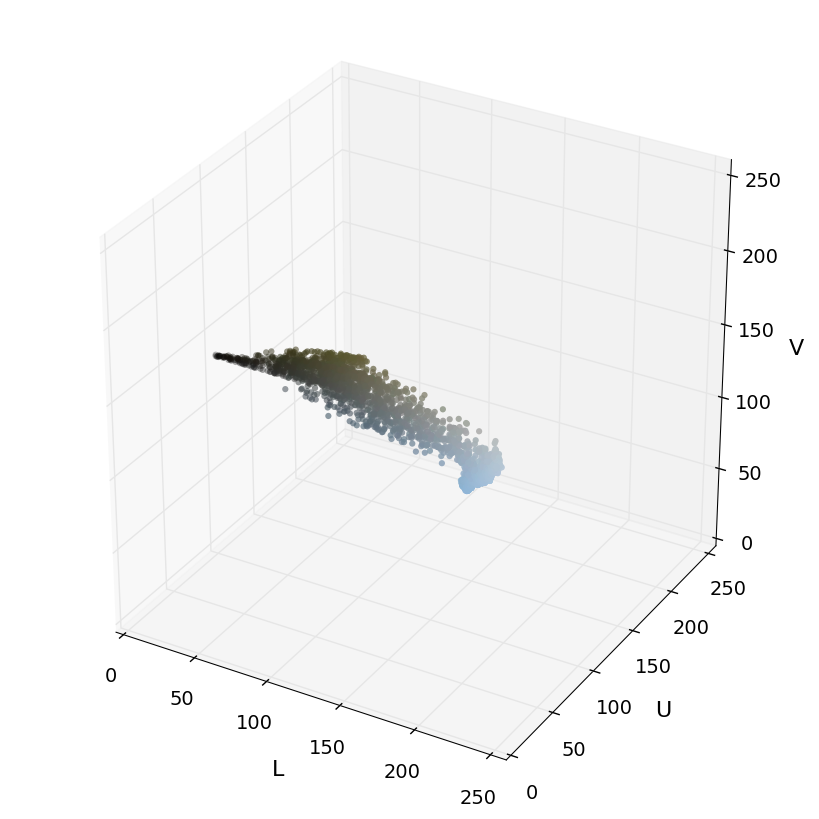

In [59]:
Plot3dOp(cv2.cvtColor(img_small, cv2.COLOR_BGR2LUV), img_small_rgb, axis_labels=list("LUV")).perform()
plt.show()

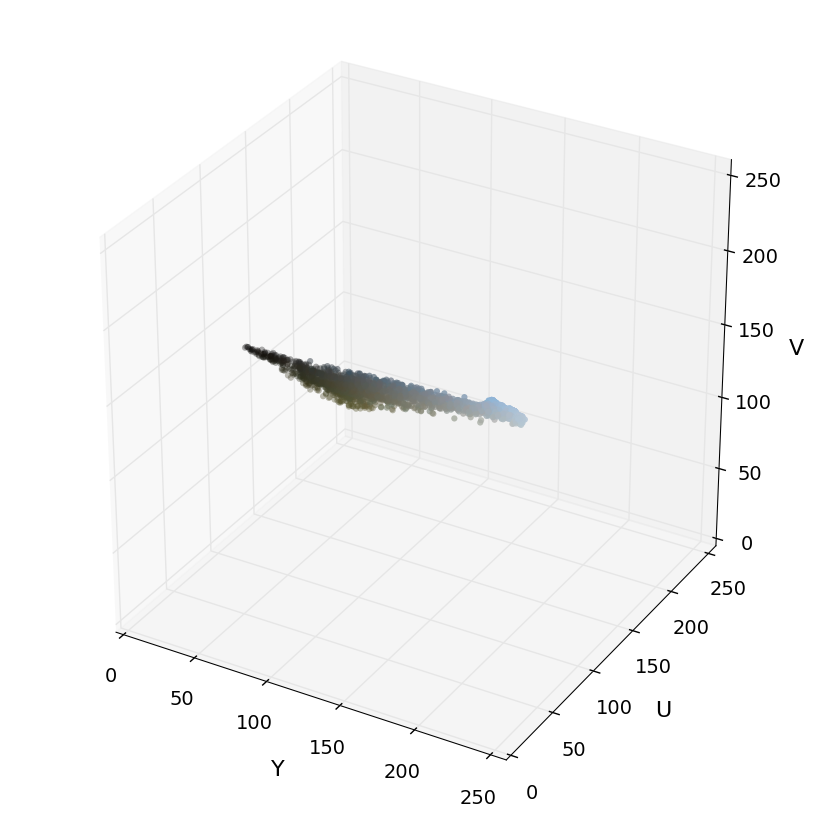

In [60]:
Plot3dOp(cv2.cvtColor(img_small, cv2.COLOR_BGR2YUV), img_small_rgb, axis_labels=list("YUV")).perform()
plt.show()

![](https://d17h27t6h515a5.cloudfront.net/topher/2016/December/585c9999_3/3.png)

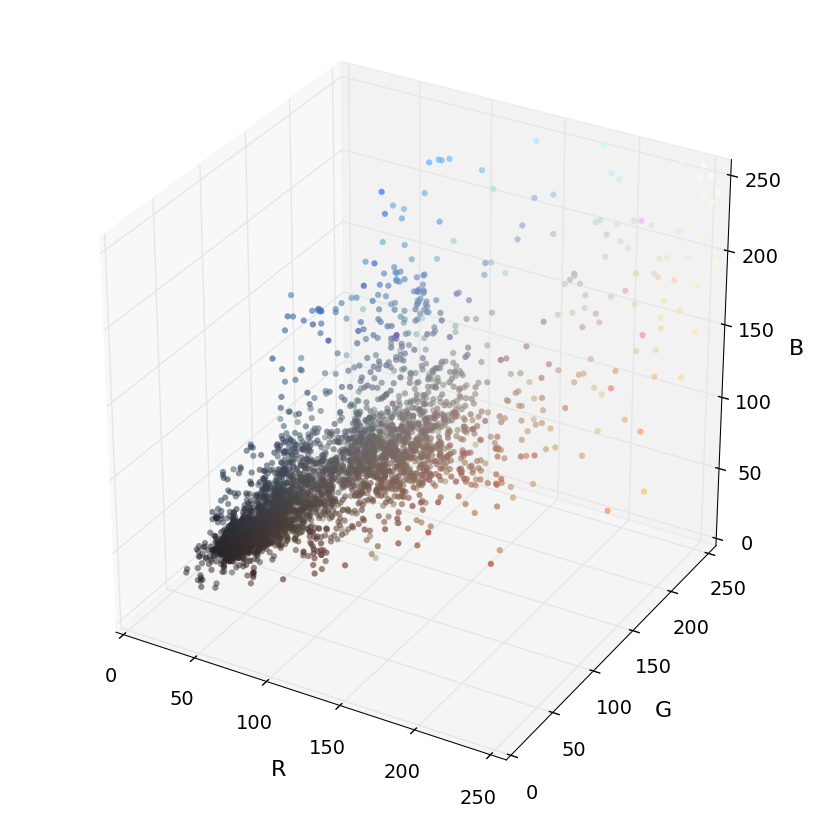

In [61]:
# Read a color image
img = cv2.imread("notes/3.png")

# Select a small fraction of pixels to plot by subsampling it
scale = max(img.shape[0], img.shape[1], 64) / 64  # at most 64 rows and columns
img_small = cv2.resize(img, (np.int(img.shape[1] / scale), np.int(img.shape[0] / scale)), interpolation=cv2.INTER_NEAREST)

# Convert subsampled image to desired color space(s)
img_small_RGB = cv2.cvtColor(img_small, cv2.COLOR_BGR2RGB)  # OpenCV uses BGR, matplotlib likes RGB
img_small_rgb = img_small_RGB / 255.  # scaled to [0, 1], only for plotting

# Plot and show
Plot3dOp(img_small_RGB, img_small_rgb).perform()
plt.show()

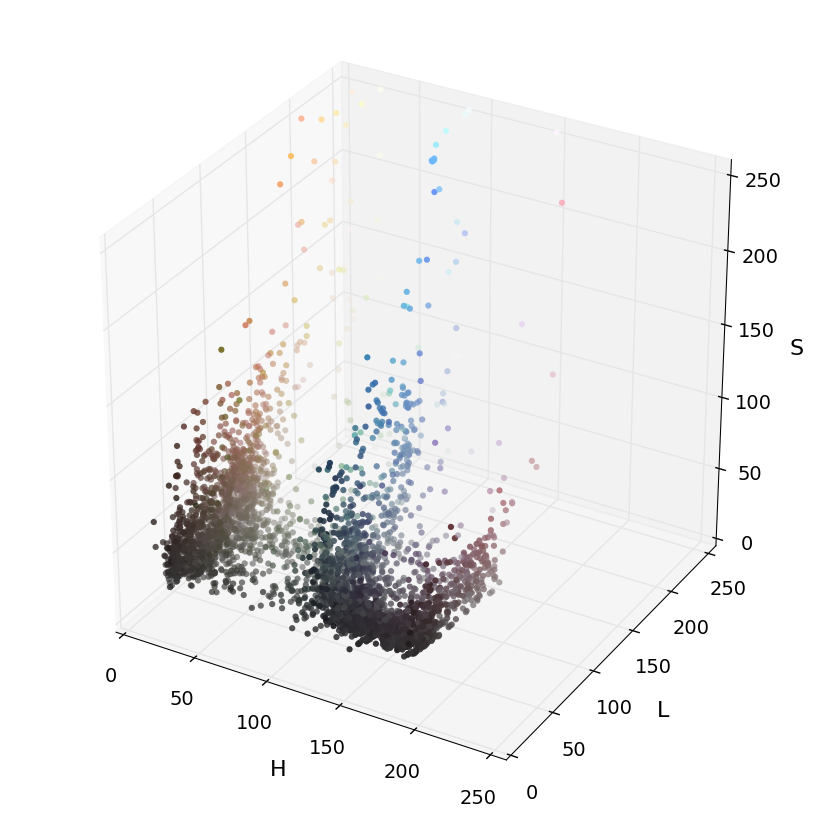

In [62]:
Plot3dOp(cv2.cvtColor(img_small, cv2.COLOR_BGR2HLS), img_small_rgb, axis_labels=list("HLS")).perform()
plt.show()

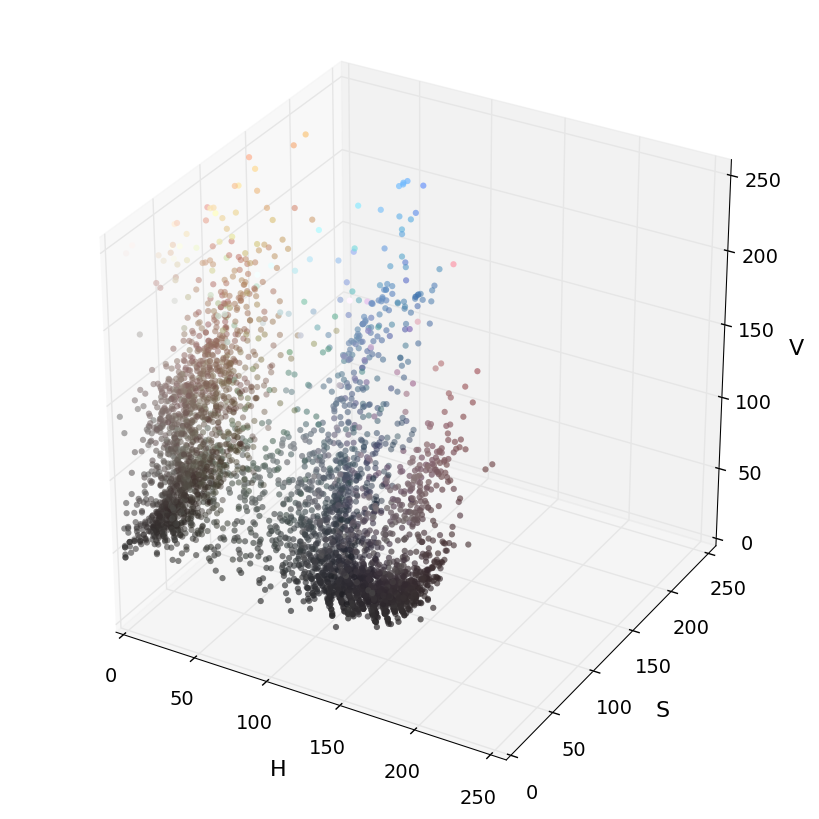

In [63]:
Plot3dOp(cv2.cvtColor(img_small, cv2.COLOR_BGR2HSV), img_small_rgb, axis_labels=list("HSV")).perform()
plt.show()

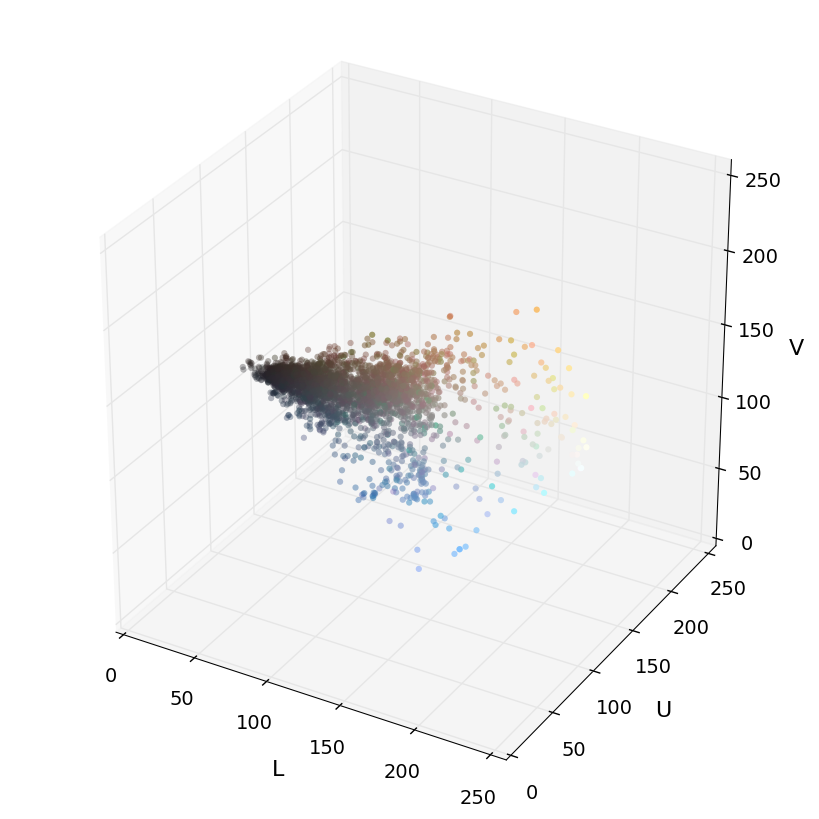

In [64]:
Plot3dOp(cv2.cvtColor(img_small, cv2.COLOR_BGR2LUV), img_small_rgb, axis_labels=list("LUV")).perform()
plt.show()

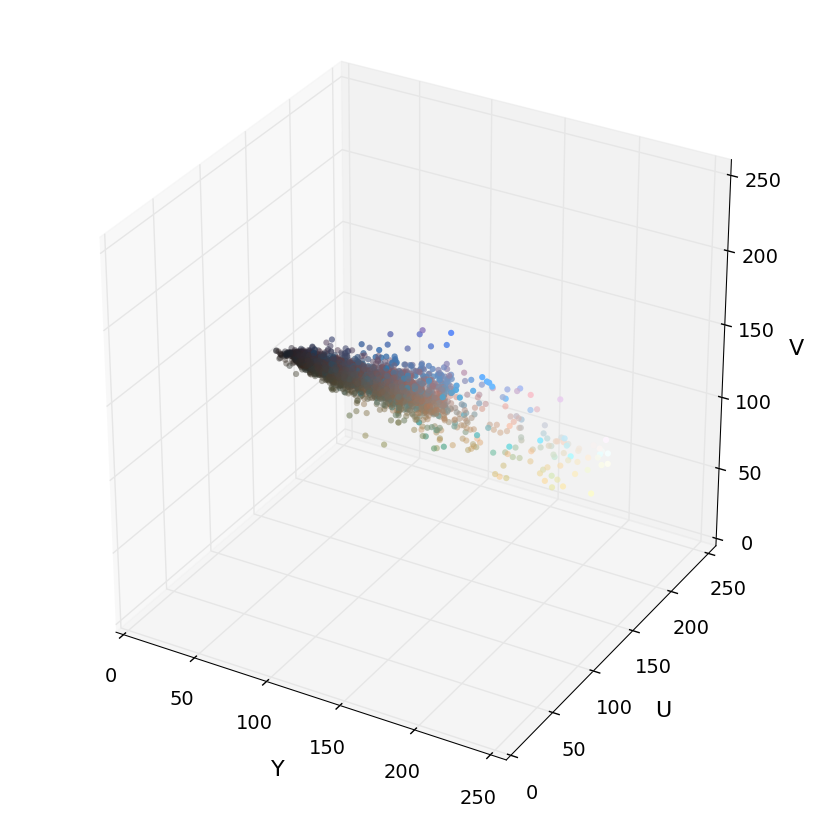

In [65]:
Plot3dOp(cv2.cvtColor(img_small, cv2.COLOR_BGR2YUV), img_small_rgb, axis_labels=list("YUV")).perform()
plt.show()

### 15. Spacial Binning of Color 

[classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/2b62a1c3-e151-4a0e-b6b6-e424fa46ceab/lessons/fd66c083-4ccb-4fe3-bda1-c29db76f50a0/concepts/404dfd70-937b-468f-a3df-5fb88cc2f765)

![](https://d17h27t6h515a5.cloudfront.net/topher/2016/December/585c6ac5_spatial-binning/spatial-binning.jpg)

You saw earlier in the lesson that template matching is not a particularly robust method for finding vehicles unless you know exactly what your target object looks like. However, raw pixel values are still quite useful to include in your feature vector in searching for cars.

While it could be cumbersome to include three color channels of a full resolution image, you can perform spatial binning on an image and still retain enough information to help in finding vehicles.

As you can see in the example above, even going all the way down to 32 x 32 pixel resolution, the car itself is still clearly identifiable by eye, and this means that the relevant features are still preserved at this resolution.

A convenient function for scaling down the resolution of an image is OpenCV's **cv2.resize()**. You can use it to scale a color image or a single color channel like this (you can find the original image [here](https://s3.amazonaws.com/udacity-sdc/Vehicle_Tracking/test_img.jpg)):

```python
import cv2
import matplotlib.image as mpimg

image = mpimg.imread('test_img.jpg')
small_img = cv2.resize(image, (32, 32))
print(small_img.shape)
(32, 32, 3)
```

If you then wanted to convert this to a one dimensional feature vector, you could simply say something like:

```python
feature_vec = small_img.ravel()
print(feature_vec.shape)
(3072,)
```

Ok, but 3072 elements is still quite a few features! Could you get away with even lower resolution? I'll leave that for you to explore later when you're training your classifier.

Now that you've played with color spaces a bit, it's probably a good time to write a function that allows you to convert any test image into a feature vector that you can feed your classifier. So, your goal in this exercise is to write a function that takes in an image, a color space conversion, and the resolution you would like to convert it to, and returns a feature vector. Something like this:

```python
# Define a function that takes an image, a color space, 
# and a new image size
# and returns a feature vector
def bin_spatial(img, color_space='RGB', size=(32, 32)):
    # Convert image to new color space (if specified)
    # Use cv2.resize().ravel() to create the feature vector
    # Return the feature vector
```

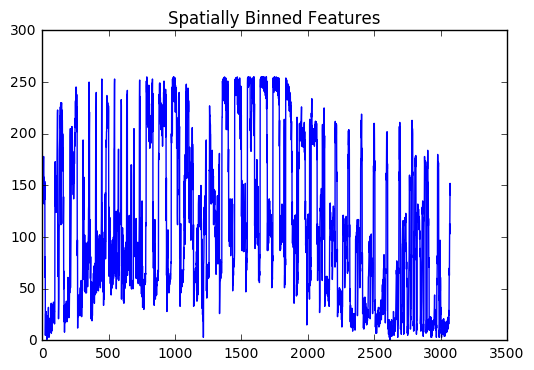

In [66]:
image = mpimg.imread('notes/cutouts/cutout1.jpg')
feature_vec = ReshapeAndCvtColorOp(image, color_space='RGB', size=(32, 32)).perform().output()

# Plot features
plt.plot(feature_vec)
plt.title('Spatially Binned Features')

### 16. Gradient Features

[classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/2b62a1c3-e151-4a0e-b6b6-e424fa46ceab/lessons/fd66c083-4ccb-4fe3-bda1-c29db76f50a0/concepts/ece9a8d8-3df0-449c-b0ca-8ee2be6a426b)

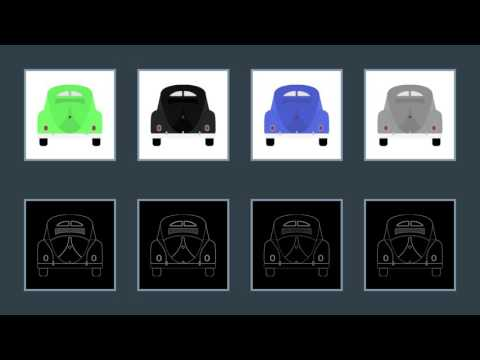

In [67]:
youtube('cvGtDBu8ONQ')

### 17. HOG Features

[classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/2b62a1c3-e151-4a0e-b6b6-e424fa46ceab/lessons/fd66c083-4ccb-4fe3-bda1-c29db76f50a0/concepts/3ad77532-b86a-432f-a0ee-deb94e3778b4)

Here is a [presentation](https://www.youtube.com/watch?v=7S5qXET179I) on using Histogram of Oriented Gradient (HOG) features for pedestrian detection by Navneet Dalal, the original developer of HOG for object detection. You can find his original paper on the subject [here](http://lear.inrialpes.fr/people/triggs/pubs/Dalal-cvpr05.pdf).

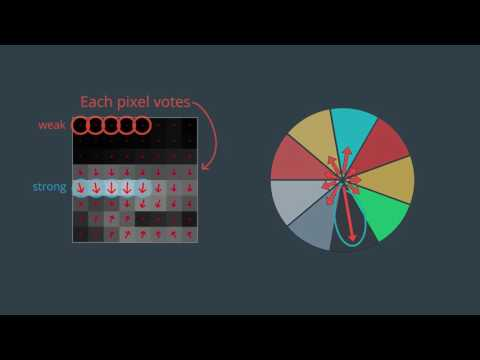

In [68]:
youtube('DNweoAqjwNQ')

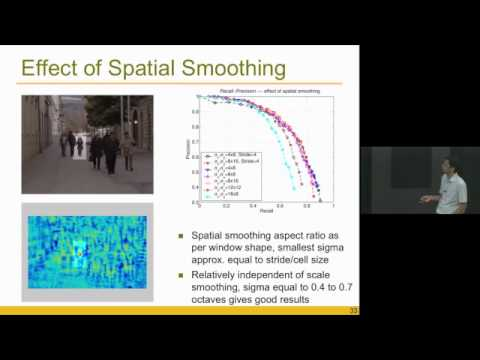

In [69]:
youtube('7S5qXET179I')

### 18. Data Exploration

[classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/2b62a1c3-e151-4a0e-b6b6-e424fa46ceab/lessons/fd66c083-4ccb-4fe3-bda1-c29db76f50a0/concepts/8c5ca570-3888-459b-9189-94cbfb8ef02c)

For the exercises throughout the rest of this lesson, we'll use a relatively small labeled dataset to try out feature extraction and training a classifier. Before we get on to extracting HOG features and training a classifier, let's explore the dataset a bit. This dataset is a subset of the data you'll be starting with for the project.

There's no need to download anything at this point, but if you want to, you can download this subset of images for [vehicles](https://s3.amazonaws.com/udacity-sdc/Vehicle_Tracking/vehicles_smallset.zip) and [non-vehicles](https://s3.amazonaws.com/udacity-sdc/Vehicle_Tracking/non-vehicles_smallset.zip), or if you prefer you can directly grab the larger project dataset for [vehicles](https://s3.amazonaws.com/udacity-sdc/Vehicle_Tracking/vehicles.zip) and [non-vehicles](https://s3.amazonaws.com/udacity-sdc/Vehicle_Tracking/non-vehicles.zip).

These datasets are comprised of images taken from the [GTI vehicle image database](http://www.gti.ssr.upm.es/data/Vehicle_database.html), the [KITTI vision benchmark suite](http://www.cvlibs.net/datasets/kitti/), and examples extracted from the project video itself. In this exercise, you can explore the data to see what you're working with.

You are also welcome and encouraged to explore the recently released [Udacity labeled dataset](https://github.com/udacity/self-driving-car/tree/master/annotations). Each of the Udacity datasets comes with a **labels.csv** file that gives bounding box corners for each object labeled.

![](https://d17h27t6h515a5.cloudfront.net/topher/2016/December/585b3d71_car-not-car-examples/car-not-car-examples.jpg)

Here, I've provided you with the code to extract the car/not-car image filenames into two lists. Write a function that takes in these two lists and returns a dictionary with the keys "n_cars", "n_notcars", "image_shape", and "data_type", like this:


```python
# Define a function to return some characteristics of the dataset 
def data_look(car_list, notcar_list):
    data_dict = {}
    # Define a key in data_dict "n_cars" and store the number of car images
    # Define a key "n_notcars" and store the number of notcar images
    # Read in a test image, either car or notcar
    # Define a key "image_shape" and store the test image shape 3-tuple
    # Define a key "data_type" and store the data type of the test image.
    # Return data_dict
    return data_dict
```


#### car_notcar.py

Your function returned a count of 1196  cars and 1125  non-cars
of size:  (64, 64, 3)  and data type: uint8


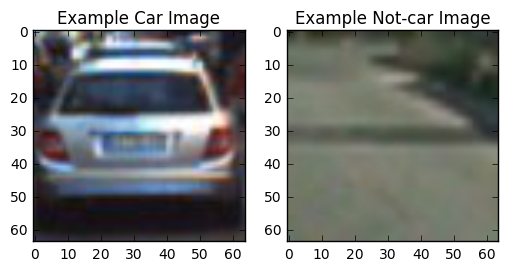

In [70]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import cv2
import glob
#from skimage.feature import hog
#from skimage import color, exposure
# images are divided up into vehicles and non-vehicles

images = glob.glob('notes/hog_images/**/*.jpeg')
cars = []
notcars = []

for image in images:
    image_name = os.path.basename(image)
    if 'image' in image_name or 'extra' in image_name:
        notcars.append(image)
    else:
        cars.append(image)
        
# Define a function to return some characteristics of the dataset 
def data_look(car_list, notcar_list):
    data_dict = {}
    # Define a key in data_dict "n_cars" and store the number of car images
    data_dict["n_cars"] = len(car_list)
    # Define a key "n_notcars" and store the number of notcar images
    data_dict["n_notcars"] = len(notcar_list)
    # Read in a test image, either car or notcar
    example_image = mpimg.imread(car_list[0])
    # Define a key "image_shape" and store the test image shape 3-tuple
    data_dict["image_shape"] = example_image.shape
    # Define a key "data_type" and store the data type of the test image.
    data_dict["data_type"] = example_image.dtype
    # Return data_dict
    return data_dict
    
data_info = data_look(cars, notcars)

print('Your function returned a count of', 
      data_info["n_cars"], ' cars and', 
      data_info["n_notcars"], ' non-cars')
print('of size: ',data_info["image_shape"], ' and data type:', 
      data_info["data_type"])
# Just for fun choose random car / not-car indices and plot example images   
car_ind = np.random.randint(0, len(cars))
notcar_ind = np.random.randint(0, len(notcars))
    
# Read in car / not-car images
car_image = mpimg.imread(cars[car_ind])
notcar_image = mpimg.imread(notcars[notcar_ind])


# Plot the examples
fig = plt.figure()
plt.subplot(121)
plt.imshow(car_image)
plt.title('Example Car Image')
plt.subplot(122)
plt.imshow(notcar_image)
plt.title('Example Not-car Image')

#### solution.py

In [71]:
# Define a function to return some characteristics of the dataset 
def data_look(car_list, notcar_list):
    data_dict = {}
    # Define a key in data_dict "n_cars" and store the number of car images
    data_dict["n_cars"] = len(car_list)
    # Define a key "n_notcars" and store the number of notcar images
    data_dict["n_notcars"] = len(notcar_list)
    # Read in a test image, either car or notcar
    example_img = mpimg.imread(car_list[0])
    # Define a key "image_shape" and store the test image shape 3-tuple
    data_dict["image_shape"] = example_img.shape
    # Define a key "data_type" and store the data type of the test image.
    data_dict["data_type"] = example_img.dtype
    # Return data_dict
    return data_dict

### 19. scikit-image HOG

[classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/2b62a1c3-e151-4a0e-b6b6-e424fa46ceab/lessons/fd66c083-4ccb-4fe3-bda1-c29db76f50a0/concepts/d479f43a-7bbb-4de7-9452-f6b991ece599)

Now that we've got a dataset let's extract some HOG features!

![](https://d17h27t6h515a5.cloudfront.net/topher/2016/December/585b4f91_scikit-image-logo/scikit-image-logo.png)

The [scikit-image](http://scikit-image.org/) package has a built in function to extract Histogram of Oriented Gradient features. The documentation for this function can be found [here](http://scikit-image.org/docs/dev/api/skimage.feature.html?highlight=feature%20hog#skimage.feature.hog) and a brief explanation of the algorithm and tutorial can be found [here](http://scikit-image.org/docs/dev/auto_examples/plot_hog.html).

The scikit-image **hog()** function takes in a single color channel or grayscaled image as input, as well as various parameters. These parameters include **orientations**, **pixels_per_cell** and **cells_per_block**.

The number of **orientations** is specified as an integer, and represents the number of orientation bins that the gradient information will be split up into in the histogram. Typical values are between 6 and 12 bins.

The **pixels_per_cell** parameter specifies the cell size over which each gradient histogram is computed. This paramater is passed as a 2-tuple so you could have different cell sizes in x and y, but cells are commonly chosen to be square.

The **cells_per_block** parameter is also passed as a 2-tuple, and specifies the local area over which the histogram counts in a given cell will be normalized. Block normalization is not necessarily required, but generally leads to a more robust feature set.

There is another optional power law or "gamma" normalization scheme set by the flag **transform_sqrt**. This type of normalization may help reduce the effects of shadows or other illumination variation, but will cause an error if your image contains negative values (because it's taking the square root of image values).

![](https://d17h27t6h515a5.cloudfront.net/topher/2016/December/585b6011_hog-visualization/hog-visualization.jpg)

This is where things get a little confusing though. Let's say you are computing HOG features for an image like the one shown above that is 64×64 pixels. If you set **pixels_per_cell=(8, 8)** and **cells_per_block=(2, 2)** and **orientations=9**. How many elements will you have in your HOG feature vector for the entire image?

You might guess the number of orientations times the number of cells, or 9×8×8=576, but that's not the case if you're using block normalization! In fact, the HOG features for all cells in each block are computed at each block position and the block steps across and down through the image cell by cell.

So, the actual number of features in your final feature vector will be the total number of block positions multiplied by the number of cells per block, times the number of orientations, or in the case shown above: 7×7×2×2×9=1764.

For the example above, you would call the **hog()** function on a single color channel **img** like this:

```python
from skimage.feature import hog
pix_per_cell = 8
cell_per_block = 2
orient = 9

features, hog_image = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell), cells_per_block=(cell_per_block, cell_per_block), visualise=True, feature_vector=False)
```

The **visualise=True** flag tells the function to output a visualization of the HOG feature computation as well, which we're calling **hog_image** in this case. If we take a look at a single color channel for a random car image, and its corresponding HOG visulization, they look like this:

![](https://d17h27t6h515a5.cloudfront.net/topher/2016/December/585c12d2_car-and-hog/car-and-hog.jpg)

The HOG visualization is not actually the feature vector, but rather, a representation that shows the dominant gradient direction within each cell with brightness corresponding to the strength of gradients in that cell, much like the "star" representation in the last video.

If you look at the **features** output, you'll find it's an array of shape **7×7×2×2×9**. This corresponds to the fact that a grid of **7×7** blocks were sampled, with **2×2** cells in each block and 9 orientations per cell. You can unroll this array into a feature vector using **features.ravel()**, which yields, in this case, a one dimensional array of length **1764**.

Alternatively, you can set the **feature_vector=True** flag when calling the **hog()** function to automatically unroll the features. In the project, it could be useful to have a function defined that you could pass an image to with specifications for **orientations**, **pixels_per_cell**, and **cells_per_block**, as well as flags set for whether or not you want the feature vector unrolled and/or a visualization image, so let's write it!

```python
# Define a function to return HOG features and visualization
def get_hog_features(img, orient, pix_per_cell, cell_per_block, vis=False, feature_vec=True):
    if vis == True:
        # Use skimage.hog() to get both features and a visualization
        return features, hog_image
    else:      
        # Use skimage.hog() to get features only
        return features
```

Note: you could also include a keyword to set the **tranform_sqrt** flag but for this exercise you can just leave this at the default value of **transform_sqrt=False**.

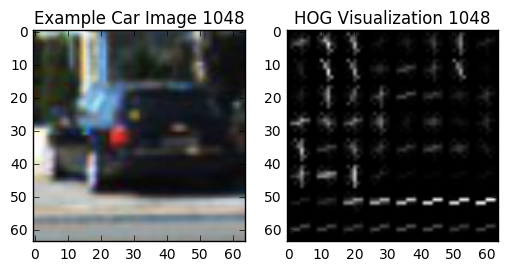

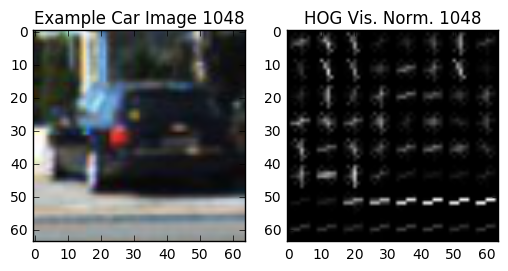

In [72]:
# Read in our vehicles and non-vehicles
images = glob.glob('notes/hog_images/**/*.jpeg')
cars = []
notcars = []

for image in images:
    image_name = os.path.basename(image)
    if 'image' in image_name or 'extra' in image_name:
        notcars.append(image)
    else:
        cars.append(image)

# Generate a random index to look at a car image
ind = np.random.randint(0, len(cars))
# Read in the image
image = mpimg.imread(cars[ind])
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

# Define HOG parameters
orient = 9
pix_per_cell = 8
cell_per_block = 2

# Call our function with vis=True to see an image output
features, hog_image = HOGExtractorOp(
    gray, orient, 
    pix_per_cell, cell_per_block, 
    visualize=True,
    feature_vec=False, 
    normalize=False
).perform().output()


# Plot the examples
fig = plt.figure()
plt.subplot(121)
plt.imshow(image, cmap='gray')
plt.title('Example Car Image {}'.format(str(ind)))
plt.subplot(122)
plt.imshow(hog_image, cmap='gray')
plt.title('HOG Visualization {}'.format(str(ind)))


# Call our function with vis=True to see an image output
features, hog_image = HOGExtractorOp(
    gray, orient, 
    pix_per_cell, cell_per_block, 
    visualize=True,
    feature_vec=False, 
    normalize=True
).perform().output()

# Plot the examples
fig = plt.figure()
plt.subplot(121)
plt.imshow(image, cmap='gray')
plt.title('Example Car Image {}'.format(str(ind)))
plt.subplot(122)
plt.imshow(hog_image, cmap='gray')
plt.title('HOG Vis. Norm. {}'.format(str(ind)))

### 20. Combing Features

[classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/2b62a1c3-e151-4a0e-b6b6-e424fa46ceab/lessons/fd66c083-4ccb-4fe3-bda1-c29db76f50a0/concepts/086ae6da-f3e1-4897-8e77-31500b7c26c1)

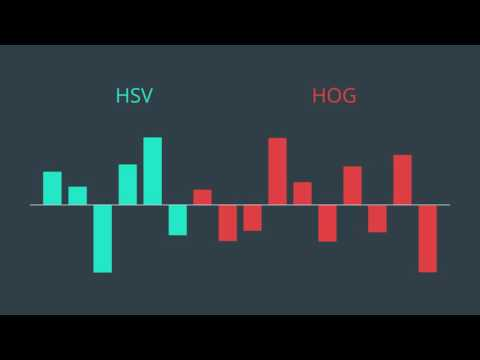

In [73]:
youtube('5tQx6J-VzsI')

### 21. Combine and Normalize Features

[classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/2b62a1c3-e151-4a0e-b6b6-e424fa46ceab/lessons/fd66c083-4ccb-4fe3-bda1-c29db76f50a0/concepts/cacf86d7-f8eb-46bd-9f09-34a2ff208ce8)

![](https://d17h27t6h515a5.cloudfront.net/topher/2016/December/585c6731_scaled-features-vis/scaled-features-vis.jpg)

Now that you've got several feature extraction methods in your toolkit, you're almost ready to train a classifier, but first, as in any machine learning application, you need to normalize your data. Python's **sklearn** package provides you with the **StandardScaler()** method to accomplish this task. To read more about how you can choose different normalizations with the **StandardScaler()** method, check out the [documentation](http://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html).

To apply **StandardScaler()** you need to first have your data in the right format, as a numpy array where each row is a single feature vector. I will often create a list of feature vectors, and then convert them like this:

```python
import numpy as np
feature_list = [feature_vec1, feature_vec2, ...]
# Create an array stack, NOTE: StandardScaler() expects np.float64
X = np.vstack(feature_list).astype(np.float64)
```

You can then fit a scaler to X, and scale it like this:

```python
from sklearn.preprocessing import StandardScaler
# Fit a per-column scaler
X_scaler = StandardScaler().fit(X)
# Apply the scaler to X
scaled_X = X_scaler.transform(X)
```

Now, **scaled_X** contains the normalized feature vectors. In this next exercise, I've provided the feature scaling step for you, but I need you to provide the feature vectors. I've also provided versions of the **bin_spatial()** and **color_hist()** functions you wrote in previous exercises.

Your goal in this exercise is to write a function that takes in a list of image filenames, reads them one by one, then applies a color conversion (if necessary) and uses **bin_spatial()** and **color_hist()** to generate feature vectors. Your function should then concatenate those two feature vectors and append the result to a list. After cycling through all the images, your function should return the list of feature vectors. Something like this:

```python
# Define a function to extract features from a list of images
# Have this function call bin_spatial() and color_hist()
def extract_features(imgs, cspace='RGB', spatial_size=(32, 32),
                        hist_bins=32, hist_range=(0, 256)):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
        # Read in each one by one
        # apply color conversion if other than 'RGB'
        # Apply bin_spatial() to get spatial color features
        # Apply color_hist() to get color histogram features
        # Append the new feature vector to the features list
    # Return list of feature vectors
    return features
```

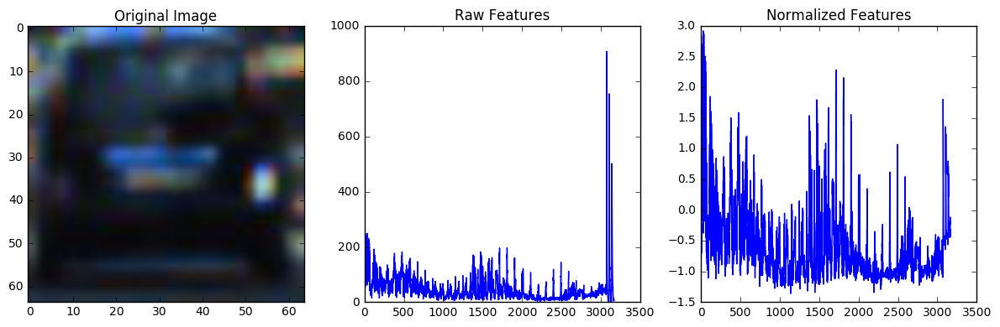

In [74]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from sklearn.preprocessing import StandardScaler
import glob

# Define a function to compute binned color features  
def bin_spatial(img, size=(32, 32)):
    # Use cv2.resize().ravel() to create the feature vector
    features = cv2.resize(img, size).ravel() 
    # Return the feature vector
    return features

# Define a function to compute color histogram features  
def color_hist(img, nbins=32, bins_range=(0, 256)):
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins, range=bins_range)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins, range=bins_range)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins, range=bins_range)
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return hist_features

###### TODO ###########
# Define a function to extract features from a list of images
# Have this function call bin_spatial() and color_hist()
def extract_features(imgs, cspace='RGB', spatial_size=(32, 32),
                        hist_bins=32, hist_range=(0, 256)):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for image in imgs:
        # Read in each one by one
        img = mpimg.imread(image)
        
        # Apply color conversion if other than 'RGB'
        # Apply bin_spatial() to get spatial color features
        spatial_features = ReshapeAndCvtColorOp(img, color_space=cspace, size=spatial_size).perform().output()
        
        # Apply color_hist() to get color histogram features
        rh, gh, bh, bincen, hist_features = ColorHistOp(img, nbins=hist_bins, bins_range=hist_range).perform().output()
        
        # Append the new feature vector to the features list
        features.append(np.concatenate((spatial_features, hist_features)))
    # Return list of feature vectors
    return features

images = glob.glob('notes/hog_images/**/*.jpeg')
cars = []
notcars = []
for image in images:
    image_name = os.path.basename(image)
    if 'image' in image_name or 'extra' in image_name:
        notcars.append(image)
    else:
        cars.append(image)

car_features = extract_features(cars, cspace='RGB', spatial_size=(32, 32),
                        hist_bins=32, hist_range=(0, 256))
notcar_features = extract_features(notcars, cspace='RGB', spatial_size=(32, 32),
                        hist_bins=32, hist_range=(0, 256))

if len(car_features) > 0:
    # Create an array stack of feature vectors
    X = np.vstack((car_features, notcar_features)).astype(np.float64)                        
    # Fit a per-column scaler
    X_scaler = StandardScaler().fit(X)
    # Apply the scaler to X
    scaled_X = X_scaler.transform(X)
    car_ind = np.random.randint(0, len(cars))
    # Plot an example of raw and scaled features
    fig = plt.figure(figsize=(12,4))
    plt.subplot(131)
    plt.imshow(mpimg.imread(cars[car_ind]))
    plt.title('Original Image')
    plt.subplot(132)
    plt.plot(X[car_ind])
    plt.title('Raw Features')
    plt.subplot(133)
    plt.plot(scaled_X[car_ind])
    plt.title('Normalized Features')
    fig.tight_layout()
else: 
    print('Your function only returns empty feature vectors...')

### 22. Build a Classifier

[classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/2b62a1c3-e151-4a0e-b6b6-e424fa46ceab/lessons/fd66c083-4ccb-4fe3-bda1-c29db76f50a0/concepts/e076b291-41e4-40f7-9268-c5054508b77c)

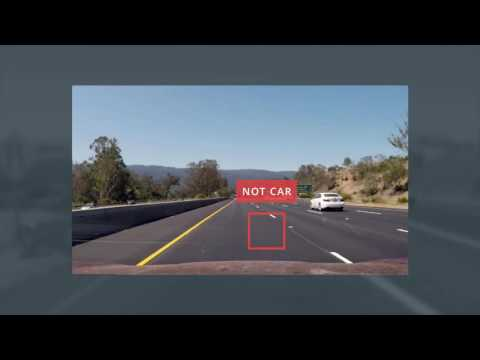

In [75]:
youtube('YUCFFNC7tw4')

### 23. Labeled Data

[classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/2b62a1c3-e151-4a0e-b6b6-e424fa46ceab/lessons/fd66c083-4ccb-4fe3-bda1-c29db76f50a0/concepts/9a67cfac-5392-4fa9-8ef9-5ac60b22c8f0)

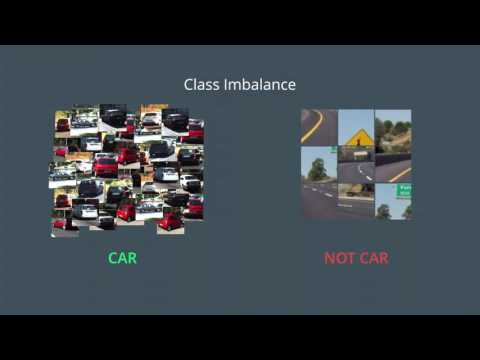

In [76]:
youtube('H_i1ctez_Qw')

### 24. Data Preparation

[classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/2b62a1c3-e151-4a0e-b6b6-e424fa46ceab/lessons/fd66c083-4ccb-4fe3-bda1-c29db76f50a0/concepts/c8c13b8b-e6b3-425f-861b-8faecf90562e)

![](notes/24_data_prep_quiz.png)

### 25. Train a Classifier

[classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/2b62a1c3-e151-4a0e-b6b6-e424fa46ceab/lessons/fd66c083-4ccb-4fe3-bda1-c29db76f50a0/concepts/eba01010-d093-4b48-84ea-dbae249c6d9c)

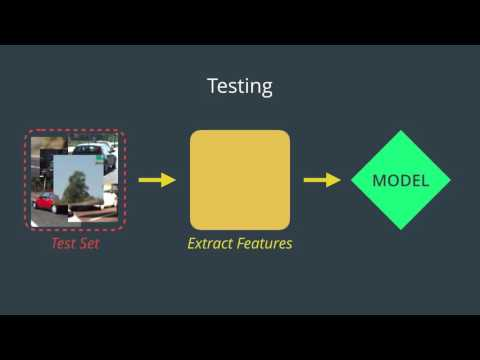

In [77]:
youtube('EBEN6KLQm8A')

### 26. Color Classify

[classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/2b62a1c3-e151-4a0e-b6b6-e424fa46ceab/lessons/fd66c083-4ccb-4fe3-bda1-c29db76f50a0/concepts/be308636-742b-416a-8fcc-c6071865a11f)

![](https://d17h27t6h515a5.cloudfront.net/topher/2016/December/5862dd38_car-color-and-hist/car-color-and-hist.jpg)

Now we'll try training a classifier on our dataset. First, we'll see how well it does just using spatially binned color and color histograms.

To do this, we'll use the functions you defined in previous exercises, namely, **bin_spatial()**, **color_hist()**, and **extract_features()**. We'll then read in our car and non-car images, extract the color features for each, and scale the feature vectors to zero mean and unit variance.

All that remains is to define a labels vector, shuffle and split the data into training and testing sets, and finally, define a classifier and train it!

Our labels vector **y** in this case will just be a binary vector indicating whether each feature vector in our dataset corresponds to a car or non-car (1's for cars, 0's for non-cars). Given lists of car and non-car features (the output of **extract_features()**) we can define a labels vector like this:

```python
import numpy as np
# Define a labels vector based on features lists
y = np.hstack((np.ones(len(car_features)), 
              np.zeros(len(notcar_features))))
```

Next, we'll stack and scale our feature vectors like before:

```python
from sklearn.preprocessing import StandardScaler
# Create an array stack of feature vectors
X = np.vstack((car_features, notcar_features)).astype(np.float64)
# Fit a per-column scaler
X_scaler = StandardScaler().fit(X)
# Apply the scaler to X
scaled_X = X_scaler.transform(X)
```

And now we're ready to shuffle and split the data into training and testing sets. To to this we'll use the Scikit-Learn **train_test_split()** function, but it's worth noting that recently, this function moved from the **sklearn.cross_validation** package (in **sklearn** version <=0.17) to the **sklearn.model_selection** package (in **sklearn** version >=0.18).

In the quiz editor we're still running **sklearn** v0.17, so we'll import it like this:

```python
# from sklearn.cross_validation import train_test_split
# But, if you are using scikit-learn >= 0.18 then use this:
from sklearn.model_selection import train_test_split
```

**train_test_split()** performs both the shuffle and split of the data and you'll call it like this (here choosing to initialize the shuffle with a different random state each time):

```python
# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(
    scaled_X, y, test_size=0.2, random_state=rand_state)
```

**Warning: when dealing with image data that was extracted from video, you may be dealing with sequences of images where your target object (vehicles in this case) appear almost identical in a whole series of images. In such a case, even a randomized train-test split will be subject to overfitting because images in the training set may be nearly identical to images in the test set. For the subset of images used in the next several quizzes, this is not a problem, but to optimize your classifier for the project, you may need to worry about time-series of images!**

--

Now, you're ready to define and train a classifier! Here we'll try a Linear Support Vector Machine. To define and train your classifier it takes just a few lines of code:

```python
from sklearn.svm import LinearSVC
# Use a linear SVC (support vector classifier)
svc = LinearSVC()
# Train the SVC
svc.fit(X_train, y_train)
```

Then you can check the accuracy of your classifier on the test dataset like this:

```python
print('Test Accuracy of SVC = ', svc.score(X_test, y_test))
```

Or you can make predictions on a subset of the test data and compare directly with ground truth:

```python
print('My SVC predicts: ', svc.predict(X_test[0:10].reshape(1, -1)))
print('For labels: ', y_test[0:10])
```

Play with the parameter values **spatial** and **histbin** in the exercise below to see how the classifier accuracy and training time vary with the feature vector input.

In [99]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import cv2
import glob
import time
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
# NOTE: the next import is only valid 
# for scikit-learn version <= 0.17
# if you are using scikit-learn >= 0.18 then use this:
from sklearn.model_selection import train_test_split
# from sklearn.cross_validation import train_test_split

# Define a function to compute binned color features  
def bin_spatial(img, size=(32, 32)):
    # Use cv2.resize().ravel() to create the feature vector
    features = cv2.resize(img, size).ravel() 
    # Return the feature vector
    return features

# Define a function to compute color histogram features  
def color_hist(img, nbins=32, bins_range=(0, 256)):
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins, range=bins_range)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins, range=bins_range)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins, range=bins_range)
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return hist_features

# Define a function to extract features from a list of images
# Have this function call bin_spatial() and color_hist()
def extract_features(imgs, cspace='RGB', spatial_size=(32, 32),
                        hist_bins=32, hist_range=(0, 256)):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for file in imgs:
        # Read in each one by one
        image = mpimg.imread(file)
        # apply color conversion if other than 'RGB'
        if cspace != 'RGB':
            if cspace == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif cspace == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif cspace == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif cspace == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
        else: feature_image = np.copy(image)      
        # Apply bin_spatial() to get spatial color features
        spatial_features = bin_spatial(feature_image, size=spatial_size)
        # Apply color_hist() also with a color space option now
        hist_features = color_hist(feature_image, nbins=hist_bins, bins_range=hist_range)
        # Append the new feature vector to the features list
        features.append(np.concatenate((spatial_features, hist_features)))
    # Return list of feature vectors
    return features


# Read in car and non-car images
images = glob.glob('notes/hog_images/**/*.jpeg')
cars = []
notcars = []

for image in images:
    image_name = os.path.basename(image)
    if 'image' in image_name or 'extra' in image_name:
        notcars.append(image)
    else:
        cars.append(image)

# TODO play with these values to see how your classifier
# performs under different binning scenarios

# spatial = 4 # histbin 32 - 98.33%
spatial = 8 # histbin 32 - 99.37%
# spatial = 16 # histbin 32 - 98.54%
# spatial = 24 # histbin 32 - 97.08%
# spatial = 32 # histbin 32 - 97.91%

# histbin = 8 # spatial 8 - 96.87%
# histbin = 16 # spatial 8 - 95.82%
# histbin = 24 # spatial 8 - 98.54%
histbin = 32 # spatial 8 - 99.58%
# histbin = 64 # spatial 8 - 98.75%
# histbin = 128 # spatial 8 - 97.91%

colorspace = 'RGB'
#colorspace = 'YUV'
#colorspace = 'LUV'
#colorspace = 'HSV'
#colorspace = 'HLS'

car_features = extract_features(cars, cspace=colorspace, spatial_size=(spatial, spatial),
                        hist_bins=histbin, hist_range=(0, 256))
notcar_features = extract_features(notcars, cspace=colorspace, spatial_size=(spatial, spatial),
                        hist_bins=histbin, hist_range=(0, 256))

# Create an array stack of feature vectors
X = np.vstack((car_features, notcar_features)).astype(np.float64)                        
# Fit a per-column scaler
X_scaler = StandardScaler().fit(X)
# Apply the scaler to X
scaled_X = X_scaler.transform(X)

# Define the labels vector
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))


# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(
    scaled_X, y, test_size=0.2, random_state=rand_state)

print('Using spatial binning of:',spatial,
    'and', histbin,'histogram bins')
print('Feature vector length:', len(X_train[0]))
# Use a linear SVC 
svc = LinearSVC()
# Check the training time for the SVC
t=time.time()
svc.fit(X_train, y_train)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')
# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))
# Check the prediction time for a single sample
t=time.time()
n_predict = 10
print('My SVC predicts: ', svc.predict(X_test[0:n_predict]))
print('For these',n_predict, 'labels: ', y_test[0:n_predict])
t2 = time.time()
print(round(t2-t, 5), 'Seconds to predict', n_predict,'labels with SVC')

Using spatial binning of: 8 and 32 histogram bins
Feature vector length: 288
0.1 Seconds to train SVC...
Test Accuracy of SVC =  0.9957
My SVC predicts:  [ 0.  1.  0.  1.  0.  0.  0.  1.  0.  1.]
For these 10 labels:  [ 0.  1.  0.  1.  0.  0.  0.  1.  0.  1.]
0.00153 Seconds to predict 10 labels with SVC


### 27. HOG Classify

[classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/2b62a1c3-e151-4a0e-b6b6-e424fa46ceab/lessons/fd66c083-4ccb-4fe3-bda1-c29db76f50a0/concepts/7355e459-55d0-4f2d-923c-4810c4360267)

Alright, so classification by color features alone is pretty effective! Now let's try classifying with HOG features and see how well we can do.

![](https://d17h27t6h515a5.cloudfront.net/topher/2016/December/5862ea51_car-and-hog/car-and-hog.jpg)

**NOTE: if you copy the code from the exercise below onto your local machine, but are running sklearn version >= 0.18 you will need to change from calling:**

```python
from sklearn.cross_validation import train_test_split
```

to:

```python
from sklearn.model_selection import train_test_split
```

In the exercise below, you're given all the code to extract HOG features and train a linear SVM. There is no right or wrong answer, but your mission, should you choose to accept it, is to play with the parameters **colorspace**, **orient**, **pix_per_cell**, **cell_per_block**, and **hog_channel** to get a feel for what combination of parameters give the best results.

**Note**: hog_channel can take values of 0, 1, 2, or "ALL", meaning that you extract HOG features from the first, second, third, or all color channels respectively.

#### TIPS

The scikit-image **hog()** function takes in a single color channel or grayscaled image as input, as well as various parameters. These parameters include **orientations**, **pixels_per_cell** and **cells_per_block**.

The number of **orientations** is specified as an integer, and represents the number of orientation bins that the gradient information will be split up into in the histogram. Typical values are between 6 and 12 bins.

The **pixels_per_cell** parameter specifies the cell size over which each gradient histogram is computed. This paramater is passed as a 2-tuple so you could have different cell sizes in x and y, but cells are commonly chosen to be square.

The **cells_per_block** parameter is also passed as a 2-tuple, and specifies the local area over which the histogram counts in a given cell will be normalized. Block normalization is not necessarily required, but generally leads to a more robust feature set.

There is another optional power law or "gamma" normalization scheme set by the flag **transform_sqrt**. This type of normalization may help reduce the effects of shadows or other illumination variation, but will cause an error if your image contains negative values (because it's taking the square root of image values).

In [115]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import cv2
import glob
import time
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
from skimage.feature import hog
# NOTE: the next import is only valid for scikit-learn version <= 0.17
# for scikit-learn >= 0.18 use:
# from sklearn.model_selection import train_test_split
from sklearn.cross_validation import train_test_split

# Define a function to return HOG features and visualization
def get_hog_features(img, orient, pix_per_cell, cell_per_block, 
                        vis=False, feature_vec=True):
    # Call with two outputs if vis==True
    if vis == True:
        features, hog_image = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), transform_sqrt=True, 
                                  visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    # Otherwise call with one output
    else:      
        features = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), transform_sqrt=True, 
                       visualise=vis, feature_vector=feature_vec)
        return features

# Define a function to extract features from a list of images
# Have this function call bin_spatial() and color_hist()
def extract_features(imgs, cspace='RGB', orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for file in imgs:
        # Read in each one by one
        image = mpimg.imread(file)
        # apply color conversion if other than 'RGB'
        if cspace != 'RGB':
            if cspace == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif cspace == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif cspace == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif cspace == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif cspace == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else: feature_image = np.copy(image)      

        # Call get_hog_features() with vis=False, feature_vec=True
        if hog_channel == 'ALL':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                hog_features.append(get_hog_features(feature_image[:,:,channel], 
                                    orient, pix_per_cell, cell_per_block, 
                                    vis=False, feature_vec=True))
            hog_features = np.ravel(hog_features)        
        else:
            hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                        pix_per_cell, cell_per_block, vis=False, feature_vec=True)
        # Append the new feature vector to the features list
        features.append(hog_features)
    # Return list of feature vectors
    return features


# Divide up into cars and notcars
images = glob.glob('notes/hog_images/**/*.jpeg')
cars = []
notcars = []

for image in images:
    image_name = os.path.basename(image)
    if 'image' in image_name or 'extra' in image_name:
        notcars.append(image)
    else:
        cars.append(image)

# Reduce the sample size because HOG features are slow to compute
# The quiz evaluator times out after 13s of CPU time
sample_size = 500
cars = cars[0:sample_size]
notcars = notcars[0:sample_size]

class Params():
    def __init__(self, colorspace='RGB', orient=9, pix_per_cell=8, cell_per_block=2, hog_channel=0):
        self.colorspace = colorspace # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
        self.orient = orient # typically between 6 and 12
        self.pix_per_cell = pix_per_cell
        self.cell_per_block = cell_per_block
        self.hog_channel = hog_channel # Can be 0, 1, 2, or "ALL"

        
################################################################################################################

### TODO: Tweak these parameters and see how the results change.
# params = Params(colorspace='YUV', orient=9, pix_per_cell=8, cell_per_block=2, hog_channel=0) #97%
# params = Params(colorspace='YUV', orient=8, pix_per_cell=8, cell_per_block=2, hog_channel=0) #98%
# params = Params(colorspace='YUV', orient=8, pix_per_cell=8, cell_per_block=2, hog_channel='ALL') #98.5%
params = Params(colorspace='YUV', orient=8, pix_per_cell=7, cell_per_block=2, hog_channel='ALL') #99%

################################################################################################################

t=time.time()
car_features = extract_features(cars, cspace=params.colorspace, orient=params.orient, 
                        pix_per_cell=params.pix_per_cell, cell_per_block=params.cell_per_block, 
                        hog_channel=params.hog_channel)
notcar_features = extract_features(notcars, cspace=params.colorspace, orient=params.orient, 
                        pix_per_cell=params.pix_per_cell, cell_per_block=params.cell_per_block, 
                        hog_channel=params.hog_channel)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to extract HOG features...')
# Create an array stack of feature vectors
X = np.vstack((car_features, notcar_features)).astype(np.float64)                        
# Fit a per-column scaler
X_scaler = StandardScaler().fit(X)
# Apply the scaler to X
scaled_X = X_scaler.transform(X)

# Define the labels vector
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))


# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(
    scaled_X, y, test_size=0.2, random_state=rand_state)

print('Using:',params.orient,'orientations',params.pix_per_cell,
    'pixels per cell and', params.cell_per_block,'cells per block')
print('Feature vector length:', len(X_train[0]))
# Use a linear SVC 
svc = LinearSVC()
# Check the training time for the SVC
t=time.time()
svc.fit(X_train, y_train)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')
# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))
# Check the prediction time for a single sample
t=time.time()
n_predict = 10
print('My SVC predicts: ', svc.predict(X_test[0:n_predict]))
print('For these',n_predict, 'labels: ', y_test[0:n_predict])
t2 = time.time()
print(round(t2-t, 5), 'Seconds to predict', n_predict,'labels with SVC')

4.81 Seconds to extract HOG features...
Using: 8 orientations 7 pixels per cell and 2 cells per block
Feature vector length: 6144
0.31 Seconds to train SVC...
Test Accuracy of SVC =  0.975
My SVC predicts:  [ 0.  1.  0.  1.  1.  0.  1.  0.  1.  1.]
For these 10 labels:  [ 0.  1.  0.  1.  1.  0.  1.  0.  1.  1.]
0.00121 Seconds to predict 10 labels with SVC


### 28. Sliding Windows

[classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/2b62a1c3-e151-4a0e-b6b6-e424fa46ceab/lessons/fd66c083-4ccb-4fe3-bda1-c29db76f50a0/concepts/169c67e2-32dd-4df2-b338-0eca85ef18d6)

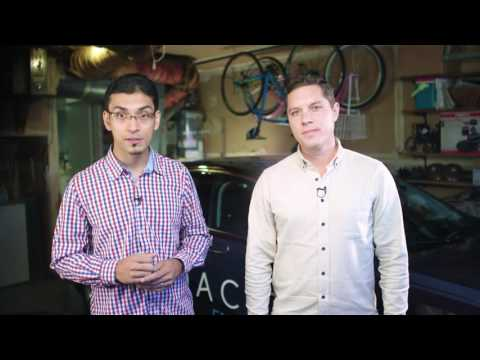

In [116]:
youtube('HMtd9EQooCk')

### 29. How many windows?

[classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/2b62a1c3-e151-4a0e-b6b6-e424fa46ceab/lessons/fd66c083-4ccb-4fe3-bda1-c29db76f50a0/concepts/96b0bcb6-691c-443f-b126-060c781c4e55)

![](https://d17h27t6h515a5.cloudfront.net/topher/2016/December/585d79e7_car-identified/car-identified.jpg)

To implement a sliding window search, you need to decide what size window you want to search, where in the image you want to start and stop your search, and how much you want windows to overlap. So, let's try an example to see how many windows we would be searching given a particular image size, window size, and overlap.

Suppose you have an image that is 256 x 256 pixels and you want to search windows of a size 128 x 128 pixels each with an overlap of 50% between adjacent windows in both the vertical and horizontal dimensions. Your sliding window search would then look like this:

![](https://d17h27t6h515a5.cloudfront.net/topher/2016/December/585d80c2_sliding-window/sliding-window.jpg)

So, you searched 9 windows total in this case. Let's try a quick quiz!

![](notes/29_how_many_windows_quiz.png)

### 30. Sliding Window Implementation

[classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/2b62a1c3-e151-4a0e-b6b6-e424fa46ceab/lessons/fd66c083-4ccb-4fe3-bda1-c29db76f50a0/concepts/8e39c07e-afd5-4ba5-9204-8b44aa39285c)

![](https://d17h27t6h515a5.cloudfront.net/topher/2016/December/585d9293_sliding-window/sliding-window.jpg)

In the last exercise, you saw how the number of windows scales with image size, window size, and overlap. In the project it will be useful to have a function to perform a sliding window search on an image, so let's write one! This will just be the first iteration, where you don't actually need to do anything besides plot a rectangle at each window position.

So, your goal here is to write a function that takes in an image, start and stop positions in both x and y (imagine a bounding box for the entire search region), window size (x and y dimensions), and overlap fraction (also for both x and y). Your function should return a list of bounding boxes for the search windows, which will then be passed to draw **draw_boxes()** function.

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

image = mpimg.imread('bbox-example-image.jpg')

# Here is your draw_boxes function from the previous exercise
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # Make a copy of the image
    imcopy = np.copy(img)
    # Iterate through the bounding boxes
    for bbox in bboxes:
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return imcopy
    
    
# Define a function that takes an image,
# start and stop positions in both x and y, 
# window size (x and y dimensions),  
# and overlap fraction (for both x and y)
def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], 
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    # If x and/or y start/stop positions not defined, set to image size
    # Compute the span of the region to be searched    
    # Compute the number of pixels per step in x/y
    # Compute the number of windows in x/y
    # Initialize a list to append window positions to
    window_list = []
    # Loop through finding x and y window positions
    #     Note: you could vectorize this step, but in practice
    #     you'll be considering windows one by one with your
    #     classifier, so looping makes sense
        # Calculate each window position
        # Append window position to list
    # Return the list of windows
    return window_list

windows = slide_window(image, x_start_stop=[None, None], y_start_stop=[None, None], 
                    xy_window=(128, 128), xy_overlap=(0.5, 0.5))
                       
window_img = draw_boxes(image, windows, color=(0, 0, 255), thick=6)                    
plt.imshow(window_img)

In [ ]:
# Define a function that takes an image,
# start and stop positions in both x and y, 
# window size (x and y dimensions),  
# and overlap fraction (for both x and y)
def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], 
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
    # Compute the span of the region to be searched    
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    # Compute the number of windows in x/y
    nx_windows = np.int(xspan/nx_pix_per_step) - 1
    ny_windows = np.int(yspan/ny_pix_per_step) - 1
    # Initialize a list to append window positions to
    window_list = []
    # Loop through finding x and y window positions
    # Note: you could vectorize this step, but in practice
    # you'll be considering windows one by one with your
    # classifier, so looping makes sense
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate window position
            startx = xs*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            # Append window position to list
            window_list.append(((startx, starty), (endx, endy)))
    # Return the list of windows
    return window_list


### 32. Multi-scale Windows

[classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/2b62a1c3-e151-4a0e-b6b6-e424fa46ceab/lessons/fd66c083-4ccb-4fe3-bda1-c29db76f50a0/concepts/4fc7adb8-c90c-4ac9-befd-0de118d5b4f2)

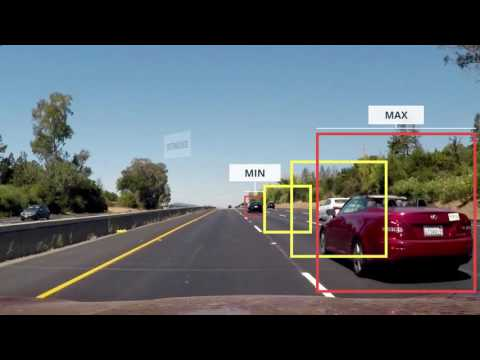

In [118]:
youtube('uiPNkPggWLE')

### 32. Search and Classify 

[classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/2b62a1c3-e151-4a0e-b6b6-e424fa46ceab/lessons/fd66c083-4ccb-4fe3-bda1-c29db76f50a0/concepts/40ac880a-7ccc-4145-a864-6b0b99ea31e9)

![](https://d17h27t6h515a5.cloudfront.net/topher/2016/December/5862f0a0_bbox-example-image/bbox-example-image.jpg)

Now you're able to run a sliding window search on an image and you've trained a classifier... time to combine both steps and search for cars!

You already have all the tools you need to do this from the previous exercises. Just train your classifier, then run your sliding window search, extract features, and predict whether each window contains a car or not. You'll probably find some false positives, but soon we'll deal with removing them.

In the **lesson_functions.py** tab on the quiz editor, you'll find all the functions we've defined so far in the lesson, including **get_hog_features()**, **bin_spatial()**, **color_hist()**, **extract_features()**, **slide_window()**, and **draw_boxes()**. These are now all imported for use in the quiz with this command:

```python
from lesson_functions import *
```

Two new functions are defined: **single_img_features()** and **search_windows()**. You can use these to search over all the windows defined by your **slide_windows()**, extract features at each window position, and predict with your classifier on each set of features.

We have limited the sample size to 500 each of car and not-car training images for the classifier to avoid quiz evaluator timeout, but if you search a very large number of windows or create huge feature vectors, you still may run into timeout issues. If you want to explore more, download the data and try the code on your local machine.

You can download the subset of data used in this lesson for [vehicles](https://s3.amazonaws.com/udacity-sdc/Vehicle_Tracking/vehicles_smallset.zip) and [non-vehicles](https://s3.amazonaws.com/udacity-sdc/Vehicle_Tracking/non-vehicles_smallset.zip), or if you prefer, you can directly grab the larger project dataset for [vehicles](https://s3.amazonaws.com/udacity-sdc/Vehicle_Tracking/vehicles.zip) and [non-vehicles](https://s3.amazonaws.com/udacity-sdc/Vehicle_Tracking/non-vehicles.zip).

**In this exercise, experiment with different color and gradient feature sets, different search window sizes and overlap to get an idea of how your classifier performs with different training features. Getting false positives in the skies and treetops? Try restricting your search area on the image with y_start_stop in the slide_window() function. What combination of features works best?**

#### lesson_functions.py

In [119]:
import matplotlib.image as mpimg
import numpy as np
import cv2
from skimage.feature import hog
# Define a function to return HOG features and visualization
def get_hog_features(img, orient, pix_per_cell, cell_per_block, 
                        vis=False, feature_vec=True):
    # Call with two outputs if vis==True
    if vis == True:
        features, hog_image = hog(img, orientations=orient, 
                                  pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), 
                                  transform_sqrt=True, 
                                  visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    # Otherwise call with one output
    else:      
        features = hog(img, orientations=orient, 
                       pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), 
                       transform_sqrt=True, 
                       visualise=vis, feature_vector=feature_vec)
        return features

# Define a function to compute binned color features  
def bin_spatial(img, size=(32, 32)):
    # Use cv2.resize().ravel() to create the feature vector
    features = cv2.resize(img, size).ravel() 
    # Return the feature vector
    return features

# Define a function to compute color histogram features 
# NEED TO CHANGE bins_range if reading .png files with mpimg!
def color_hist(img, nbins=32, bins_range=(0, 256)):
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins, range=bins_range)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins, range=bins_range)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins, range=bins_range)
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return hist_features

# Define a function to extract features from a list of images
# Have this function call bin_spatial() and color_hist()
def extract_features(imgs, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for file in imgs:
        file_features = []
        # Read in each one by one
        image = mpimg.imread(file)
        # apply color conversion if other than 'RGB'
        if color_space != 'RGB':
            if color_space == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif color_space == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif color_space == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif color_space == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif color_space == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else: feature_image = np.copy(image)      

        if spatial_feat == True:
            spatial_features = bin_spatial(feature_image, size=spatial_size)
            file_features.append(spatial_features)
        if hist_feat == True:
            # Apply color_hist()
            hist_features = color_hist(feature_image, nbins=hist_bins)
            file_features.append(hist_features)
        if hog_feat == True:
        # Call get_hog_features() with vis=False, feature_vec=True
            if hog_channel == 'ALL':
                hog_features = []
                for channel in range(feature_image.shape[2]):
                    hog_features.append(get_hog_features(feature_image[:,:,channel], 
                                        orient, pix_per_cell, cell_per_block, 
                                        vis=False, feature_vec=True))
                hog_features = np.ravel(hog_features)        
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                            pix_per_cell, cell_per_block, vis=False, feature_vec=True)
            # Append the new feature vector to the features list
            file_features.append(hog_features)
        features.append(np.concatenate(file_features))
    # Return list of feature vectors
    return features
    
# Define a function that takes an image,
# start and stop positions in both x and y, 
# window size (x and y dimensions),  
# and overlap fraction (for both x and y)
def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], 
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
    # Compute the span of the region to be searched    
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    # Compute the number of windows in x/y
    nx_windows = np.int(xspan/nx_pix_per_step) - 1
    ny_windows = np.int(yspan/ny_pix_per_step) - 1
    # Initialize a list to append window positions to
    window_list = []
    # Loop through finding x and y window positions
    # Note: you could vectorize this step, but in practice
    # you'll be considering windows one by one with your
    # classifier, so looping makes sense
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate window position
            startx = xs*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            
            # Append window position to list
            window_list.append(((startx, starty), (endx, endy)))
    # Return the list of windows
    return window_list

# Define a function to draw bounding boxes
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # Make a copy of the image
    imcopy = np.copy(img)
    # Iterate through the bounding boxes
    for bbox in bboxes:
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return imcopy


#### search_classify.py

Using: 9 orientations 8 pixels per cell and 2 cells per block
Feature vector length: 2580
0.12 Seconds to train SVC...
Test Accuracy of SVC =  0.97


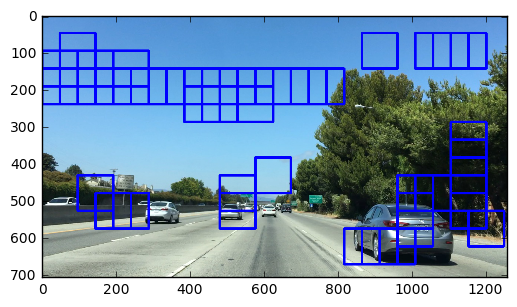

In [124]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import cv2
import glob
import time
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
from skimage.feature import hog
# from lesson_functions import *
# NOTE: the next import is only valid for scikit-learn version <= 0.17
# for scikit-learn >= 0.18 use:
from sklearn.model_selection import train_test_split
# from sklearn.cross_validation import train_test_split

# Define a function to extract features from a single image window
# This function is very similar to extract_features()
# just for a single image rather than list of images
def single_img_features(img, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True):    
    #1) Define an empty list to receive features
    img_features = []
    #2) Apply color conversion if other than 'RGB'
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    else: feature_image = np.copy(img)      
    #3) Compute spatial features if flag is set
    if spatial_feat == True:
        spatial_features = bin_spatial(feature_image, size=spatial_size)
        #4) Append features to list
        img_features.append(spatial_features)
    #5) Compute histogram features if flag is set
    if hist_feat == True:
        hist_features = color_hist(feature_image, nbins=hist_bins)
        #6) Append features to list
        img_features.append(hist_features)
    #7) Compute HOG features if flag is set
    if hog_feat == True:
        if hog_channel == 'ALL':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                hog_features.extend(get_hog_features(feature_image[:,:,channel], 
                                    orient, pix_per_cell, cell_per_block, 
                                    vis=False, feature_vec=True))      
        else:
            hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                        pix_per_cell, cell_per_block, vis=False, feature_vec=True)
        #8) Append features to list
        img_features.append(hog_features)

    #9) Return concatenated array of features
    return np.concatenate(img_features)

# Define a function you will pass an image 
# and the list of windows to be searched (output of slide_windows())
def search_windows(img, windows, clf, scaler, color_space='RGB', 
                    spatial_size=(32, 32), hist_bins=32, 
                    hist_range=(0, 256), orient=9, 
                    pix_per_cell=8, cell_per_block=2, 
                    hog_channel=0, spatial_feat=True, 
                    hist_feat=True, hog_feat=True):

    #1) Create an empty list to receive positive detection windows
    on_windows = []
    #2) Iterate over all windows in the list
    for window in windows:
        #3) Extract the test window from original image
        test_img = cv2.resize(img[window[0][1]:window[1][1], window[0][0]:window[1][0]], (64, 64))      
        #4) Extract features for that window using single_img_features()
        features = single_img_features(test_img, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)
        #5) Scale extracted features to be fed to classifier
        test_features = scaler.transform(np.array(features).reshape(1, -1))
        #6) Predict using your classifier
        prediction = clf.predict(test_features)
        #7) If positive (prediction == 1) then save the window
        if prediction == 1:
            on_windows.append(window)
    #8) Return windows for positive detections
    return on_windows
    
    
    
# Read in cars and notcars
images = glob.glob('notes/hog_images/**/*.jpeg')
cars = []
notcars = []

for image in images:
    image_name = os.path.basename(image)
    if 'image' in image_name or 'extra' in image_name:
        notcars.append(image)
    else:
        cars.append(image)

# Reduce the sample size because
# The quiz evaluator times out after 13s of CPU time
sample_size = 500
cars = cars[0:sample_size]
notcars = notcars[0:sample_size]

### TODO: Tweak these parameters and see how the results change.
color_space = 'RGB' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9  # HOG orientations
pix_per_cell = 8 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
hog_channel = 0 # Can be 0, 1, 2, or "ALL"
spatial_size = (16, 16) # Spatial binning dimensions
hist_bins = 16    # Number of histogram bins
spatial_feat = True # Spatial features on or off
hist_feat = True # Histogram features on or off
hog_feat = True # HOG features on or off
y_start_stop = [None, None] # Min and max in y to search in slide_window()

car_features = extract_features(cars, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)
notcar_features = extract_features(notcars, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)

X = np.vstack((car_features, notcar_features)).astype(np.float64)                        
# Fit a per-column scaler
X_scaler = StandardScaler().fit(X)
# Apply the scaler to X
scaled_X = X_scaler.transform(X)

# Define the labels vector
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))


# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(
    scaled_X, y, test_size=0.2, random_state=rand_state)

print('Using:',orient,'orientations',pix_per_cell,
    'pixels per cell and', cell_per_block,'cells per block')
print('Feature vector length:', len(X_train[0]))
# Use a linear SVC 
svc = LinearSVC()
# Check the training time for the SVC
t=time.time()
svc.fit(X_train, y_train)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')
# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))
# Check the prediction time for a single sample
t=time.time()

image = mpimg.imread('notes/bbox-example-image.jpg')
draw_image = np.copy(image)

# Uncomment the following line if you extracted training
# data from .png images (scaled 0 to 1 by mpimg) and the
# image you are searching is a .jpg (scaled 0 to 255)
#image = image.astype(np.float32)/255

windows = slide_window(image, x_start_stop=[None, None], y_start_stop=y_start_stop, 
                    xy_window=(96, 96), xy_overlap=(0.5, 0.5))

hot_windows = search_windows(image, windows, svc, X_scaler, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)                       

window_img = draw_boxes(draw_image, hot_windows, color=(0, 0, 255), thick=6)                    

plt.imshow(window_img)

#### solution.py

In [125]:
# Define a function to extract features from a single image window
# This function is very similar to extract_features()
# just for a single image rather than list of images
def single_img_features(img, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True):    
    #1) Define an empty list to receive features
    img_features = []
    #2) Apply color conversion if other than 'RGB'
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    else: feature_image = np.copy(img)      
    #3) Compute spatial features if flag is set
    if spatial_feat == True:
        spatial_features = bin_spatial(feature_image, size=spatial_size)
        #4) Append features to list
        img_features.append(spatial_features)
    #5) Compute histogram features if flag is set
    if hist_feat == True:
        hist_features = color_hist(feature_image, nbins=hist_bins)
        #6) Append features to list
        img_features.append(hist_features)
    #7) Compute HOG features if flag is set
    if hog_feat == True:
        if hog_channel == 'ALL':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                hog_features.extend(get_hog_features(feature_image[:,:,channel], 
                                    orient, pix_per_cell, cell_per_block, 
                                    vis=False, feature_vec=True))      
        else:
            hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                        pix_per_cell, cell_per_block, vis=False, feature_vec=True)
        #8) Append features to list
        img_features.append(hog_features)

    #9) Return concatenated array of features
    return np.concatenate(img_features)

# Define a function you will pass an image 
# and the list of windows to be searched (output of slide_windows())
def search_windows(img, windows, clf, scaler, color_space='RGB', 
                    spatial_size=(32, 32), hist_bins=32, 
                    hist_range=(0, 256), orient=9, 
                    pix_per_cell=8, cell_per_block=2, 
                    hog_channel=0, spatial_feat=True, 
                    hist_feat=True, hog_feat=True):

    #1) Create an empty list to receive positive detection windows
    on_windows = []
    #2) Iterate over all windows in the list
    for window in windows:
        #3) Extract the test window from original image
        test_img = cv2.resize(img[window[0][1]:window[1][1], window[0][0]:window[1][0]], (64, 64))      
        #4) Extract features for that window using single_img_features()
        features = single_img_features(test_img, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)
        #5) Scale extracted features to be fed to classifier
        test_features = scaler.transform(np.array(features).reshape(1, -1))
        #6) Predict using your classifier
        prediction = clf.predict(test_features)
        #7) If positive (prediction == 1) then save the window
        if prediction == 1:
            on_windows.append(window)
    #8) Return windows for positive detections
    return on_windows

#### 33. False Positives

[classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/2b62a1c3-e151-4a0e-b6b6-e424fa46ceab/lessons/fd66c083-4ccb-4fe3-bda1-c29db76f50a0/concepts/f2516a53-ad84-47aa-87f1-6541b159f113)

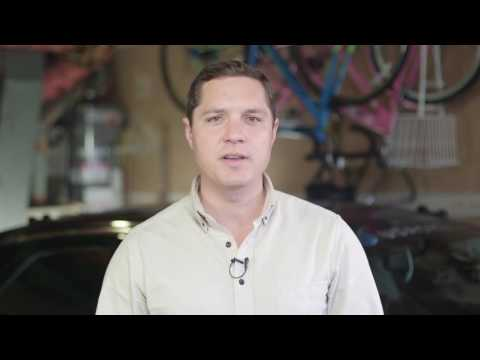

In [126]:
youtube('rihCsPhUSPk')

### 34. Multiple Detections & False Positives 

[classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/2b62a1c3-e151-4a0e-b6b6-e424fa46ceab/lessons/fd66c083-4ccb-4fe3-bda1-c29db76f50a0/concepts/de41bff0-ad52-493f-8ef4-5506a279b812)

Here are six consecutive frames from the project video and I'm showing all the bounding boxes for where my classifier reported positive detections. You can see that overlapping detections exist for each of the two vehicles, and in two of the frames, I find a false positive detection on the guardrail to the left. In this exercise, you'll build a heat-map from these detections in order to combine overlapping detections and remove false positives.

![](https://d17h27t6h515a5.cloudfront.net/topher/2017/January/588e7242_screen-shot-2017-01-29-at-2.52.00-pm/screen-shot-2017-01-29-at-2.52.00-pm.png)

To make a heat-map, you're simply going to add "heat" (+=1) for all pixels within windows where a positive detection is reported by your classifier. The individual heat-maps for the above images look like this:

![](https://d17h27t6h515a5.cloudfront.net/topher/2017/January/588eaef6_screen-shot-2017-01-29-at-7.11.18-pm/screen-shot-2017-01-29-at-7.11.18-pm.png)

In the exercise below, you are provided with a list of bounding boxes for the detections in the images shown above. Rather than consider heat-maps for each individual image, you'll write a function that adds "heat" to a map for a list of bounding boxes.

```python
def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap
```

If your classifier is working well, then the "hot" parts of the map are where the cars are, and by imposing a threshold, you can reject areas affected by false positives. So let's write a function to threshold the map as well.

```python
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap
```

In practice, you will want to integrate a heat map over several frames of video, such that areas of multiple detections get "hot", while transient false positives stay "cool". You can then simply threshold your heatmap to remove false positives.

Once you have a thresholded heat-map, there are many ways you could go about trying to figure out how many cars you have in each frame and which pixels belong to which cars, but one of the most straightforward solutions is to use the **label()** function from **scipy.ndimage.measurements**. You'll use it like this:

```python
from scipy.ndimage.measurements import label
labels = label(heatmap)
```

Now **labels** is a 2-tuple, where the first item is an array the size of the **heatmap** input image and the second element is the number of labels (cars) found.

In the above series of images the same false positive window appeared twice, so if I set a threshold of 2 (meaning set all values <= 2 to 0) and then run the **labels()** function. I get a result that 2 cars were identified (the two islands in the heat-map) and the labeled image where pixels are set to 0 for background, 1 for car number 1, and 2 for car number 2.

```python
heatmap = threshold(heatmap, 2)
labels = label(heatmap)
print(labels[1], 'cars found')
plt.imshow(labels[0], cmap='gray')
```

2 cars found

![](https://d17h27t6h515a5.cloudfront.net/topher/2017/January/588e95cb_screen-shot-2017-01-29-at-5.23.31-pm/screen-shot-2017-01-29-at-5.23.31-pm.png)

Next, you can take your labels image and put bounding boxes around the labeled regions. You could do this in the following manner:

```python
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import cv2

def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    # Return the image
    return img

# Read in the last image above
image = mpimg.imread('img105.jpg')
# Draw bounding boxes on a copy of the image
draw_img = draw_labeled_bboxes(np.copy(image), labels)
# Display the image
plt.imshow(draw_img)
```

And the output looks like this:

![](https://d17h27t6h515a5.cloudfront.net/topher/2017/January/588eacf1_screen-shot-2017-01-29-at-6.53.54-pm/screen-shot-2017-01-29-at-6.53.54-pm.png)

**The quiz below doesn't work yet due to data upload issues, but grab the code from the examples above and try these methods on your local machine!**

In [ ]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import pickle

# Read in a pickle file with bboxes saved
bbdict = pickle.load( open( "bbox_pickle.p", "rb" ))
# Extract "bboxes" field from bbdict
# Each item in the "all_bboxes" list will contain a 
# list of boxes for one of the images shown above
all_bboxes = bbdict["bboxes"]

# Read in the last image shown above 
image = mpimg.imread('img105.jpeg')
heat = np.zeros_like(image[:,:,0]).astype(np.float)

def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in boxlist:
        # Add += 1 for all pixels inside each bbox
        heat[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1
    
    # Return updated heatmap
    return heatmap
    
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap


for idx, boxlist in enumerate(bboxes):
    
    
    

final_map = np.clip(heat - 2, 0, 255)
plt.imshow(final_map, cmap='hot')

### 35. Tracking Pipeline

[classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/2b62a1c3-e151-4a0e-b6b6-e424fa46ceab/lessons/fd66c083-4ccb-4fe3-bda1-c29db76f50a0/concepts/25dfc755-6f49-42f8-b617-f3c145c12f5e)

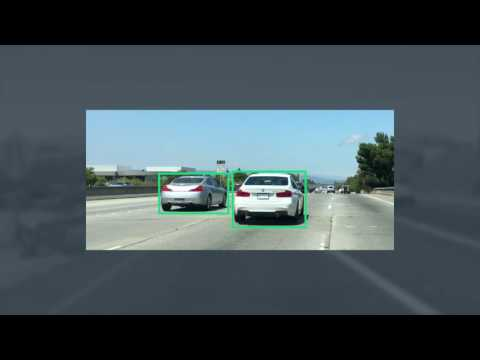

In [3]:
youtube('ioaSZFCn3iI')

### 36. Summary

[classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/2b62a1c3-e151-4a0e-b6b6-e424fa46ceab/lessons/fd66c083-4ccb-4fe3-bda1-c29db76f50a0/concepts/5b455624-ec3a-4600-9e29-368d7f12a3d0)

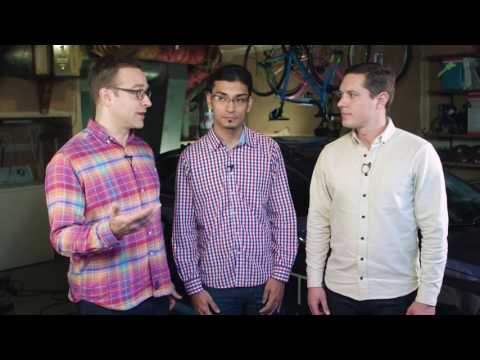

In [4]:
youtube('3ceKmVDQfFQ')

### 37. Tips and Tricks for the Project

[classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/2b62a1c3-e151-4a0e-b6b6-e424fa46ceab/lessons/fd66c083-4ccb-4fe3-bda1-c29db76f50a0/concepts/ea732214-fbc2-42b5-ad40-97a06a95b8ee)

![](https://d17h27t6h515a5.cloudfront.net/topher/2016/December/585c4229_multi-vehicle-bbox/multi-vehicle-bbox.jpg)

#### Extract HOG features just once for the entire region of interest in each full image / video frame

In one of the previous exercises you extracted HOG features from each individual window as you searched across the image, but it turns out this is rather inefficient. To speed things up, extract HOG features just once for the entire region of interest (i.e. lower half of each frame of video) and subsample that array for each sliding window. To do this, apply **skimage.feature.hog()** with the flag **feature_vec=False**, like this:

```python
from skimage.feature import hog
orient = 9
pix_per_cell = 8
cell_per_block = 2

feature_array = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell), cells_per_block=(cell_per_block, cell_per_block), visualise=False, feature_vector=False)
```

The output **feature_array** will have a shape of **(n_yblocks, n_xblocks, 2, 2, 9)**, where **n_yblocks** and **n_xblocks** are determined by the shape of your region of interest (i.e. how many blocks fit across and down your image in x and y).

So, for example, if you used **cells_per_block=2** in extracting features from the 64x64 pixel training images, then you would want to extract subarrays of shape **(7, 7, 2, 2, 9)** from **feature_array** and then use **np.ravel()** to unroll the feature vector.

#### Make sure your images are scaled correctly

The training dataset provided for this project ( [vehicle](https://s3.amazonaws.com/udacity-sdc/Vehicle_Tracking/vehicles.zip) and [non-vehicle](https://s3.amazonaws.com/udacity-sdc/Vehicle_Tracking/non-vehicles.zip) images) are in the **.png** format. Somewhat confusingly, **matplotlib image** will read these in on a scale of **0 to 1**, but **cv2.imread()** will scale them from **0 to 255**. Be sure if you are switching between **cv2.imread()** and **matplotlib image** for reading images that you scale them appropriately! Otherwise your feature vectors can get screwed up.

To add to the confusion, **matplotlib image** will read **.jpg** images in on a scale of 0 to 255 so if you are testing your pipeline on **.jpg** images remember to scale them accordingly. And if you take an image that is scaled from 0 to 1 and change color spaces using cv2.cvtColor() you'll get back an image scaled from 0 to 255. So just be sure to be consistent between your training data features and inference features!

#### Be sure to normalize your training data

Use sklearn.preprocessing.StandardScaler() to normalize your feature vectors for training your classifier as described in this lesson. Then apply the same scaling to each of the feature vectors you extract from windows in your test images.

#### Random shuffling of data

When dealing with image data that was extracted from video, you may be dealing with sequences of images where your target object (vehicles in this case) appear almost identical in a whole series of images. In such a case, even a randomized train-test split will be subject to overfitting because images in the training set may be nearly identical to images in the test set.

For the project [vehicles](https://s3.amazonaws.com/udacity-sdc/Vehicle_Tracking/vehicles.zip) dataset, the GTI* folders contain time-series data. In the KITTI folder, you may see the same vehicle appear more than once, but typically under significantly different lighting/angle from other instances.

While it is possible to achieve a sufficiently good result on the project without worrying about time-series issues, if you really want to optimize your classifier, you should devise a train/test split that avoids having nearly identical images in both your training and test sets. This means extracting the time-series tracks from the GTI data and separating the images manually to make sure train and test images are sufficiently different from one another.

---

### Project Details

For this project, we provide you with a labeled dataset and your job is to decide what features to extract, then train a classifier and ultimately track vehicles in a video stream. Here are links to the labeled data for [vehicle](https://s3.amazonaws.com/udacity-sdc/Vehicle_Tracking/vehicles.zip) and [non-vehicle](https://s3.amazonaws.com/udacity-sdc/Vehicle_Tracking/non-vehicles.zip) examples to train your classifier. These example images come from a combination of the [GTI vehicle image database](http://www.gti.ssr.upm.es/data/Vehicle_database.html), the [KITTI vision benchmark suite](http://www.cvlibs.net/datasets/kitti/), and examples extracted from the project video itself.

Udacity recently released a labeled dataset of our own, which you are encouraged to take advantage of to augment your training data. You can find the Udacity data [here](https://github.com/udacity/self-driving-car/tree/master/annotations). In each of the folders containing images there's a csv file containing all the labels and bounding boxes. To add vehicle images to your training data, you'll need to use the csv files to extract the bounding box regions and scale them to the same size as the rest of the training images.

The project video will be the same one as for the [Advanced Lane Finding Project](https://github.com/udacity/CarND-Advanced-Lane-Lines). The reason for this is that, assuming you already have a working implementation of lane finding for this video, once your vehicle detection pipeline works, you can add it to your lane finding pipeline and do both analyses simultaneously! You can use the test images from the lane finding project to start with, or extract other frames from the video to work on.

### Project: Vehicle Detection and Tracking

[classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/2b62a1c3-e151-4a0e-b6b6-e424fa46ceab/lessons/fd66c083-4ccb-4fe3-bda1-c29db76f50a0/project)

#### Project Submission

##### The Goal of this Project
In this project, your goal is to write a software pipeline to identify vehicles in a video from a front-facing camera on a car. The test images and project video are available in the [project repository](https://github.com/udacity/CarND-Vehicle-Detection). There is an [writeup template](https://github.com/udacity/CarND-Vehicle-Detection/blob/master/writeup_template.md) in the repostitory provided as a starting point for your writeup of the project.

##### The Writeup
The writeup you create for this project will be the primary output or product you are expected to submit (along with your code of course).

A great writeup should include the rubric points as well as your description of how you addressed each point. You should include a detailed description of the code used in each step (with line-number references and code snippets where necessary), and links to other supporting documents or external references. You should include images in your writeup to demonstrate how your code works with examples. Checkout the [writeup template](https://github.com/udacity/CarND-Vehicle-Detection/blob/master/writeup_template.md) in the [project repo](https://github.com/udacity/CarND-Vehicle-Detection) as a starting point.

All that said, please be concise! We're not looking for you to write a book here, just a brief description of how you passed each rubric point, and references to the relevant code :).

You can submit your writeup in markdown or use another method and submit a pdf instead.

##### Your Code

Your code should be commented well and stand on its own as readable material. You should explain, both in the code comments as well as in your writeup, how your code works and why you wrote it that way. In short, you want to make it easy for a reviewer to understand your code and how you used it in your project. You are more than welcome to use code from the lesson or elsewhere but if you copy/paste something, just make sure to attribute it to the original source and explain how it works and why you are using it.

##### What it Takes to Pass

Check out the [project rubric](https://review.udacity.com/#!/rubrics/513/view) for details on what the requirements are for a passing submission. Your writeup should include each rubric point and your description of how you addressed that point in your submission. The [project repo](https://github.com/udacity/CarND-Vehicle-Detection) provides an [example template](https://github.com/udacity/CarND-Vehicle-Detection/blob/master/writeup_template.md) for your writeup.

There is no starter code provided, but you are welcome to use code from the lesson and quizzes as you like. You may complete the project in a Jupyter notebook, but it's not required. Feel free to build it as a standalone project.

To help the reviewer evaluate your project, please save example images from each stage of your pipeline to the **output_images** folder and provide a description of what each image shows in your writeup for the project. Please also save your output video and include it with your submission.

##### Evaluation

Once you have completed your project, double check the [Project Rubric](https://review.udacity.com/#!/rubrics/513/view) to make sure you have addressed all the rubric points. Your project will be evaluated by a Udacity reviewer according to that same rubric.

Your project must "meet specifications" in each category in order for your submission to pass. If you are happy with your submission, then you are ready to submit! If you see room for improvement in **any** category in which you do not meet specifications, keep working!

##### Submission

What to include in your submission
Include a zipped file with your writeup and all your code (or Jupyter Notebook) and example output images and video. Alternatively, you may submit a link to your GitHub repo for your project. In either case, **Remember to include example images for each stage of your pipeline and your final output video in your submission.**

##### Ready to submit your project?

Click on the "Submit Project" button and follow the instructions to submit!